# Audio Classification Using KNN

In [1]:
from __future__ import print_function, division
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import audio_task
%matplotlib inline

### Feature selection

In [2]:
######### PARAMETERS ##################
# 1 sample = 1/4096 of a second

parameters = {
'size':256, # how long each window is, in samples
'step':128, # how many samples to move forward in each window
'decimate':1, # how much reduction of the feature vector to perform; integer = 1,2,3,4,5...
'feature_range' :(0.0, 1.0), # what slice of the feature vectors to take (0.0, 1.0)=whole vector
# must be between 0.0 and 1.0 for the start and end 
'window_fn':"boxcar", # one of window_fns (below)
'feature_fn':"raw" # one of feature_fns    
}
#####################################

# valid feature_fns: ['dct', 'fft', 'fft_phase', 'dct_phase', 'cepstrum', 'raw'])
# valid window_fns: ['hamming', 'hann', 'boxcar', 'blackmanharris']

In [3]:
X, y = audio_task.load_data(parameters)
print("X shape", X.shape, "y shape", y.shape)

Loading into 701 windows of length 256
Loading into 1644 windows of length 256
Loading into 1413 windows of length 256
Loading into 1999 windows of length 256
Loading into 1939 windows of length 256
Using raw transform and a boxcar window.
X shape (7696, 256) y shape (7696,)


In [4]:
!pip install --no-cache --user umap-learn

## Visualisation

* PCA `sklearn.decomposition.pca`
* LLE `sklearn.manifold.LocallyLinearEmbedding`
* ISOMAP `sklearn.manifold.Isomap`
* tSNE `sklearn.manifold.TSNE`
* UMAP `umap

(-1.0052229447510563,
 1.2427393077661868,
 -0.5432731836868564,
 1.5505097473791203)

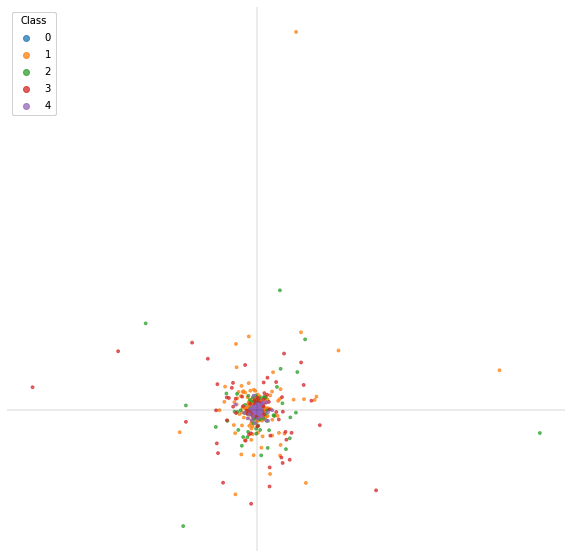

In [5]:
import sklearn.decomposition, sklearn.manifold, umap

# example showing PCA of features
fig, ax = plt.subplots(figsize=(10, 10))

# create a PCA object
pca = sklearn.decomposition.PCA(n_components=2)

# transform every fifth vector (to save computation time)
# some techniques need this; others will be fast enough
subsample = 5
pca_X = pca.fit_transform(X[::subsample, :])

# show a scatter plot of the first two dimensions
scatter = ax.scatter(
    pca_X[:, 0],
    pca_X[:, 1],
    c=y[::subsample],
    cmap="tab10",
    vmin=0,
    vmax=10,
    alpha=0.7,
    s=8,
)


##### Make the figure look a bit cleaner
# Produce a legend for the ranking (colors). Even though there are 40 different
# rankings, we only want to show 5 of them in the legend.
legend1 = ax.legend(*scatter.legend_elements(num=4), loc="upper left", title="Class")
ax.add_artist(legend1)

ax.axhline(0, color="k", alpha=0.1)
ax.axvline(0, color="k", alpha=0.1)

ax.axis("off")

## Classifier
The code below creates a standard KNN classifier which predicts the output class based on the 7 nearest elements in feature vector space. 

In [6]:
# fit a classifier
classifier = audio_task.knn_fit(X, y)

### Visualising predictions 

Testing with data/challenge_test_0
Loading into 613 windows of length 256
Predicting...
Prediction accuracy 0.091
Confusion matrix
[[ 20   4 227 225  15]
 [ 15  32  62 179  40]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 13   2  50  62  37]]

Testing with data/challenge_test_1
Loading into 950 windows of length 256
Predicting...
Prediction accuracy 0.255
Confusion matrix
[[ 23  13 117 221  84]
 [  0   0   0   0   0]
 [  7  30  79 163  26]
 [ 10  53 111 226  56]
 [ 14  19  63 148  60]]

Testing with data/challenge_test_2
Loading into 429 windows of length 256
Predicting...
Prediction accuracy 0.248
Confusion matrix
[[  0   0   0   0   0]
 [  9  16  23  54  13]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 23   9 127 260 155]]

Testing with data/challenge_test_3
Loading into 886 windows of length 256
Predicting...
Prediction accuracy 0.274
Confusion matrix
[[ 28   2 157 273  14]
 [ 26  75  63 202 107]
 [  0   0   0   0   0]
 [ 14  51  89 286  33]
 [  0   0   0   0   0]]

Testing 

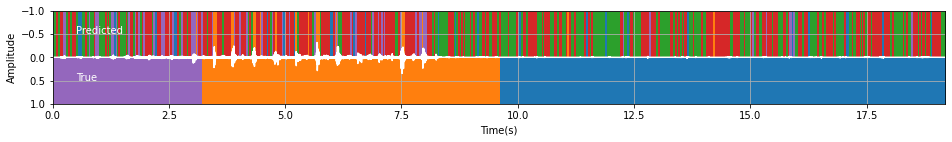

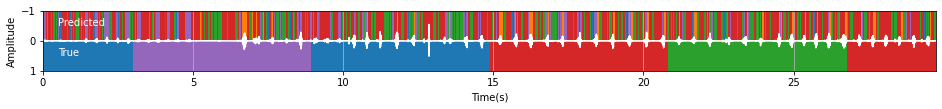

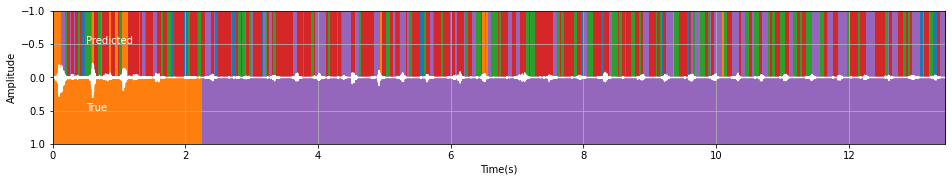

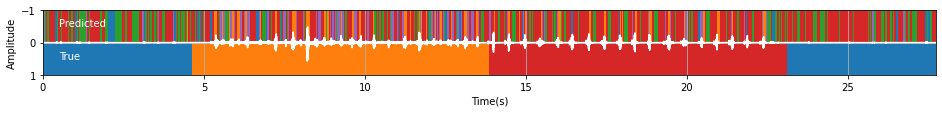

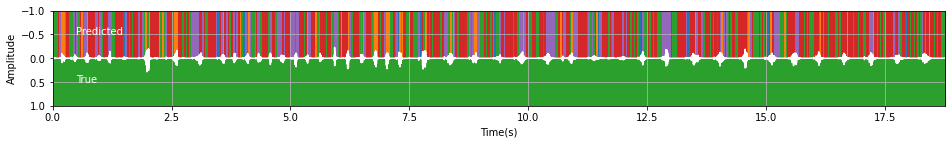

In [7]:
## Example usage -- show results for all of the test cases
for i in range(5):
    audio_task.plot_test(classifier, parameters, f"data/challenge_test_{i}")

### Final test function

In [8]:
## Shows how to evaluate your performance
score = audio_task.run_secret_test(classifier, parameters)
print("Score: ", score)

Loading into 1553 windows of length 256
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 488 windows of length 256
Predicting...
Loading into 290 windows of length 256
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1388 windows of length 256
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 62 windows of length 256
Predicting...
Loading into 560 windows of length 256
Predicting...
Loading into 394 windows of length 256
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1177 windows of length 256
Predicting...
*** Total score: 62.47 ***
Score:  62.46600627797082


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### PCA

In [9]:
def plot_pca(i, j):
    # example showing PCA of features
    fig, ax = plt.subplots(figsize=(10, 10))

    # create a PCA object
    pca = sklearn.decomposition.PCA(n_components=2)

    # transform every fifth vector (to save computation time)
    # some techniques need this; others will be fast enough
    subsample = 5
    pca_X = pca.fit_transform(X[::subsample, :])

    # show a scatter plot of the first two dimensions
    scatter = ax.scatter(
    pca_X[:, 0],
    pca_X[:, 1],
    c=y[::subsample],
    cmap="tab10",
    vmin=0,
    vmax=10,
    alpha=0.7,
    s=8,
    )


    ##### Make the figure look a bit cleaner
    # Produce a legend for the ranking (colors). Even though there are 40 different
    # rankings, we only want to show 5 of them in the legend.
    legend1 = ax.legend(*scatter.legend_elements(num=4), loc="upper left", title="Class")
    ax.add_artist(legend1)
    ax.set_title(f"Feature: {i} \t Window: {j} ")
    ax.axhline(0, color="k", alpha=0.1)
    ax.axvline(0, color="k", alpha=0.1)
    ax.axis("off")

In [10]:
#fit a classifier
def features_classify(X, y, parameters):
    classifier=audio_task.knn_fit(X, y)
    
    #Prediction using visualization for the training data
    for i in range(5):
        audio_task.plot_test(classifier, parameters, f"data/challenge_test_{i}")
        
    score=test_accuracy(classifier, parameters)
    return score

#Finding the accuracy of the test set
def test_accuracy(classifier, parameters):
    score = audio_task.run_secret_test(classifier, parameters)
    return score

Feature: dct 	 Window: hamming
Loading into 130 windows of length 1012
Loading into 306 windows of length 1012
Loading into 263 windows of length 1012
Loading into 372 windows of length 1012
Loading into 361 windows of length 1012
Using dct transform and a hamming window.
X shape:  (1432, 1012) y shape:  (1432,) 


Testing with data/challenge_test_0
Loading into 113 windows of length 1012
Predicting...
Prediction accuracy 0.449
Confusion matrix
[[284   0  52 137  18]
 [ 39  96  71  62  60]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  9   9  41  44  61]]

Testing with data/challenge_test_1
Loading into 176 windows of length 1012
Predicting...
Prediction accuracy 0.267
Confusion matrix
[[ 43  26  96 236  57]
 [  0   0   0   0   0]
 [  9  35  71 122  68]
 [ 25  88  87 223  33]
 [ 53   0  27 155  69]]

Testing with data/challenge_test_2
Loading into 79 windows of length 1012
Predicting...
Prediction accuracy 0.533
Confusion matrix
[[  0   0   0   0   0]
 [  9  31  18  27  30]
 [  0   

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 53 windows of length 1012
Predicting...
Loading into 258 windows of length 1012
Predicting...
Loading into 11 windows of length 1012
Predicting...
Loading into 104 windows of length 1012
Predicting...
Loading into 73 windows of length 1012
Predicting...
Loading into 219 windows of length 1012
Predicting...
*** Total score: 66.74 ***
Feature: dct 	 Window: hann
Loading into 17 windows of length 5279
Loading into 41 windows of length 5279
Loading into 35 windows of length 5279
Loading into 50 windows of length 5279
Loading into 48 windows of length 5279
Using dct transform and a hann window.
X shape:  (191, 5279) y shape:  (191,) 


Testing with data/challenge_test_0
Loading into 15 windows of length 5279
Predicting...
Prediction accuracy 0.701
Confusion matrix
[[491   0   0   0   0]
 [ 35  70  70  70  83]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 36   0   0   0 128]]

Testing with data/challenge_test_1
Loading into 23 windows of length 5279
Predicting...
Prediction a

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 848 windows of length 2959
Loading into 727 windows of length 2959
Loading into 1034 windows of length 2959
Loading into 1002 windows of length 2959
Using dct transform and a boxcar window.
X shape:  (3966, 2959) y shape:  (3966,) 


Testing with data/challenge_test_0
Loading into 309 windows of length 2959
Predicting...
Prediction accuracy 0.664
Confusion matrix
[[491   0   0   0   0]
 [117  70  76  25  40]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 29   7  36   0  92]]

Testing with data/challenge_test_1
Loading into 486 windows of length 2959
Predicting...
Prediction accuracy 0.221
Confusion matrix
[[ 50  24  16 239 129]
 [  0   0   0   0   0]
 [ 51  50  34 123  47]
 [ 19  88 159 152  38]
 [ 57   0   3 144 100]]

Testing with data/challenge_test_2
Loading into 213 windows of length 2959
Predicting...
Prediction accuracy 0.808
Confusion matrix
[[  0   0   0   0]
 [  6  38   0  71]
 [  0   0   0   0]
 [ 32   0  23 519]]

Testing with data/challenge_test_3
Loading in

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 244 windows of length 2959
Predicting...
Loading into 141 windows of length 2959
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classificat

Loading into 714 windows of length 2959
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 22 windows of length 2959
Predicting...
Loading into 282 windows of length 2959
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 195 windows of length 2959
Predicting...
Loading into 604 windows of length 2959
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\Downloads\Audio Classification\audio_task.py:162: RuntimeWarning

*** Total score: 72.12 ***
Feature: dct 	 Window: blackmanharris
Loading into 96 windows of length 1099
Loading into 226 windows of length 1099
Loading into 194 windows of length 1099
Loading into 275 windows of length 1099
Loading into 267 windows of length 1099
Using dct transform and a blackmanharris window.
X shape:  (1058, 1099) y shape:  (1058,) 


Testing with data/challenge_test_0
Loading into 84 windows of length 1099
Predicting...
Prediction accuracy 0.314
Confusion matrix
[[179   0 206  83  23]
 [ 35  83 155  43  12]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 17   0  48  52  47]]

Testing with data/challenge_test_1
Loading into 130 windows of length 1099
Predicting...
Prediction accuracy 0.295
Confusion matrix
[[ 48  24  53 263  70]
 [  0   0   0   0   0]
 [  0  35 142 125   3]
 [ 36  70  95 200  55]
 [ 47   0  71 127  59]]

Testing with data/challenge_test_2
Loading into 59 windows of length 1099
Predicting...
Prediction accuracy 0.463
Confusion matrix
[[  0   0   0  

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 8 windows of length 1099
Predicting...
Loading into 77 windows of length 1099
Predicting...
Loading into 54 windows of length 1099
Predicting...
Loading into 162 windows of length 1099
Predicting...
*** Total score: 60.41 ***
Feature: fft 	 Window: hamming
Loading into 75 windows of length 2266
Loading into 178 windows of length 2266
Loading into 152 windows of length 2266
Loading into 216 windows of length 2266
Loading into 210 windows of length 2266
Using fft transform and a hamming window.
X shape:  (831, 2266) y shape:  (831,) 


Testing with data/challenge_test_0
Loading into 65 windows of length 2266
Predicting...
Prediction accuracy 0.773
Confusion matrix
[[491   0   0   0   0]
 [ 82 123  61  30  32]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 18   0   0   0 146]]

Testing with data/challenge_test_1
Loading into 102 windows of length 2266
Predicting...
Prediction accuracy 0.207
Confusion matrix
[[ 68  15  31 244 100]
 [  0   0   0   0   0]
 [ 15  57   0 112 121

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 6 windows of length 2266
Predicting...
Loading into 60 windows of length 2266
Predicting...
Loading into 42 windows of length 2266
Predicting...
Loading into 127 windows of length 2266
Predicting...
*** Total score: 65.03 ***
Feature: fft 	 Window: hann
Loading into 95 windows of length 1750
Loading into 225 windows of length 1750
Loading into 193 windows of length 1750
Loading into 274 windows of length 1750
Loading into 266 windows of length 1750
Using fft transform and a hann window.
X shape:  (1053, 1750) y shape:  (1053,) 


Testing with data/challenge_test_0
Loading into 83 windows of length 1750
Predicting...
Prediction accuracy 0.609
Confusion matrix
[[365   0  18  72  36]
 [ 52  96  36  84  60]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 14   0   0  12 138]]

Testing with data/challenge_test_1
Loading into 130 windows of length 1750
Predicting...
Prediction accuracy 0.259
Confusion matrix
[[ 60  12  23 246 117]
 [  0   0   0   0   0]
 [ 22  27  35 137  84]
 [

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

*** Total score: 69.15 ***
Feature: fft 	 Window: boxcar
Loading into 19 windows of length 5242
Loading into 44 windows of length 5242
Loading into 38 windows of length 5242
Loading into 54 windows of length 5242
Loading into 52 windows of length 5242
Using fft transform and a boxcar window.
X shape:  (207, 5242) y shape:  (207,) 


Testing with data/challenge_test_0
Loading into 16 windows of length 5242
Predicting...
Prediction accuracy 0.899
Confusion matrix
[[491   0   0]
 [  0 262  66]
 [ 33   0 131]]

Testing with data/challenge_test_1
Loading into 25 windows of length 5242
Predicting...
Prediction accuracy 0.250
Confusion matrix
[[ 32  32   0 273 121]
 [  0   0   0   0   0]
 [  0  45 126  70  64]
 [  0 304   0 152   0]
 [ 63   0   0 171  70]]

Testing with data/challenge_test_2
Loading into 11 windows of length 5242
Predicting...
Prediction accuracy 0.884
Confusion matrix
[[ 35  80]
 [  0 574]]

Testing with data/challenge_test_3
Loading into 24 windows of length 5242
Predicting

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 7 windows of length 5242
Predicting...
Loading into 37 windows of length 5242
Predicting...
Loading into 1 windows of length 5242
Predicting...
Loading into 15 windows of length 5242
Predicting...
Loading into 10 windows of length 5242
Predicting...
Loading into 32 windows of length 5242
Predicting...
*** Total score: 68.46 ***
Feature: fft 	 Window: blackmanharris
Loading into 1323 windows of length 1293


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 3126 windows of length 1293
Loading into 2683 windows of length 1293
Loading into 3804 windows of length 1293
Loading into 3688 windows of length 1293
Using fft transform and a blackmanharris window.
X shape:  (14624, 1293) y shape:  (14624,) 


Testing with data/challenge_test_0
Loading into 1154 windows of length 1293
Predicting...
Prediction accuracy 0.253
Confusion matrix
[[144   0 174 106  67]
 [ 25  46 201  23  33]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  9   2  80  14  59]]

Testing with data/challenge_test_1
Loading into 1799 windows of length 1293
Predicting...
Prediction accuracy 0.253
Confusion matrix
[[ 21  13 123 222  79]
 [  0   0   0   0   0]
 [ 17  25  86 137  40]
 [  4  57 170 186  39]
 [ 23   3  57 129  92]]

Testing with data/challenge_test_2
Loading into 804 windows of length 1293
Predicting...
Prediction accuracy 0.491
Confusion matrix
[[  0   0   0   0   0]
 [  8  18  44  18  27]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 50   2 128  74

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 916 windows of length 1293
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 538 windows of length 1293
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 2635 windows of length 1293
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 103 windows of length 1293
Predicting...
Loading into 1054 windows of length 1293
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 737 windows of length 1293
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 2233 windows of length 1293
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 73.39 ***
Feature: fft_phase 	 Window: hamming
Loading into 41 windows of length 2928
Loading into 98 windows of length 2928
Loading into 84 windows of length 2928
Loading into 119 windows of length 2928
Loading into 115 windows of length 2928
Using fft_phase transform and a hamming window.
X shape:  (457, 2928) y shape:  (457,) 


Testing with data/challenge_test_0
Loading into 36 windows of length 2928
Predicting...
Prediction accuracy 0.123
Confusion matrix
[[ 28  84  56 211 112]
 [  0  56  56 169  47]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0  28  71  28  37]]

Testing with data/challenge_test_1
Loading into 56 windows of length 2928
Predicting...
Prediction accuracy 0.183
Confusion matrix
[[  0  97  28 193 140]
 [  0   0   0   0   0]
 [ 28 110  28  84  55]
 [ 27  69 110 167  83]
 [ 56  82  28  55  83]]

Testing with data/challenge_test_2
Loading into 25 windows of length 2928
Predicting...
Prediction accuracy 0.269
Confusion matrix
[[ 15   0  43  57]
 [ 

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 28 windows of length 2928
Predicting...
Loading into 17 windows of length 2928
Predicting...
Loading into 82 windows of length 2928
Predicting...
Loading into 3 windows of length 2928
Predicting...
Loading into 33 windows of length 2928
Predicting...
Loading into 23 windows of length 2928
Predicting...
Loading into 70 windows of length 2928
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 43.44 ***
Feature: fft_phase 	 Window: hann
Loading into 221 windows of length 783
Loading into 520 windows of length 783
Loading into 447 windows of length 783
Loading into 633 windows of length 783
Loading into 613 windows of length 783
Using fft_phase transform and a hann window.
X shape:  (2434, 783) y shape:  (2434,) 


Testing with data/challenge_test_0
Loading into 193 windows of length 783
Predicting...
Prediction accuracy 0.188
Confusion matrix
[[ 37 156  76 140  82]
 [ 61 100  54  93  20]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 20  49  37  10  48]]

Testing with data/challenge_test_1
Loading into 300 windows of length 783
Predicting...
Prediction accuracy 0.193
Confusion matrix
[[ 67  99  70  67 155]
 [  0   0   0   0   0]
 [ 20 108  41  57  79]
 [ 40 136  56 131  93]
 [ 20  76  68  85  55]]

Testing with data/challenge_test_2
Loading into 135 windows of length 783
Predicting...
Prediction accuracy 0.192
Confusion matrix
[[  0   0   0   0   0]
 [ 11 

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 439 windows of length 783
Predicting...
Loading into 19 windows of length 783
Predicting...
Loading into 177 windows of length 783
Predicting...
Loading into 124 windows of length 783
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 372 windows of length 783
Predicting...
*** Total score: 56.85 ***
Feature: fft_phase 	 Window: boxcar
Loading into 153 windows of length 1971
Loading into 363 windows of length 1971
Loading into 311 windows of length 1971
Loading into 442 windows of length 1971
Loading into 428 windows of length 1971
Using fft_phase transform and a boxcar window.
X shape:  (1697, 1971) y shape:  (1697,) 


Testing with data/challenge_test_0
Loading into 134 windows of length 1971
Predicting...
Prediction accuracy 0.014
Confusion matrix
[[  0   0 248 243   0]
 [  0  14 160 154   0]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0   8  97  59   0]]

Testing with data/challenge_test_1
Loading into 209 windows of length 1971
Predicting...
Prediction accuracy 0.252
Confusion matrix
[[  0   0 268 190   0]
 [  0   0   0   0   0]
 [  0  15 217  73   0]
 [  0   7 282 167   0]
 [  0   7 211  86   0]]

Testing with data/challenge_test_2
Loading into 93 windows of length 1971
Predicting...
Predict

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 106 windows of length 1971
Predicting...
Loading into 62 windows of length 1971
Predicting...
Loading into 306 windows of length 1971
Predicting...
Loading into 11 windows of length 1971
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 122 windows of length 1971
Predicting...
Loading into 85 windows of length 1971
Predicting...
Loading into 259 windows of length 1971
Predicting...
*** Total score: 52.57 ***
Feature: fft_phase 	 Window: blackmanharris
Loading into 36 windows of length 4536
Loading into 86 windows of length 4536
Loading into 74 windows of length 4536
Loading into 105 windows of length 4536
Loading into 101 windows of length 4536
Using fft_phase transform and a blackmanharris window.
X shape:  (402, 4536) y shape:  (402,) 


Testing with data/challenge_test_0
Loading into 31 windows of length 4536
Predicting...
Prediction accuracy 0.233
Confusion matrix
[[ 97 181  66  49  98]
 [  0 116  65  65  82]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 33  65  50   0  16]]

Testing with data/challenge_test_1
Loading into 49 windows of length 4536
Predicting...
Prediction accuracy 0.116
Confusion matrix
[[ 10 222  32 114  80]
 [  0   0   0   0   0]
 [ 32  32  31  87 123]
 [ 32 126  96 104  98]
 [ 

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 2 windows of length 4536
Predicting...
Loading into 28 windows of length 4536
Predicting...
Loading into 20 windows of length 4536
Predicting...
Loading into 61 windows of length 4536
Predicting...
*** Total score: 43.99 ***
Feature: dct_phase 	 Window: hamming
Loading into 788 windows of length 115
Loading into 1848 windows of length 115
Loading into 1588 windows of length 115
Loading into 2246 windows of length 115
Loading into 2178 windows of length 115
Using dct_phase transform and a hamming window.
X shape:  (8648, 115) y shape:  (8648,) 


Testing with data/challenge_test_0
Loading into 689 windows of length 115
Predicting...
Prediction accuracy 0.208
Confusion matrix
[[ 48 143  74 135  91]
 [ 20 130  53  70  55]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 10  58  29  41  26]]

Testing with data/challenge_test_1
Loading into 1068 windows of length 115
Predicting...
Prediction accuracy 0.156
Confusion matrix
[[ 26 144 102  91  95]
 [  0   0   0   0   0]
 [ 21 142

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 549 windows of length 115
Predicting...
Loading into 327 windows of length 115
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1559 windows of length 115
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 71 windows of length 115
Predicting...
Loading into 630 windows of length 115
Predicting...
Loading into 444 windows of length 115
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1323 windows of length 115
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 64.55 ***
Feature: dct_phase 	 Window: hann
Loading into 88 windows of length 2440
Loading into 209 windows of length 2440
Loading into 180 windows of length 2440
Loading into 255 windows of length 2440
Loading into 247 windows of length 2440
Using dct_phase transform and a hann window.
X shape:  (979, 2440) y shape:  (979,) 


Testing with data/challenge_test_0
Loading into 77 windows of length 2440
Predicting...
Prediction accuracy 0.219
Confusion matrix
[[ 45  96  91 143 116]
 [  0 135  39  91  63]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0  39  65  25  35]]

Testing with data/challenge_test_1
Loading into 120 windows of length 2440
Predicting...
Prediction accuracy 0.148
Confusion matrix
[[  0 147  72 101 138]
 [  0   0   0   0   0]
 [  0  51  59 104  91]
 [  0  70 118 100 168]
 [ 26  33 102  77  66]]

Testing with data/challenge_test_2
Loading into 53 windows of length 2440
Predicting...
Prediction accuracy 0.284
Confusion matrix
[[  0   0   0   0   0]
 [

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 149 windows of length 2440
Predicting...
*** Total score: 51.70 ***
Feature: dct_phase 	 Window: boxcar
Loading into 78 windows of length 1299
Loading into 185 windows of length 1299
Loading into 159 windows of length 1299
Loading into 225 windows of length 1299
Loading into 218 windows of length 1299
Using dct_phase transform and a boxcar window.
X shape:  (865, 1299) y shape:  (865,) 


Testing with data/challenge_test_0
Loading into 69 windows of length 1299
Predicting...
Prediction accuracy 0.220
Confusion matrix
[[ 29 135  87 181  59]
 [ 15 107  29 119  58]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0  15  28  41  80]]

Testing with data/challenge_test_1
Loading into 107 windows of length 1299
Predicting...
Prediction accuracy 0.183
Confusion matrix
[[ 14 110  72 121 141]
 [  0   0   0   0   0]
 [ 15  28  87 114  61]
 [ 43 116  73 136  88]
 [ 14 135  14 100  41]]

Testing with data/challenge_test_2
Loading into 48 windows of length 1299
Predicting...
Prediction

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 55 windows of length 1299
Predicting...
Loading into 32 windows of length 1299
Predicting...
Loading into 156 windows of length 1299
Predicting...
Loading into 7 windows of length 1299
Predicting...
Loading into 63 windows of length 1299
Predicting...
Loading into 44 windows of length 1299
Predicting...
Loading into 132 windows of length 1299
Predicting...
*** Total score: 52.15 ***
Feature: dct_phase 	 Window: blackmanharris
Loading into 31 windows of length 3691
Loading into 75 windows of length 3691
Loading into 64 windows of length 3691
Loading into 91 windows of length 3691
Loading into 88 windows of length 3691
Using dct_phase transform and a blackmanharris window.
X shape:  (349, 3691) y shape:  (349,) 


Testing with data/challenge_test_0
Loading into 27 windows of length 3691
Predicting...
Prediction accuracy 0.257
Confusion matrix
[[ 57 227   0 169  38]
 [ 19 158  38  38  75]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0 107   0  19  38]]

Testing with data

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 53 windows of length 3691
Predicting...
*** Total score: 50.84 ***
Feature: cepstrum 	 Window: hamming
Loading into 16 windows of length 5671
Loading into 38 windows of length 5671
Loading into 32 windows of length 5671
Loading into 46 windows of length 5671
Loading into 44 windows of length 5671
Using cepstrum transform and a hamming window.
X shape:  (176, 5671) y shape:  (176,) 


Testing with data/challenge_test_0
Loading into 14 windows of length 5671
Predicting...
Prediction accuracy 0.833
Confusion matrix
[[491   0   0]
 [ 76 252   0]
 [ 38  50  76]]

Testing with data/challenge_test_1
Loading into 22 windows of length 5671
Predicting...
Prediction accuracy 0.139
Confusion matrix
[[ 37  73   0 232 116]
 [  0   0   0   0   0]
 [  0 233   0  72   0]
 [  0 383   0  73   0]
 [ 73   0   0 130 101]]

Testing with data/challenge_test_2
Loading into 9 windows of length 5671
Predicting...
Prediction accuracy 0.772
Confusion matrix
[[ 44   0  71]
 [  0   0   0]
 [  0  86 488]

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 32 windows of length 5671
Predicting...
Loading into 1 windows of length 5671
Predicting...
Loading into 12 windows of length 5671
Predicting...
Loading into 9 windows of length 5671
Predicting...
Loading into 27 windows of length 5671
Predicting...
*** Total score: 63.78 ***
Feature: cepstrum 	 Window: hann
Loading into 61 windows of length 1730
Loading into 143 windows of length 1730
Loading into 123 windows of length 1730
Loading into 174 windows of length 1730
Loading into 169 windows of length 1730
Using cepstrum transform and a hann window.
X shape:  (670, 1730) y shape:  (670,) 


Testing with data/challenge_test_0
Loading into 53 windows of length 1730
Predicting...
Prediction accuracy 0.659
Confusion matrix
[[311   0  66 114   0]
 [ 19 205  66   0  38]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0  22  10   0 132]]

Testing with data/challenge_test_1
Loading into 83 windows of length 1730
Predicting...
Prediction accuracy 0.197
Confusion matrix
[[ 37  37  19

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 5 windows of length 1730
Predicting...
Loading into 48 windows of length 1730
Predicting...
Loading into 34 windows of length 1730
Predicting...
Loading into 102 windows of length 1730
Predicting...
*** Total score: 64.92 ***
Feature: cepstrum 	 Window: boxcar
Loading into 172 windows of length 666
Loading into 405 windows of length 666
Loading into 348 windows of length 666
Loading into 493 windows of length 666
Loading into 478 windows of length 666
Using cepstrum transform and a boxcar window.
X shape:  (1896, 666) y shape:  (1896,) 




C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Testing with data/challenge_test_0
Loading into 151 windows of length 666
Predicting...
Prediction accuracy 0.541
Confusion matrix
[[243   0  71  59 118]
 [ 39 190  42   0  57]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 13  27  21   4  99]]

Testing with data/challenge_test_1
Loading into 234 windows of length 666
Predicting...
Prediction accuracy 0.272
Confusion matrix
[[ 83  26  62 188  99]
 [  0   0   0   0   0]
 [ 53  92  56  77  27]
 [ 53  64 100 179  60]
 [ 86  13  27  82  96]]

Testing with data/challenge_test_2
Loading into 105 windows of length 666
Predicting...
Prediction accuracy 0.478
Confusion matrix
[[  0   0   0   0   0]
 [ 12  37  13   0  53]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [141  59  33  49 292]]

Testing with data/challenge_test_3
Loading into 218 windows of length 666
Predicting...
Prediction accuracy 0.470
Confusion matrix
[[206   0  40  89 139]
 [ 16 279  32  13 133]
 [  0   0   0   0   0]
 [ 61  79  74 183  76]
 [  0   0   0   0   0]]

Testing 

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 15 windows of length 666
Predicting...
Loading into 138 windows of length 666
Predicting...
Loading into 97 windows of length 666
Predicting...
Loading into 290 windows of length 666
Predicting...
*** Total score: 70.04 ***
Feature: cepstrum 	 Window: blackmanharris
Loading into 29 windows of length 3169
Loading into 70 windows of length 3169
Loading into 60 windows of length 3169
Loading into 85 windows of length 3169


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 82 windows of length 3169
Using cepstrum transform and a blackmanharris window.
X shape:  (326, 3169) y shape:  (326,) 


Testing with data/challenge_test_0
Loading into 26 windows of length 3169
Predicting...
Prediction accuracy 0.707
Confusion matrix
[[432   0   0  59   0]
 [ 40 158  39  78  13]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0   0   0  59 105]]

Testing with data/challenge_test_1
Loading into 40 windows of length 3169
Predicting...
Prediction accuracy 0.112
Confusion matrix
[[  0  39   0 255 164]
 [  0   0   0   0   0]
 [  0 117   8 102  78]
 [  0 156  90  54 156]
 [ 78   0   0 117 109]]

Testing with data/challenge_test_2
Loading into 18 windows of length 3169
Predicting...
Prediction accuracy 0.647
Confusion matrix
[[ 40  54  21]
 [  0   0   0]
 [  0 168 406]]

Testing with data/challenge_test_3
Loading into 37 windows of length 3169
Predicting...
Prediction accuracy 0.597
Confusion matrix
[[395  20   0  59   0]
 [ 20 316  79  19  39]
 [  0   0   0 

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 2 windows of length 3169
Predicting...
Loading into 23 windows of length 3169
Predicting...
Loading into 16 windows of length 3169
Predicting...
Loading into 50 windows of length 3169
Predicting...
*** Total score: 58.12 ***
Feature: raw 	 Window: hamming
Loading into 80 windows of length 1306
Loading into 188 windows of length 1306
Loading into 162 windows of length 1306
Loading into 229 windows of length 1306
Loading into 222 windows of length 1306
Using raw transform and a hamming window.
X shape:  (881, 1306) y shape:  (881,) 




C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Testing with data/challenge_test_0
Loading into 70 windows of length 1306
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0 163 328   0]
 [141   0  14 102  71]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [108   0  14  42   0]]

Testing with data/challenge_test_1
Loading into 108 windows of length 1306
Predicting...
Prediction accuracy 0.322
Confusion matrix
[[158  15  22 207  56]
 [  0   0   0   0   0]
 [ 38   0  12 212  43]
 [ 19   0  46 291 100]
 [111   0  14 150  29]]

Testing with data/challenge_test_2
Loading into 49 windows of length 1306
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0   0   0   0]
 [ 21   0  29  43  22]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [286   0  42 246   0]]

Testing with data/challenge_test_3
Loading into 101 windows of length 1306
Predicting...
Prediction accuracy 0.192
Confusion matrix
[[ 23   0  97 354   0]
 [255   0  28 105  85]
 [  0   0   0   0   0]
 [ 43  14  39 249 128]
 [  0   0   0   0   0]]

Testin

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 55 windows of length 1306
Predicting...
Loading into 33 windows of length 1306
Predicting...
Loading into 159 windows of length 1306
Predicting...
Loading into 7 windows of length 1306
Predicting...
Loading into 64 windows of length 1306
Predicting...
Loading into 45 windows of length 1306
Predicting...
Loading into 134 windows of length 1306
Predicting...
*** Total score: 41.54 ***
Feature: raw 	 Window: hann
Loading into 31 windows of length 4767
Loading into 74 windows of length 4767
Loading into 63 windows of length 4767
Loading into 90 windows of length 4767
Loading into 87 windows of length 4767
Using raw transform and a hann window.
X shape:  (345, 4767) y shape:  (345,) 


Testing with data/challenge_test_0
Loading into 27 windows of length 4767
Predicting...
Prediction accuracy 0.499
Confusion matrix
[[491   0   0]
 [328   0   0]
 [164   0   0]]

Testing with data/challenge_test_1
Loading into 42 windows of length 4767
Predicting...
Prediction accuracy 0.276
Confu

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 62 windows of length 4767
Predicting...
Loading into 2 windows of length 4767
Predicting...
Loading into 24 windows of length 4767
Predicting...
Loading into 17 windows of length 4767
Predicting...
Loading into 52 windows of length 4767
Predicting...
*** Total score: 15.80 ***
Feature: raw 	 Window: boxcar
Loading into 54 windows of length 4903
Loading into 130 windows of length 4903
Loading into 112 windows of length 4903
Loading into 159 windows of length 4903
Loading into 154 windows of length 4903
Using raw transform and a boxcar window.
X shape:  (609, 4903) y shape:  (609,) 


Testing with data/challenge_test_0
Loading into 47 windows of length 4903
Predicting...
Prediction accuracy 0.499
Confusion matrix
[[491   0   0]
 [328   0   0]
 [164   0   0]]

Testing with data/challenge_test_1
Loading into 74 windows of length 4903
Predicting...
Prediction accuracy 0.301
Confusion matrix
[[458   0   0   0]
 [305   0   0   0]
 [456   0   0   0]
 [304   0   0   0]]

Testing wi

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 37 windows of length 4903
Predicting...
Loading into 21 windows of length 4903
Predicting...
Loading into 110 windows of length 4903
Predicting...
Loading into 3 windows of length 4903
Predicting...
Loading into 43 windows of length 4903
Predicting...
Loading into 29 windows of length 4903
Predicting...
Loading into 93 windows of length 4903
Predicting...
*** Total score: 20.31 ***
Feature: raw 	 Window: blackmanharris
Loading into 32 windows of length 5335
Loading into 78 windows of length 5335
Loading into 67 windows of length 5335
Loading into 95 windows of length 5335
Loading into 92 windows of length 5335
Using raw transform and a blackmanharris window.
X shape:  (364, 5335) y shape:  (364,) 


Testing with data/challenge_test_0
Loading into 28 windows of length 5335
Predicting...
Prediction accuracy 0.499
Confusion matrix
[[491   0   0]
 [328   0   0]
 [164   0   0]]

Testing with data/challenge_test_1
Loading into 45 windows of length 5335
Predicting...
Prediction a

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 18 windows of length 5335
Predicting...
Loading into 55 windows of length 5335
Predicting...
*** Total score: 17.74 ***


C:\Users\vsneg\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:203: RuntimeWarning: Glyph 9 missing from current font.
  font.set_text(s, 0, flags=flags)


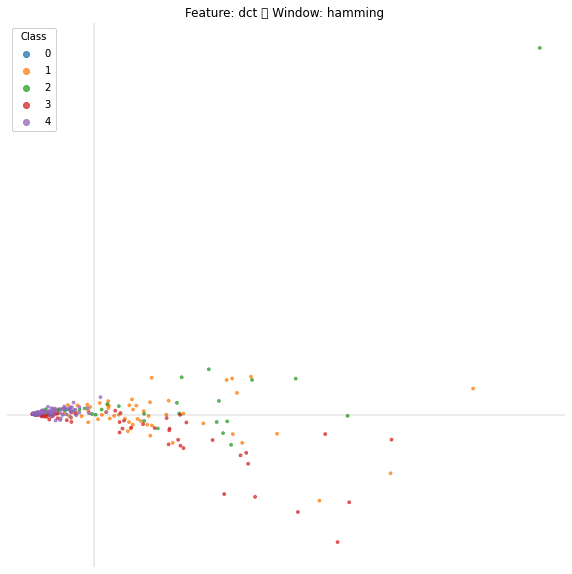

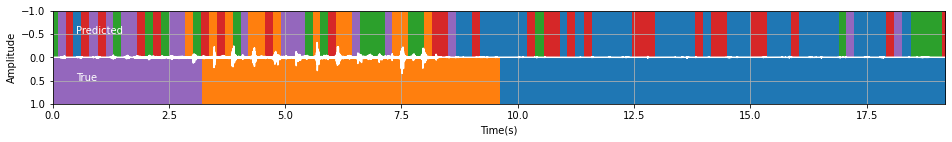

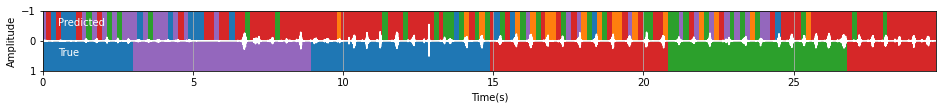

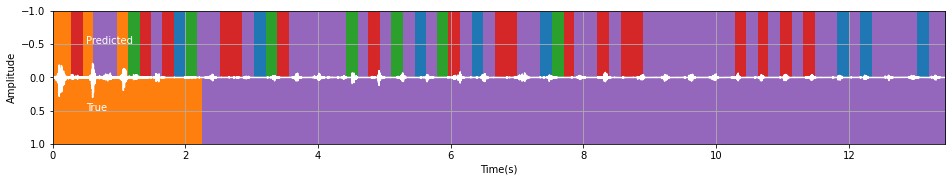

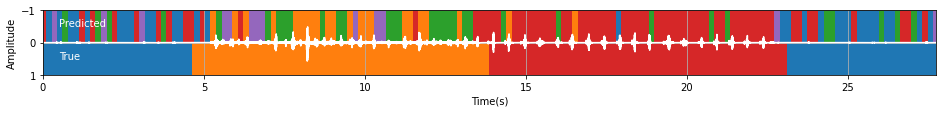

...

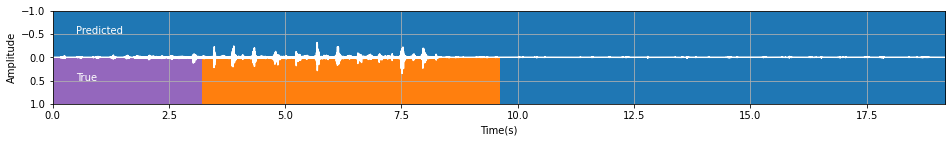

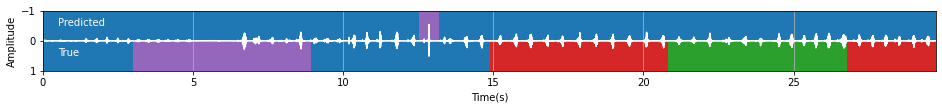

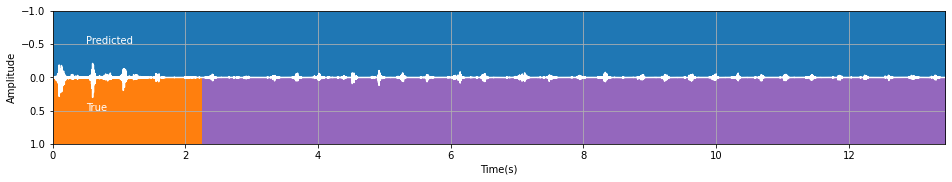

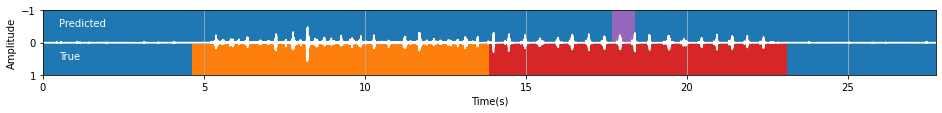

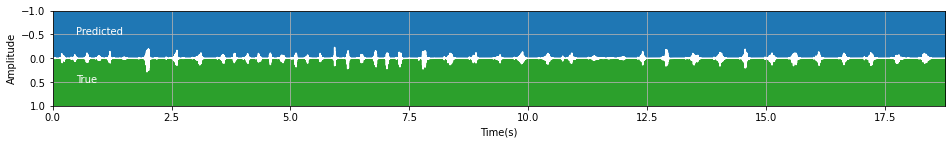

In [11]:
#creating a dictionary that stores features and windows values
score_features = {}

#Features
features = ['dct', 'fft', 'fft_phase', 'dct_phase', 'cepstrum', 'raw']
#Windows
windows = ['hamming', 'hann', 'boxcar', 'blackmanharris']

for i in features:
    for j in windows:
        
        #Random window size
        window_size = np.random.randint(36, 6000)
        #Random step size
        step_size = np.random.randint(36,window_size)
        
        #Creating different parameters with random window size for every combination of feature and window
        parameters = {
            'size': window_size,
            'step': step_size,
            'decimate': 1,
            'feature_range': (0.0, 1.0),
            'window_fn': j,
            'feature_fn': i
        }
        print(f"Feature: {i} \t Window: {j}")
        
        #Loading the data into a set of features and labels
        X, y = audio_task.load_data(parameters)
        print("X shape: ", X.shape, "y shape: ", y.shape, "\n\n")
        
        #PLotting the visualization
        plot_pca(i,j)
        
        #Classifying the feature vector space and creating a graph between true and predicted value
        score=features_classify(X, y, parameters)
        score_features[f"Feature -> {i} : Window -> {j} : Window_size -> {window_size} : Step_size -> {step_size}"] = score

In [12]:
#Sorting the scores from lowest to highest 
sorted_scores = {}
sorted_keys = sorted(score_features, key=score_features.get)

for i in sorted_keys:
    sorted_scores[i] = score_features[i]
    
for i in sorted_scores.keys():
    print((i, sorted_scores[i]))

('Feature -> raw : Window -> hann : Window_size -> 4767 : Step_size -> 2818', 15.796391921666928)
('Feature -> raw : Window -> blackmanharris : Window_size -> 5335 : Step_size -> 2646', 17.74307703168013)
('Feature -> raw : Window -> boxcar : Window_size -> 4903 : Step_size -> 1585', 20.30507229696116)
('Feature -> raw : Window -> hamming : Window_size -> 1306 : Step_size -> 1116', 41.54323516178041)
('Feature -> fft_phase : Window -> hamming : Window_size -> 2928 : Step_size -> 2136', 43.44284704253164)
('Feature -> fft_phase : Window -> blackmanharris : Window_size -> 4536 : Step_size -> 2414', 43.99011848373015)
('Feature -> dct_phase : Window -> blackmanharris : Window_size -> 3691 : Step_size -> 2795', 50.83760467143912)
('Feature -> dct_phase : Window -> hann : Window_size -> 2440 : Step_size -> 997', 51.701749428731546)
('Feature -> dct_phase : Window -> boxcar : Window_size -> 1299 : Step_size -> 1136', 52.15470605535242)
('Feature -> fft_phase : Window -> boxcar : Window_size 

In [13]:
#The best score that we get by using PCA is 73.39.
#Feature : fft
#Window : blackmanharris
#Window size : 1293
#Step size : 67

### Locally Linear Embedding

In [14]:
from sklearn.manifold import LocallyLinearEmbedding

def plot_lle(i, j):
    fig, ax=plt.subplots(figsize=(10,10))
     
    # create a lle object    
    lle=LocallyLinearEmbedding(n_components=2)
    
    # transform every fifth vector (to save computation time)
    # some techniques need this; others will be fast enough
    subsample = 5
    lle_X = lle.fit_transform(X[::subsample, :])
    
    # show a scatter plot of the first two dimensions
    scatter = ax.scatter(
        lle_X[:, 0],
        lle_X[:, 1],
        c=y[::subsample],
        cmap="tab10",
        vmin=0,
        vmax=10,
        alpha=0.7,
        s=8,
    )
    ##### Make the figure look a bit cleaner
    # Produce a legend for the ranking (colors). Even though there are 40 different
    # rankings, we only want to show 5 of them in the legend.
    legend1 = ax.legend(*scatter.legend_elements(num=4), loc="upper left", title="Class")
    ax.add_artist(legend1)
    ax.set_title(f"Feature: {i} \t Window: {j} ")
    ax.axhline(0, color="k", alpha=0.1)
    ax.axvline(0, color="k", alpha=0.1)
    ax.axis("off")

In [15]:
#fit a classifier
def lle_features(X, y, parameters):
    classifier = audio_task.knn_fit(X, y)
    
    #Prediction using visualization for the training data
    for i in range(5):
        audio_task.plot_test(classifier, parameters, f"data/challenge_test_{i}")
        
    score=test_accuracy_lle(classifier, parameters)
    return score

#Finding the accuracy of the test set
def test_accuracy_lle(classifier, parameters):
    score = audio_task.run_secret_test(classifier, parameters)
    return score

Feature: dct - Window: hamming
Loading into 40 windows of length 3930
Loading into 95 windows of length 3930
Loading into 82 windows of length 3930
Loading into 116 windows of length 3930
Loading into 113 windows of length 3930
Using dct transform and a hamming window.
X shape:  (446, 3930) y shape:  (446,) 


Testing with data/challenge_test_0
Loading into 35 windows of length 3930
Predicting...
Prediction accuracy 0.705
Confusion matrix
[[491   0   0   0   0]
 [ 72 116  53  58  29]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 73   0   5   0  86]]

Testing with data/challenge_test_1
Loading into 55 windows of length 3930
Predicting...
Prediction accuracy 0.204
Confusion matrix
[[ 43   0  43 234 138]
 [  0   0   0   0   0]
 [  0  49  28 116 112]
 [  0  94 182 152  28]
 [ 85   0   0 132  87]]

Testing with data/challenge_test_2
Loading into 24 windows of length 3930
Predicting...
Prediction accuracy 0.826
Confusion matrix
[[  0   0   0]
 [ 40  45  30]
 [ 50   0 524]]

Testing with d

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 191 windows of length 3179
Loading into 457 windows of length 3179
Loading into 391 windows of length 3179
Loading into 556 windows of length 3179
Loading into 539 windows of length 3179
Using dct transform and a hann window.
X shape:  (2134, 3179) y shape:  (2134,) 


Testing with data/challenge_test_0
Loading into 166 windows of length 3179
Predicting...
Prediction accuracy 0.659
Confusion matrix
[[485   0   6   0]
 [ 84  41 125  78]
 [  0   0   0   0]
 [ 42   0   0 122]]

Testing with data/challenge_test_1
Loading into 261 windows of length 3179
Predicting...
Prediction accuracy 0.206
Confusion matrix
[[ 44   6  30 237 141]
 [  0   0   0   0   0]
 [ 12  39  33 114 107]
 [ 18  84 130 152  72]
 [ 76   0   0 143  85]]

Testing with data/challenge_test_2
Loading into 115 windows of length 3179
Predicting...
Prediction accuracy 0.788
Confusion matrix
[[  0   0   0   0]
 [ 24  30  12  49]
 [  0   0   0   0]
 [ 49   0  12 513]]

Testing with data/challenge_test_3
Loading into 

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 75 windows of length 3179
Predicting...
Loading into 384 windows of length 3179
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 11 windows of length 3179
Predicting...
Loading into 152 windows of length 3179
Predicting...
Loading into 105 windows of length 3179
Predicting...
Loading into 325 windows of length 3179
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 69.92 ***
Feature: dct - Window: boxcar
Loading into 841 windows of length 2411
Loading into 2003 windows of length 2411
Loading into 1718 windows of length 2411
Loading into 2440 windows of length 2411
Loading into 2365 windows of length 2411
Using dct transform and a boxcar window.
X shape:  (9367, 2411) y shape:  (9367,) 


Testing with data/challenge_test_0
Loading into 733 windows of length 2411
Predicting...
Prediction accuracy 0.626
Confusion matrix
[[491   0   0   0   0]
 [100  72  71  26  59]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 27  10  75   0  52]]

Testing with data/challenge_test_1
Loading into 1148 windows of length 2411
Predicting...
Prediction accuracy 0.208
Confusion matrix
[[ 43  24  46 246  99]
 [  0   0   0   0   0]
 [ 49  35  57 121  43]
 [ 23  97 154 154  28]
 [ 63   0  38 140  63]]

Testing with data/challenge_test_2
Loading into 507 windows of length 2411
Predicting...
Prediction accuracy 0.546
Confusion matrix
[[  0   0   0   0]
 [ 1

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 580 windows of length 2411
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 336 windows of length 2411
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1687 windows of length 2411
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 56 windows of length 2411
Predicting...
Loading into 669 windows of length 2411
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 464 windows of length 2411
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1428 windows of length 2411
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 73.68 ***
Feature: dct - Window: blackmanharris
Loading into 23 windows of length 4589
Loading into 56 windows of length 4589
Loading into 48 windows of length 4589
Loading into 68 windows of length 4589
Loading into 66 windows of length 4589
Using dct transform and a blackmanharris window.
X shape:  (261, 4589) y shape:  (261,) 


Testing with data/challenge_test_0
Loading into 20 windows of length 4589
Predicting...
Prediction accuracy 0.640
Confusion matrix
[[491   0   0   0]
 [104 104 103  17]
 [  0   0   0   0]
 [ 78   0  52  34]]

Testing with data/challenge_test_1
Loading into 32 windows of length 4589
Predicting...
Prediction accuracy 0.154
Confusion matrix
[[ 25  49   0 256 128]
 [  0   0   0   0   0]
 [  0  49  39 118  99]
 [  0  49  59 152 196]
 [148   0   0 137  19]]

Testing with data/challenge_test_2
Loading into 14 windows of length 4589
Predicting...
Prediction accuracy 0.681
Confusion matrix
[[  0   0   0   0]
 [  0  27   0  88]
 [  0   0   0   0]
 [ 7

C:\Users\vsneg\Downloads\Audio Classification\audio_task.py:162: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16, 4))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg

[[  0   0   0   0]
 [  0   0   0   0]
 [ 50  51 253 607]
 [  0   0   0   0]]

Loading into 53 windows of length 4589
Predicting...
Loading into 16 windows of length 4589
Predicting...
Loading into 9 windows of length 4589
Predicting...
Loading into 47 windows of length 4589
Predicting...
Loading into 1 windows of length 4589
Predicting...
Loading into 19 windows of length 4589
Predicting...
Loading into 13 windows of length 4589
Predicting...
Loading into 40 windows of length 4589
Predicting...
*** Total score: 61.44 ***
Feature: fft - Window: hamming
Loading into 66 windows of length 1839
Loading into 155 windows of length 1839
Loading into 133 windows of length 1839


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 189 windows of length 1839
Loading into 183 windows of length 1839
Using fft transform and a hamming window.
X shape:  (726, 1839) y shape:  (726,) 


Testing with data/challenge_test_0
Loading into 57 windows of length 1839
Predicting...
Prediction accuracy 0.718
Confusion matrix
[[491   0   0   0   0]
 [ 44  69 141  18  56]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0   0  18   0 146]]

Testing with data/challenge_test_1
Loading into 89 windows of length 1839
Predicting...
Prediction accuracy 0.226
Confusion matrix
[[ 44   9  69 227 109]
 [  0   0   0   0   0]
 [ 34  34  33 116  88]
 [ 18 128  72 169  69]
 [ 70   0   0 136  98]]

Testing with data/challenge_test_2
Loading into 40 windows of length 1839
Predicting...
Prediction accuracy 0.795
Confusion matrix
[[  0   0   0   0   0]
 [ 35  44  18   0  18]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 35   0  18  17 504]]

Testing with data/challenge_test_3
Loading into 83 windows of length 1839
Predicting...
Pred

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 46 windows of length 1839
Predicting...
Loading into 27 windows of length 1839
Predicting...
Loading into 131 windows of length 1839
Predicting...
Loading into 5 windows of length 1839
Predicting...
Loading into 52 windows of length 1839
Predicting...
Loading into 37 windows of length 1839
Predicting...
Loading into 111 windows of length 1839
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 69.11 ***
Feature: fft - Window: hann
Loading into 2403 windows of length 966
Loading into 5669 windows of length 966
Loading into 4867 windows of length 966
Loading into 6896 windows of length 966
Loading into 6686 windows of length 966
Using fft transform and a hann window.
X shape:  (26521, 966) y shape:  (26521,) 


Testing with data/challenge_test_0
Loading into 2099 windows of length 966
Predicting...
Prediction accuracy 0.212
Confusion matrix
[[104   0 177 123  87]
 [ 17  48 192  29  42]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  9   2  86  11  56]]

Testing with data/challenge_test_1
Loading into 3266 windows of length 966
Predicting...
Prediction accuracy 0.249
Confusion matrix
[[ 18   5 120 233  82]
 [  0   0   0   0   0]
 [ 19  23  92 137  34]
 [  7  58 167 178  46]
 [ 19   4  62 128  91]]

Testing with data/challenge_test_2
Loading into 1464 windows of length 966
Predicting...
Prediction accuracy 0.486
Confusion matrix
[[  0   0   0   0   0]
 [  7  1

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1668 windows of length 966
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 982 windows of length 966
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 4780 windows of length 966
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 195 windows of length 966
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 1918 windows of length 966
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1344 windows of length 966
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 4051 windows of length 966
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 72.33 ***
Feature: fft - Window: boxcar
Loading into 45 windows of length 5573
Loading into 109 windows of length 5573
Loading into 93 windows of length 5573
Loading into 133 windows of length 5573
Loading into 129 windows of length 5573
Using fft transform and a boxcar window.
X shape:  (509, 5573) y shape:  (509,) 


Testing with data/challenge_test_0
Loading into 39 windows of length 5573
Predicting...
Prediction accuracy 0.710
Confusion matrix
[[491   0   0   0]
 [147 129  26  26]
 [  0   0   0   0]
 [ 86   0   0  78]]

Testing with data/challenge_test_1
Loading into 62 windows of length 5573
Predicting...
Prediction accuracy 0.181
Confusion matrix
[[ 38  50   0 230 140]
 [  0   0   0   0   0]
 [ 50  45  25 110  75]
 [  0 155 149 152   0]
 [ 75   0   0 169  60]]

Testing with data/challenge_test_2
Loading into 27 windows of length 5573
Predicting...
Prediction accuracy 0.891
Confusion matrix
[[ 40  75]
 [  0 574]]

Testing with data/challenge_test_3
Loading into 58

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 31 windows of length 5573
Predicting...
Loading into 17 windows of length 5573
Predicting...
Loading into 92 windows of length 5573
Predicting...
Loading into 2 windows of length 5573
Predicting...
Loading into 36 windows of length 5573
Predicting...
Loading into 24 windows of length 5573
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 77 windows of length 5573
Predicting...
*** Total score: 72.62 ***
Feature: fft - Window: blackmanharris
Loading into 41 windows of length 3538
Loading into 97 windows of length 3538
Loading into 84 windows of length 3538
Loading into 119 windows of length 3538
Loading into 115 windows of length 3538
Using fft transform and a blackmanharris window.
X shape:  (456, 3538) y shape:  (456,) 


Testing with data/challenge_test_0
Loading into 36 windows of length 3538
Predicting...
Prediction accuracy 0.643
Confusion matrix
[[491   0   0   0   0]
 [ 56  57 131  28  56]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 43   0  37   0  84]]

Testing with data/challenge_test_1
Loading into 56 windows of length 3538
Predicting...
Prediction accuracy 0.200
Confusion matrix
[[ 42  28  55 222 111]
 [  0   0   0   0   0]
 [  0  83  56 111  55]
 [  0  55  55 152 194]
 [111   0   0 138  55]]

Testing with data/challenge_test_2
Loading into 25 windows of length 3538
Predicting...
Prediction

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 3 windows of length 3538
Predicting...
Loading into 32 windows of length 3538
Predicting...
Loading into 23 windows of length 3538
Predicting...
Loading into 69 windows of length 3538
Predicting...
*** Total score: 64.76 ***
Feature: fft_phase - Window: hamming
Loading into 556 windows of length 431
Loading into 1306 windows of length 431
Loading into 1122 windows of length 431
Loading into 1589 windows of length 431
Loading into 1540 windows of length 431
Using fft_phase transform and a hamming window.
X shape:  (6113, 431) y shape:  (6113,) 


Testing with data/challenge_test_0
Loading into 486 windows of length 431
Predicting...
Prediction accuracy 0.126
Confusion matrix
[[ 20  94  71 179 127]
 [ 24  49  66 110  79]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  2  33  20  54  55]]

Testing with data/challenge_test_1
Loading into 754 windows of length 431
Predicting...
Prediction accuracy 0.189
Confusion matrix
[[ 12  89  64 169 124]
 [  0   0   0   0   0]
 [ 15  78 

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 387 windows of length 431
Predicting...
Loading into 229 windows of length 431
Predicting...
Loading into 1102 windows of length 431
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 49 windows of length 431
Predicting...
Loading into 444 windows of length 431
Predicting...
Loading into 313 windows of length 431
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 935 windows of length 431
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 60.67 ***
Feature: fft_phase - Window: hann
Loading into 52 windows of length 3997
Loading into 124 windows of length 3997
Loading into 106 windows of length 3997
Loading into 151 windows of length 3997
Loading into 147 windows of length 3997
Using fft_phase transform and a hann window.
X shape:  (580, 3997) y shape:  (580,) 


Testing with data/challenge_test_0
Loading into 45 windows of length 3997
Predicting...
Prediction accuracy 0.161
Confusion matrix
[[ 22 134  56 168 111]
 [ 22 136   0 104  66]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0  57   0 107   0]]

Testing with data/challenge_test_1
Loading into 71 windows of length 3997
Predicting...
Prediction accuracy 0.163
Confusion matrix
[[ 43 152  44  55 164]
 [  0   0   0   0   0]
 [ 44  43  22  76 120]
 [ 22 207  66 108  53]
 [ 43  98  44  43  76]]

Testing with data/challenge_test_2
Loading into 31 windows of length 3997
Predicting...
Prediction accuracy 0.318
Confusion matrix
[[  0   0   0   0   0]
 [ 

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 20 windows of length 3997
Predicting...
Loading into 104 windows of length 3997
Predicting...
Loading into 3 windows of length 3997
Predicting...
Loading into 41 windows of length 3997
Predicting...
Loading into 28 windows of length 3997
Predicting...
Loading into 88 windows of length 3997
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

*** Total score: 51.20 ***
Feature: fft_phase - Window: boxcar
Loading into 15 windows of length 5832
Loading into 36 windows of length 5832
Loading into 31 windows of length 5832
Loading into 44 windows of length 5832
Loading into 43 windows of length 5832
Using fft_phase transform and a boxcar window.
X shape:  (169, 5832) y shape:  (169,) 


Testing with data/challenge_test_0
Loading into 13 windows of length 5832
Predicting...
Prediction accuracy 0.083
Confusion matrix
[[ 82  41 286  82]
 [205   0  41  82]
 [  0   0   0   0]
 [ 41  41  82   0]]

Testing with data/challenge_test_1
Loading into 21 windows of length 5832
Predicting...
Prediction accuracy 0.051
Confusion matrix
[[ 39  77   0 266  76]
 [  0   0   0   0   0]
 [ 38   0   0  76 191]
 [152   0   0  38 266]
 [ 76   0  76 152   0]]

Testing with data/challenge_test_2
Loading into 9 windows of length 5832
Predicting...
Prediction accuracy 0.313
Confusion matrix
[[  0   0   0   0]
 [  0  44  71   0]
 [  0   0   0   0]
 [172 215

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 62 windows of length 4366
Loading into 60 windows of length 4366
Using fft_phase transform and a blackmanharris window.
X shape:  (238, 4366) y shape:  (238,) 


Testing with data/challenge_test_0
Loading into 19 windows of length 4366
Predicting...
Prediction accuracy 0.361
Confusion matrix
[[109  54  55  55 218]
 [ 28 191  54   0  55]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 81   0   0  28  55]]

Testing with data/challenge_test_1
Loading into 29 windows of length 4366
Predicting...
Prediction accuracy 0.121
Confusion matrix
[[ 54 100   0 190 114]
 [  0   0   0   0   0]
 [  0 147   0 109  49]
 [  0 152 218  81   5]
 [  0 146   0 109  49]]

Testing with data/challenge_test_2
Loading into 13 windows of length 4366
Predicting...
Prediction accuracy 0.125
Confusion matrix
[[  0   0   0   0   0]
 [ 29   0   0   0  86]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 58 231 142  57  86]]

Testing with data/challenge_test_3
Loading into 27 windows of length 4366
Predict

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 1737 windows of length 4761
Loading into 4203 windows of length 4761
Loading into 3598 windows of length 4761
Loading into 5130 windows of length 4761
Loading into 4972 windows of length 4761
Using dct_phase transform and a hamming window.
X shape:  (19640, 4761) y shape:  (19640,) 


Testing with data/challenge_test_0
Loading into 1508 windows of length 4761
Predicting...
Prediction accuracy 0.143
Confusion matrix
[[ 20  66 106 231  68]
 [  6 103 130  81   8]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  6  27  53  60  18]]

Testing with data/challenge_test_1
Loading into 2389 windows of length 4761
Predicting...
Prediction accuracy 0.305
Confusion matrix
[[ 20  59 114 225  40]
 [  0   0   0   0   0]
 [  7  23 117 136  22]
 [  3  62  92 290   9]
 [  8  21  93 145  37]]

Testing with data/challenge_test_2
Loading into 1028 windows of length 4761
Predicting...
Prediction accuracy 0.234
Confusion matrix
[[ 36  10  50  19]
 [  0   0   0   0]
 [  0   0   0   0]
 [ 79 140 2

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1182 windows of length 4761
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 664 windows of length 4761
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 3532 windows of length 4761
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 70 windows of length 4761
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 1371 windows of length 4761
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 937 windows of length 4761
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 2982 windows of length 4761
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 61.67 ***
Feature: dct_phase - Window: hann
Loading into 578 windows of length 317
Loading into 1358 windows of length 317
Loading into 1166 windows of length 317
Loading into 1651 windows of length 317
Loading into 1601 windows of length 317
Using dct_phase transform and a hann window.
X shape:  (6354, 317) y shape:  (6354,) 


Testing with data/challenge_test_0
Loading into 506 windows of length 317
Predicting...
Prediction accuracy 0.225
Confusion matrix
[[ 50 134  64 135 108]
 [ 14 135  51  72  56]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 12  57  29  30  36]]

Testing with data/challenge_test_1
Loading into 784 windows of length 317
Predicting...
Prediction accuracy 0.181
Confusion matrix
[[ 19 138  82 113 106]
 [  0   0   0   0   0]
 [ 25  89  48  69  74]
 [ 31 132  66 135  92]
 [ 14  94  43  80  73]]

Testing with data/challenge_test_2
Loading into 354 windows of length 317
Predicting...
Prediction accuracy 0.224
Confusion matrix
[[  0   0   0   0   0]
 [

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 403 windows of length 317
Predicting...
Loading into 239 windows of length 317
Predicting...
Loading into 1146 windows of length 317
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 51 windows of length 317
Predicting...
Loading into 462 windows of length 317
Predicting...
Loading into 325 windows of length 317
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 972 windows of length 317
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 63.46 ***
Feature: dct_phase - Window: boxcar
Loading into 60 windows of length 4779
Loading into 145 windows of length 4779
Loading into 124 windows of length 4779
Loading into 177 windows of length 4779
Loading into 172 windows of length 4779
Using dct_phase transform and a boxcar window.
X shape:  (678, 4779) y shape:  (678,) 


Testing with data/challenge_test_0
Loading into 52 windows of length 4779
Predicting...
Prediction accuracy 0.138
Confusion matrix
[[ 19 145 114 136  77]
 [  0  58  97  96  77]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0  19  57  29  59]]

Testing with data/challenge_test_1
Loading into 83 windows of length 4779
Predicting...
Prediction accuracy 0.267
Confusion matrix
[[111  50  74 186  37]
 [  0   0   0   0   0]
 [  0  45  56 148  56]
 [  0 140  75 184  57]
 [ 19  42 112  76  55]]

Testing with data/challenge_test_2
Loading into 36 windows of length 4779
Predicting...
Prediction accuracy 0.208
Confusion matrix
[[  0   0   0   0   0]

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 3 windows of length 4779
Predicting...
Loading into 48 windows of length 4779
Predicting...
Loading into 33 windows of length 4779
Predicting...
Loading into 103 windows of length 4779
Predicting...
*** Total score: 48.41 ***
Feature: dct_phase - Window: blackmanharris
Loading into 620 windows of length 1909
Loading into 1471 windows of length 1909


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1262 windows of length 1909
Loading into 1791 windows of length 1909
Loading into 1736 windows of length 1909
Using dct_phase transform and a blackmanharris window.
X shape:  (6880, 1909) y shape:  (6880,) 


Testing with data/challenge_test_0
Loading into 541 windows of length 1909
Predicting...
Prediction accuracy 0.163
Confusion matrix
[[ 24 157  74 135 101]
 [ 11  90  52 100  75]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0  50  24  44  46]]

Testing with data/challenge_test_1
Loading into 845 windows of length 1909
Predicting...
Prediction accuracy 0.227
Confusion matrix
[[  4  84  79 172 119]
 [  0   0   0   0   0]
 [  6  67 102  86  44]
 [ 19  95  87 158  97]
 [ 10  88  44  80  82]]

Testing with data/challenge_test_2
Loading into 375 windows of length 1909
Predicting...
Prediction accuracy 0.306
Confusion matrix
[[  0   0   0   0   0]
 [  5  37  12  31  30]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 19 101 143 137 174]]

Testing with data/challenge_tes

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 428 windows of length 1909
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 250 windows of length 1909
Predicting...
Loading into 1239 windows of length 1909
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 45 windows of length 1909
Predicting...
Loading into 493 windows of length 1909
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 344 windows of length 1909
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1049 windows of length 1909
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 64.18 ***
Feature: cepstrum - Window: hamming
Loading into 31 windows of length 3296
Loading into 74 windows of length 3296
Loading into 63 windows of length 3296
Loading into 90 windows of length 3296
Loading into 87 windows of length 3296
Using cepstrum transform and a hamming window.
X shape:  (345, 3296) y shape:  (345,) 


Testing with data/challenge_test_0
Loading into 27 windows of length 3296
Predicting...
Prediction accuracy 0.776
Confusion matrix
[[491   0   0   0   0]
 [ 57 158 113   0   0]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0  31   0  19 114]]

Testing with data/challenge_test_1
Loading into 42 windows of length 3296
Predicting...
Prediction accuracy 0.206
Confusion matrix
[[ 56  75   0 230  97]
 [  0   0   0   0   0]
 [  0  82  37 112  74]
 [  0 140 186  56  74]
 [ 74   0  37  29 164]]

Testing with data/challenge_test_2
Loading into 19 windows of length 3296
Predicting...
Prediction accuracy 0.917
Confusion matrix
[[ 58  57]
 [  0 574]]

Te

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 2 windows of length 3296
Predicting...
Loading into 25 windows of length 3296
Predicting...
Loading into 17 windows of length 3296
Predicting...
Loading into 53 windows of length 3296
Predicting...
*** Total score: 64.91 ***
Feature: cepstrum - Window: hann
Loading into 15 windows of length 5648
Loading into 37 windows of length 5648
Loading into 32 windows of length 5648
Loading into 45 windows of length 5648
Loading into 44 windows of length 5648
Using cepstrum transform and a hann window.
X shape:  (173, 5648) y shape:  (173,) 


Testing with data/challenge_test_0
Loading into 13 windows of length 5648
Predicting...
Prediction accuracy 0.791
Confusion matrix
[[491   0   0   0]
 [ 41 205  82   0]
 [  0   0   0   0]
 [ 41  41   0  82]]

Testing with data/challenge_test_1
Loading into 21 windows of length 5648
Predicting...
Prediction accuracy 0.325
Confusion matrix
[[ 39  38   0 343  38]
 [  0   0   0   0   0]
 [  0  76  76 153   0]
 [  0 114 228 114   0]
 [  0   0   0  3

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

*** Total score: 61.44 ***
Feature: cepstrum - Window: boxcar
Loading into 222 windows of length 702
Loading into 523 windows of length 702
Loading into 449 windows of length 702
Loading into 636 windows of length 702
Loading into 617 windows of length 702
Using cepstrum transform and a boxcar window.
X shape:  (2447, 702) y shape:  (2447,) 


Testing with data/challenge_test_0
Loading into 194 windows of length 702
Predicting...
Prediction accuracy 0.575
Confusion matrix
[[254   0  93  55  89]
 [ 36 193  25   0  74]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 10  15  10  11 118]]

Testing with data/challenge_test_1
Loading into 302 windows of length 702
Predicting...
Prediction accuracy 0.234
Confusion matrix
[[ 79  66  38 173 102]
 [  0   0   0   0   0]
 [ 39  62  30 102  72]
 [ 66  79  97 146  68]
 [ 77   0  32  94 101]]

Testing with data/challenge_test_2
Loading into 136 windows of length 702
Predicting...
Prediction accuracy 0.486
Confusion matrix
[[  0   0   0   0   0]
 [ 3

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 441 windows of length 702
Predicting...
Loading into 19 windows of length 702
Predicting...
Loading into 178 windows of length 702
Predicting...
Loading into 125 windows of length 702
Predicting...
Loading into 374 windows of length 702
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

*** Total score: 69.70 ***
Feature: cepstrum - Window: blackmanharris
Loading into 244 windows of length 662
Loading into 573 windows of length 662
Loading into 492 windows of length 662
Loading into 697 windows of length 662
Loading into 675 windows of length 662
Using cepstrum transform and a blackmanharris window.
X shape:  (2681, 662) y shape:  (2681,) 


Testing with data/challenge_test_0
Loading into 213 windows of length 662
Predicting...
Prediction accuracy 0.495
Confusion matrix
[[212  10  46  84 139]
 [ 35 206  32  14  41]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 19  54  14   8  69]]

Testing with data/challenge_test_1
Loading into 331 windows of length 662
Predicting...
Prediction accuracy 0.253
Confusion matrix
[[ 72  45  64 174 103]
 [  0   0   0   0   0]
 [ 40  74  69  73  49]
 [ 21 101  59 151 124]
 [ 74  32  29  76  93]]

Testing with data/challenge_test_2
Loading into 149 windows of length 662
Predicting...
Prediction accuracy 0.433
Confusion matrix
[[  0   0  

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 169 windows of length 662
Predicting...
Loading into 100 windows of length 662
Predicting...
Loading into 483 windows of length 662
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classificat

Loading into 21 windows of length 662
Predicting...
Loading into 195 windows of length 662
Predicting...
Loading into 137 windows of length 662
Predicting...
Loading into 410 windows of length 662
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 68.75 ***
Feature: raw - Window: hamming
Loading into 85 windows of length 5465
Loading into 207 windows of length 5465
Loading into 177 windows of length 5465
Loading into 252 windows of length 5465
Loading into 244 windows of length 5465
Using raw transform and a hamming window.
X shape:  (965, 5465) y shape:  (965,) 


Testing with data/challenge_test_0
Loading into 74 windows of length 5465
Predicting...
Prediction accuracy 0.499
Confusion matrix
[[491   0   0]
 [328   0   0]
 [164   0   0]]

Testing with data/challenge_test_1
Loading into 117 windows of length 5465
Predicting...
Prediction accuracy 0.284
Confusion matrix
[[419   0   0  39]
 [305   0   0   0]
 [456   0   0   0]
 [291   0   0  13]]

Testing with data/challenge_test_2
Loading into 50 windows of length 5465
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0   0]
 [115   0   0]
 [574   0   0]]

Testing with data/challenge_test_3
Loading into 109 windows of length 5465
Predicting...
Pred

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 58 windows of length 5465
Predicting...
Loading into 32 windows of length 5465
Predicting...
Loading into 174 windows of length 5465
Predicting...
Loading into 3 windows of length 5465
Predicting...
Loading into 67 windows of length 5465
Predicting...
Loading into 46 windows of length 5465
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 146 windows of length 5465
Predicting...
*** Total score: 23.76 ***
Feature: raw - Window: hann
Loading into 28 windows of length 3745
Loading into 68 windows of length 3745
Loading into 58 windows of length 3745
Loading into 82 windows of length 3745
Loading into 80 windows of length 3745
Using raw transform and a hann window.
X shape:  (316, 3745) y shape:  (316,) 


Testing with data/challenge_test_0
Loading into 25 windows of length 3745
Predicting...
Prediction accuracy 0.499
Confusion matrix
[[491   0   0]
 [328   0   0]
 [164   0   0]]

Testing with data/challenge_test_1
Loading into 39 windows of length 3745
Predicting...
Prediction accuracy 0.301
Confusion matrix
[[458   0   0   0]
 [305   0   0   0]
 [456   0   0   0]
 [304   0   0   0]]

Testing with data/challenge_test_2
Loading into 17 windows of length 3745
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0   0]
 [115   0   0]
 [574   0   0]]

Testing with data/challenge_test_3
Loading into 36

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 36 windows of length 5686
Predicting...
Prediction accuracy 0.499
Confusion matrix
[[491   0   0]
 [328   0   0]
 [164   0   0]]

Testing with data/challenge_test_1
Loading into 57 windows of length 5686
Predicting...
Prediction accuracy 0.301
Confusion matrix
[[458   0   0   0]
 [305   0   0   0]
 [456   0   0   0]
 [304   0   0   0]]

Testing with data/challenge_test_2
Loading into 24 windows of length 5686
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0   0]
 [115   0   0]
 [574   0   0]]

Testing with data/challenge_test_3
Loading into 53 windows of length 5686
Predicting...
Prediction accuracy 0.334
Confusion matrix
[[474   0   0]
 [473   0   0]
 [473   0   0]]

Testing with data/challenge_test_4
Loading into 35 windows of length 5686
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0]
 [961   0]]

Loading into 94 windows of length 5686
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 28 windows of length 5686
Predicting...
Loading into 16 windows of length 5686
Predicting...
Loading into 84 windows of length 5686
Predicting...
Loading into 2 windows of length 5686
Predicting...
Loading into 32 windows of length 5686
Predicting...
Loading into 22 windows of length 5686
Predicting...
Loading into 71 windows of length 5686
Predicting...
*** Total score: 17.67 ***
Feature: raw - Window: blackmanharris
Loading into 21 windows of length 5842
Loading into 51 windows of length 5842
Loading into 43 windows of length 5842
Loading into 62 windows of length 5842
Loading into 60 windows of length 5842
Using raw transform and a blackmanharris window.
X shape:  (237, 5842) y shape:  (237,) 


Testing with data/challenge_test_0
Loading into 18 windows of length 5842
Predicting...
Prediction accuracy 0.499
Confusion matrix
[[491   0   0]
 [328   0   0]
 [164   0   0]]

Testing with data/challenge_test_1
Loading into 29 windows of length 5842
Predicting...
Prediction ac

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

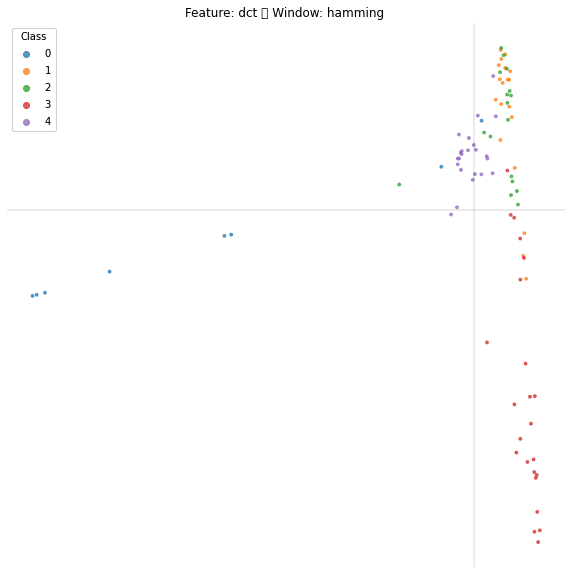

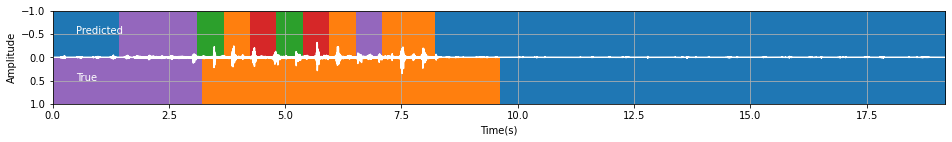

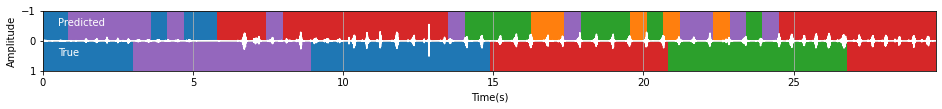

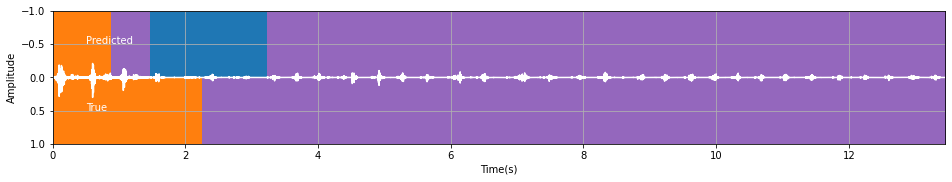

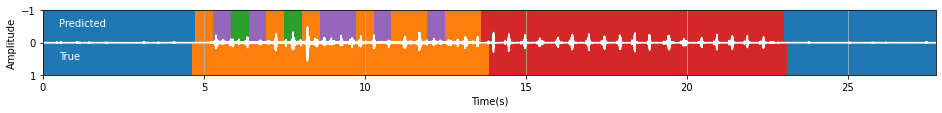

...

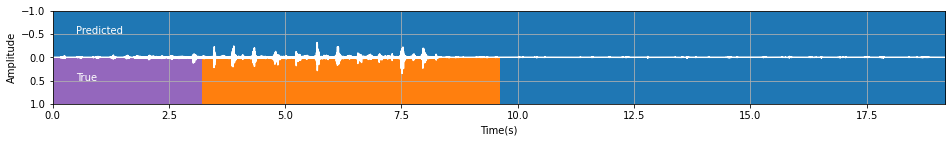

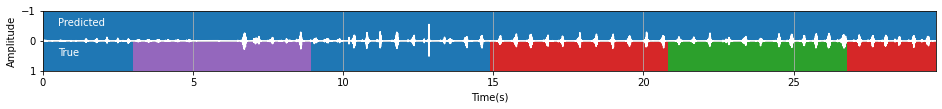

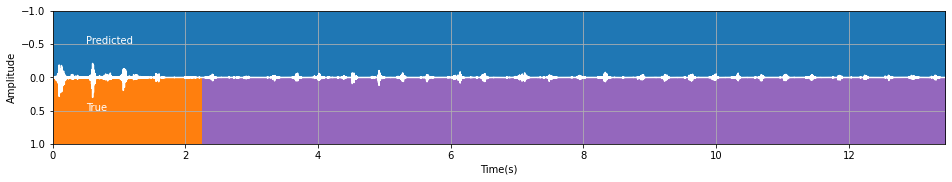

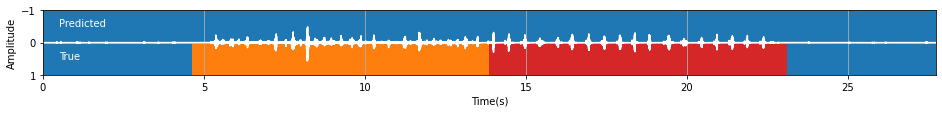

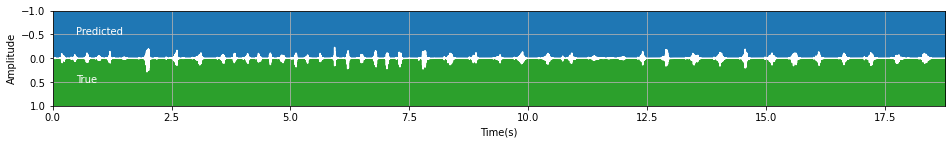

In [16]:
#creating a dictionary that stores features and windows values
lle_score_features = {}

#Features
features= ['dct', 'fft', 'fft_phase', 'dct_phase', 'cepstrum', 'raw']

#Windows
windows= ['hamming', 'hann', 'boxcar', 'blackmanharris']

for i in features:
    for j in windows:
        
        #Random window size
        window_size = np.random.randint(36, 6000)
        #Random step siz
        step_size = np.random.randint(36,window_size)
        
        #Creating different parameters with random window size for every combination of feature and window
        parameters = {
            'size': window_size,
            'step': step_size,
            'decimate': 1,
            'feature_range': (0.0, 1.0),
            'window_fn': j,
            'feature_fn': i
        }
        print(f"Feature: {i} - Window: {j}")
        
        #Loading the data into a set of features and labels
        X, y = audio_task.load_data(parameters)
        print("X shape: ", X.shape, "y shape: ", y.shape, "\n\n")
        
        #Plot the visualization
        plot_lle(i,j)
        
        #Classifying the feature vector space and creating a graph between true and predicted value
        score=lle_features(X, y, parameters)
        lle_score_features[f"Feature -> {i} : Window -> {j} : Window_size -> {window_size} : Step_size -> {step_size}"] = score

In [17]:
#Sorting the scores from lowest to highest 
lle_scores = {}

keys_lle_sorted = sorted(lle_score_features, key=lle_score_features.get)

for i in keys_lle_sorted:
    lle_scores[i] = lle_score_features[i]
    
for i in lle_scores.keys():
    print((i, lle_scores[i]))

('Feature -> raw : Window -> blackmanharris : Window_size -> 5842 : Step_size -> 4089', 13.73975361572699)
('Feature -> raw : Window -> boxcar : Window_size -> 5686 : Step_size -> 2072', 17.665340656394218)
('Feature -> raw : Window -> hann : Window_size -> 3745 : Step_size -> 3085', 18.756783865821628)
('Feature -> raw : Window -> hamming : Window_size -> 5465 : Step_size -> 996', 23.76484830807785)
('Feature -> fft_phase : Window -> boxcar : Window_size -> 5832 : Step_size -> 5741', 37.38489635978468)
('Feature -> fft_phase : Window -> blackmanharris : Window_size -> 4366 : Step_size -> 4072', 39.138382865101704)
('Feature -> dct_phase : Window -> boxcar : Window_size -> 4779 : Step_size -> 1423', 48.40765479435945)
('Feature -> fft_phase : Window -> hann : Window_size -> 3997 : Step_size -> 1672', 51.203659360094775)
('Feature -> fft_phase : Window -> hamming : Window_size -> 431 : Step_size -> 161', 60.66963225045092)
('Feature -> dct : Window -> hamming : Window_size -> 3930 : Ste

In [18]:
#The best score that we get by using Locally Linear Embedding is 73.68.
#Feature : dct
#Window : boxcar
#Window size : 2411
#Step size : 104

### ISOMAP

In [19]:
from sklearn.manifold import Isomap

def plot_iso(i,j):
    fig, ax = plt.subplots(figsize=(10, 10))
    
    # create a iso object
    iso = Isomap(n_components=2)
    
    # transform every fifth vector (to save computation time)
    # some techniques need this; others will be fast enough
    subsample = 5
    iso_X = iso.fit_transform(X[::subsample, :])
    
    # show a scatter plot of the first two dimensions
    scatter = ax.scatter(
        iso_X[:, 0],
        iso_X[:, 1],
        c=y[::subsample],
        cmap="tab10",
        vmin=0,
        vmax=10,
        alpha=0.7,
        s=8,
    )
    ##### Make the figure look a bit cleaner
    # Produce a legend for the ranking (colors). Even though there are 40 different
    # rankings, we only want to show 5 of them in the legend.
    legend1 = ax.legend(*scatter.legend_elements(num=4), loc="upper left", title="Class")
    ax.add_artist(legend1)
    ax.set_title(f"Feature: {i} \t Window: {j} ")
    ax.axhline(0, color="k", alpha=0.1)
    ax.axvline(0, color="k", alpha=0.1)
    ax.axis("off")

In [20]:
#fit a classifier
def features_iso(X, y, parameters):
    classifier = audio_task.knn_fit(X, y)
    
    #Prediction using visualization for the training data
    for i in range(5):
        audio_task.plot_test(classifier, parameters, f"data/challenge_test_{i}")
        
    score = test_accuracy_iso(classifier, parameters)
    return score

#Finding the accuracy of the test set
def test_accuracy_iso(classifier, parameters):
    score = audio_task.run_secret_test(classifier, parameters)
    return score

Feature: dct 	 Window: hamming
Loading into 122 windows of length 1818
Loading into 289 windows of length 1818
Loading into 248 windows of length 1818
Loading into 351 windows of length 1818
Loading into 341 windows of length 1818
Using dct transform and a hamming window.
X shape:  (1351, 1818) y shape:  (1351,) 


Testing with data/challenge_test_0
Loading into 106 windows of length 1818
Predicting...
Prediction accuracy 0.599
Confusion matrix
[[454   0  28   9   0]
 [ 65  37  84  19 123]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 47   0  19   0  98]]

Testing with data/challenge_test_1
Loading into 166 windows of length 1818
Predicting...
Prediction accuracy 0.255
Confusion matrix
[[ 70   9  37 240 102]
 [  0   0   0   0   0]
 [ 37  36  47 130  55]
 [ 27  63 140 180  46]
 [ 74   0   9 129  92]]

Testing with data/challenge_test_2
Loading into 74 windows of length 1818
Predicting...
Prediction accuracy 0.671
Confusion matrix
[[  0   0   0   0   0]
 [ 28  32   0   0  55]
 [  0   

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 84 windows of length 1818
Predicting...
Loading into 49 windows of length 1818
Predicting...
Loading into 243 windows of length 1818
Predicting...
Loading into 9 windows of length 1818
Predicting...
Loading into 97 windows of length 1818
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 68 windows of length 1818
Predicting...
Loading into 206 windows of length 1818
Predicting...
*** Total score: 70.48 ***
Feature: dct 	 Window: hann
Loading into 84 windows of length 3312
Loading into 202 windows of length 3312
Loading into 173 windows of length 3312
Loading into 246 windows of length 3312
Loading into 238 windows of length 3312
Using dct transform and a hann window.
X shape:  (943, 3312) y shape:  (943,) 


Testing with data/challenge_test_0
Loading into 74 windows of length 3312
Predicting...
Prediction accuracy 0.692
Confusion matrix
[[491   0   0   0   0]
 [ 81  68  85  14  80]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 34   0   9   0 121]]

Testing with data/challenge_test_1
Loading into 115 windows of length 3312
Predicting...
Prediction accuracy 0.202
Confusion matrix
[[ 47  20  13 245 133]
 [  0   0   0   0   0]
 [ 13  36  27 108 121]
 [  0 103 107 152  94]
 [ 79   0   0 143  82]]

Testing with data/challenge_test_2
Loading into 51 windows of

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 58 windows of length 3312
Predicting...
Loading into 33 windows of length 3312
Predicting...
Loading into 170 windows of length 3312
Predicting...
Loading into 5 windows of length 3312
Predicting...
Loading into 67 windows of length 3312
Predicting...
Loading into 46 windows of length 3312
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 144 windows of length 3312
Predicting...
*** Total score: 64.28 ***
Feature: dct 	 Window: boxcar
Loading into 1283 windows of length 77
Loading into 3009 windows of length 77
Loading into 2586 windows of length 77
Loading into 3658 windows of length 77
Loading into 3547 windows of length 77
Using dct transform and a boxcar window.
X shape:  (14083, 77) y shape:  (14083,) 


Testing with data/challenge_test_0
Loading into 1122 windows of length 77
Predicting...
Prediction accuracy 0.378
Confusion matrix
[[138   0 102 160  91]
 [ 28 165  34  44  57]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 10  26  15  44  69]]

Testing with data/challenge_test_1
Loading into 1739 windows of length 77
Predicting...
Prediction accuracy 0.268
Confusion matrix
[[ 46  32  76 209  95]
 [  0   0   0   0   0]
 [ 18  53  67 122  45]
 [  8  76 113 194  65]
 [ 38  15  45 105 101]]

Testing with data/challenge_test_2
Loading into 787 windows of length 77
Predicting...
Prediction accuracy 0.499


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 894 windows of length 77
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 532 windows of length 77
Predicting...
Loading into 2539 windows of length 77
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 116 windows of length 77
Predicting...
Loading into 1027 windows of length 77
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 723 windows of length 77
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 2154 windows of length 77
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 73.33 ***
Feature: dct 	 Window: blackmanharris
Loading into 76 windows of length 4633
Loading into 183 windows of length 4633
Loading into 157 windows of length 4633
Loading into 224 windows of length 4633
Loading into 217 windows of length 4633
Using dct transform and a blackmanharris window.
X shape:  (857, 4633) y shape:  (857,) 


Testing with data/challenge_test_0
Loading into 66 windows of length 4633
Predicting...
Prediction accuracy 0.684
Confusion matrix
[[491   0   0   0]
 [ 61  60  85 122]
 [  0   0   0   0]
 [ 38   0   5 121]]

Testing with data/challenge_test_1
Loading into 105 windows of length 4633
Predicting...
Prediction accuracy 0.183
Confusion matrix
[[ 37   0  44 239 138]
 [  0   0   0   0   0]
 [ 15  39  15 119 117]
 [ 15 136  29 152 124]
 [ 73   0   0 156  75]]

Testing with data/challenge_test_2
Loading into 45 windows of length 4633
Predicting...
Prediction accuracy 0.766
Confusion matrix
[[  0   0   0   0]
 [ 16   0  24  75]
 [  0   0   0   0]

C:\Users\vsneg\Downloads\Audio Classification\audio_task.py:162: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16, 4))


[[466   0   0   8   0]
 [  7 132 118  37 179]
 [  0   0   0   0   0]
 [  0   0   0 458  15]
 [  0   0   0   0   0]]

Testing with data/challenge_test_4
Loading into 65 windows of length 4633
Predicting...
Prediction accuracy 0.173
Confusion matrix
[[  0   0   0   0]
 [  0   0   0   0]
 [ 15 135 166 645]
 [  0   0   0   0]]

Loading into 173 windows of length 4633
Predicting...
Loading into 52 windows of length 4633
Predicting...
Loading into 29 windows of length 4633
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 154 windows of length 4633
Predicting...
Loading into 4 windows of length 4633
Predicting...
Loading into 60 windows of length 4633
Predicting...
Loading into 41 windows of length 4633
Predicting...
Loading into 130 windows of length 4633
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

*** Total score: 62.63 ***
Feature: fft 	 Window: hamming
Loading into 18 windows of length 5693
Loading into 42 windows of length 5693
Loading into 36 windows of length 5693
Loading into 51 windows of length 5693
Loading into 50 windows of length 5693
Using fft transform and a hamming window.
X shape:  (197, 5693) y shape:  (197,) 


Testing with data/challenge_test_0
Loading into 15 windows of length 5693
Predicting...
Prediction accuracy 0.772
Confusion matrix
[[491   0   0   0]
 [ 35 140  70  83]
 [  0   0   0   0]
 [ 36   0   0 128]]

Testing with data/challenge_test_1
Loading into 24 windows of length 5693
Predicting...
Prediction accuracy 0.174
Confusion matrix
[[ 34  66   0 239 119]
 [  0   0   0   0   0]
 [  0  93   0  80 132]
 [  0 172 132 152   0]
 [ 66   0   0 159  79]]

Testing with data/challenge_test_2
Loading into 11 windows of length 5693
Predicting...
Prediction accuracy 0.800
Confusion matrix
[[  0   0   0]
 [ 11  35  69]
 [ 58   0 516]]

Testing with data/challenge_

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

*** Total score: 65.44 ***
Feature: fft 	 Window: hann
Loading into 802 windows of length 132
Loading into 1880 windows of length 132
Loading into 1616 windows of length 132
Loading into 2286 windows of length 132
Loading into 2217 windows of length 132
Using fft transform and a hann window.
X shape:  (8801, 132) y shape:  (8801,) 


Testing with data/challenge_test_0
Loading into 701 windows of length 132
Predicting...
Prediction accuracy 0.387
Confusion matrix
[[169   0  89 127 106]
 [ 34 156  47  45  46]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 17  31  29  32  55]]

Testing with data/challenge_test_1
Loading into 1087 windows of length 132
Predicting...
Prediction accuracy 0.258
Confusion matrix
[[ 53  28  88 202  87]
 [  0   0   0   0   0]
 [ 15  46  70 125  49]
 [ 18  61 123 187  67]
 [ 52  14  48 107  83]]

Testing with data/challenge_test_2
Loading into 491 windows of length 132
Predicting...
Prediction accuracy 0.517
Confusion matrix
[[  0   0   0   0   0]
 [  6  45  12

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 559 windows of length 132
Predicting...
Loading into 332 windows of length 132
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1587 windows of length 132
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 72 windows of length 132
Predicting...
Loading into 641 windows of length 132
Predicting...
Loading into 452 windows of length 132
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1346 windows of length 132
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 74.23 ***
Feature: fft 	 Window: boxcar
Loading into 15 windows of length 5961
Loading into 37 windows of length 5961
Loading into 32 windows of length 5961
Loading into 45 windows of length 5961
Loading into 44 windows of length 5961
Using fft transform and a boxcar window.
X shape:  (173, 5961) y shape:  (173,) 


Testing with data/challenge_test_0
Loading into 13 windows of length 5961
Predicting...
Prediction accuracy 0.875
Confusion matrix
[[491   0   0]
 [ 41 287   0]
 [ 41  41  82]]

Testing with data/challenge_test_1
Loading into 21 windows of length 5961
Predicting...
Prediction accuracy 0.251
Confusion matrix
[[ 39  38   0 267 114]
 [  0   0   0   0   0]
 [  0  38 153 114   0]
 [  0 228  76 152   0]
 [ 76   0   0 190  38]]

Testing with data/challenge_test_2
Loading into 9 windows of length 5961
Predicting...
Prediction accuracy 0.897
Confusion matrix
[[ 44  71]
 [  0 574]]

Testing with data/challenge_test_3
Loading into 20 windows of length 5961
Predicting.

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 12 windows of length 5961
Predicting...
Loading into 8 windows of length 5961
Predicting...
Loading into 26 windows of length 5961
Predicting...
*** Total score: 68.22 ***
Feature: fft 	 Window: blackmanharris
Loading into 47 windows of length 5348
Loading into 113 windows of length 5348
Loading into 97 windows of length 5348
Loading into 138 windows of length 5348
Loading into 134 windows of length 5348
Using fft transform and a blackmanharris window.
X shape:  (529, 5348) y shape:  (529,) 


Testing with data/challenge_test_0
Loading into 41 windows of length 5348
Predicting...
Prediction accuracy 0.699
Confusion matrix
[[491   0   0   0]
 [ 62  73 144  49]
 [  0   0   0   0]
 [ 13   0  28 123]]

Testing with data/challenge_test_1
Loading into 64 windows of length 5348
Predicting...
Prediction accuracy 0.207
Confusion matrix
[[ 37  24  49 232 116]
 [  0   0   0   0   0]
 [  0  82  49 102  72]
 [  0 112 120 152  72]
 [ 73   0   0 154  77]]

Testing with data/challenge_tes

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 2 windows of length 5348
Predicting...
Loading into 37 windows of length 5348
Predicting...
Loading into 25 windows of length 5348
Predicting...
Loading into 80 windows of length 5348
Predicting...
*** Total score: 66.46 ***
Feature: fft_phase 	 Window: hamming
Loading into 757 windows of length 1378
Loading into 1789 windows of length 1378


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 1536 windows of length 1378
Loading into 2178 windows of length 1378
Loading into 2111 windows of length 1378
Using fft_phase transform and a hamming window.
X shape:  (8371, 1378) y shape:  (8371,) 


Testing with data/challenge_test_0
Loading into 661 windows of length 1378
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0  26 465   0]
 [  0   0  27 301   0]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0   0   5 159   0]]

Testing with data/challenge_test_1
Loading into 1030 windows of length 1378
Predicting...
Prediction accuracy 0.293
Confusion matrix
[[  0  34 424   0]
 [  0  30 275   0]
 [  0  39 416   1]
 [  0  24 280   0]]

Testing with data/challenge_test_2
Loading into 460 windows of length 1378
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   8 107   0]
 [  0   0   0   0]
 [  0   0   0   0]
 [  0  34 540   0]]

Testing with data/challenge_test_3
Loading into 959 windows of length 1378
Predicting...
Prediction accuracy 0.298


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 524 windows of length 1378
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 307 windows of length 1378
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 1508 windows of length 1378
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 58 windows of length 1378
Predicting...
Loading into 603 windows of length 1378
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 422 windows of length 1378
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 1278 windows of length 1378
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

*** Total score: 56.00 ***
Feature: fft_phase 	 Window: hann
Loading into 253 windows of length 1722
Loading into 599 windows of length 1722
Loading into 514 windows of length 1722
Loading into 729 windows of length 1722
Loading into 707 windows of length 1722
Using fft_phase transform and a hann window.
X shape:  (2802, 1722) y shape:  (2802,) 


Testing with data/challenge_test_0
Loading into 221 windows of length 1722
Predicting...
Prediction accuracy 0.183
Confusion matrix
[[ 34 154  62 145  96]
 [ 23 110  57  78  60]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 33  23  38  34  36]]

Testing with data/challenge_test_1
Loading into 345 windows of length 1722
Predicting...
Prediction accuracy 0.196
Confusion matrix
[[ 27 118  84 126 103]
 [  0   0   0   0   0]
 [ 17  94  76  80  38]
 [ 27 131  84  96 118]
 [ 35  63  14  93  99]]

Testing with data/challenge_test_2
Loading into 153 windows of length 1722
Predicting...
Prediction accuracy 0.228
Confusion matrix
[[  0   0   0   0   

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 175 windows of length 1722
Predicting...
Loading into 102 windows of length 1722
Predicting...
Loading into 505 windows of length 1722
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 19 windows of length 1722
Predicting...
Loading into 202 windows of length 1722
Predicting...
Loading into 141 windows of length 1722
Predicting...
Loading into 428 windows of length 1722


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Predicting...
*** Total score: 57.37 ***
Feature: fft_phase 	 Window: boxcar
Loading into 156 windows of length 1288
Loading into 368 windows of length 1288
Loading into 316 windows of length 1288


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 448 windows of length 1288
Loading into 434 windows of length 1288
Using fft_phase transform and a boxcar window.
X shape:  (1722, 1288) y shape:  (1722,) 


Testing with data/challenge_test_0
Loading into 136 windows of length 1288
Predicting...
Prediction accuracy 0.074
Confusion matrix
[[  0  81  86 324   0]
 [  0  73  44 211   0]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0  22   0 142   0]]

Testing with data/challenge_test_1
Loading into 212 windows of length 1288
Predicting...
Prediction accuracy 0.203
Confusion matrix
[[  0 107 100 251   0]
 [  0   0   0   0   0]
 [  0  70  67 168   0]
 [  0  84 122 242   8]
 [  0  51  45 208   0]]

Testing with data/challenge_test_2
Loading into 95 windows of length 1288
Predicting...
Prediction accuracy 0.022
Confusion matrix
[[  7  15  93   0]
 [  0   0   0   0]
 [  0   0   0   0]
 [110  95 361   8]]

Testing with data/challenge_test_3
Loading into 197 windows of length 1288
Predicting...
Prediction accuracy 0.268
Confusi

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 310 windows of length 1288
Predicting...
Loading into 13 windows of length 1288
Predicting...
Loading into 124 windows of length 1288
Predicting...
Loading into 87 windows of length 1288
Predicting...
Loading into 263 windows of length 1288
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

*** Total score: 54.19 ***
Feature: fft_phase 	 Window: blackmanharris
Loading into 23 windows of length 4065
Loading into 56 windows of length 4065
Loading into 48 windows of length 4065
Loading into 68 windows of length 4065
Loading into 66 windows of length 4065
Using fft_phase transform and a blackmanharris window.
X shape:  (261, 4065) y shape:  (261,) 


Testing with data/challenge_test_0
Loading into 20 windows of length 4065
Predicting...
Prediction accuracy 0.185
Confusion matrix
[[ 52 181  51 155  52]
 [ 52  52 173  51   0]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0   0  34  52  78]]

Testing with data/challenge_test_1
Loading into 32 windows of length 4065
Predicting...
Prediction accuracy 0.162
Confusion matrix
[[ 49 123  99 138  49]
 [  0   0   0   0   0]
 [  0  49  50  98 108]
 [ 49 172  49  98  88]
 [ 49   0  99 107  49]]

Testing with data/challenge_test_2
Loading into 14 windows of length 4065
Predicting...
Prediction accuracy 0.231
Confusion matrix
[[  0   0 

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 2 windows of length 4065
Predicting...
Loading into 19 windows of length 4065
Predicting...
Loading into 13 windows of length 4065
Predicting...
Loading into 40 windows of length 4065
Predicting...
*** Total score: 45.02 ***
Feature: dct_phase 	 Window: hamming
Loading into 35 windows of length 4440
Loading into 85 windows of length 4440
Loading into 73 windows of length 4440
Loading into 103 windows of length 4440
Loading into 100 windows of length 4440
Using dct_phase transform and a hamming window.
X shape:  (396, 4440) y shape:  (396,) 


Testing with data/challenge_test_0
Loading into 31 windows of length 4440
Predicting...
Prediction accuracy 0.100
Confusion matrix
[[  0 114  98 164 115]
 [ 33  82  33 131  49]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0  50  33  65  16]]

Testing with data/challenge_test_1
Loading into 48 windows of length 4440
Predicting...
Prediction accuracy 0.199
Confusion matrix
[[ 33 136  78  64 147]
 [  0   0   0   0   0]
 [  0  64  53

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 14 windows of length 4440
Predicting...
Loading into 71 windows of length 4440
Predicting...
Loading into 2 windows of length 4440
Predicting...
Loading into 28 windows of length 4440
Predicting...
Loading into 19 windows of length 4440
Predicting...
Loading into 60 windows of length 4440
Predicting...
*** Total score: 43.38 ***
Feature: dct_phase 	 Window: hann
Loading into 117 windows of length 1003
Loading into 275 windows of length 1003
Loading into 236 windows of length 1003
Loading into 335 windows of length 1003
Loading into 325 windows of length 1003
Using dct_phase transform and a hann window.
X shape:  (1288, 1003) y shape:  (1288,) 


Testing with data/challenge_test_0
Loading into 102 windows of length 1003
Predicting...
Prediction accuracy 0.192
Confusion matrix
[[ 30 180  47 158  76]
 [ 10 117  49  68  84]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0  20  29  73  42]]

Testing with data/challenge_test_1
Loading into 159 windows of length 1003
Predictin

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

*** Total score: 53.24 ***
Feature: dct_phase 	 Window: boxcar
Loading into 439 windows of length 2618
Loading into 1046 windows of length 2618
Loading into 897 windows of length 2618
Loading into 1274 windows of length 2618
Loading into 1235 windows of length 2618
Using dct_phase transform and a boxcar window.
X shape:  (4891, 2618) y shape:  (4891,) 


Testing with data/challenge_test_0
Loading into 382 windows of length 2618
Predicting...
Prediction accuracy 0.101
Confusion matrix
[[ 27  95  78 173 118]
 [ 12  52  64 162  38]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0  15  49  80  20]]

Testing with data/challenge_test_1
Loading into 599 windows of length 2618
Predicting...
Prediction accuracy 0.195
Confusion matrix
[[  3  41 108 235  71]
 [  0   0   0   0   0]
 [  4  42  45 197  17]
 [  5 100  95 199  57]
 [ 16  40  80 118  50]]

Testing with data/challenge_test_2
Loading into 264 windows of length 2618
Predicting...
Prediction accuracy 0.176
Confusion matrix
[[  0   0   0

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 302 windows of length 2618
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 175 windows of length 2618
Predicting...
Loading into 881 windows of length 2618
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 28 windows of length 2618
Predicting...
Loading into 349 windows of length 2618
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 242 windows of length 2618
Predicting...
Loading into 745 windows of length 2618
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 59.35 ***
Feature: dct_phase 	 Window: blackmanharris
Loading into 44 windows of length 4805
Loading into 105 windows of length 4805
Loading into 90 windows of length 4805
Loading into 128 windows of length 4805
Loading into 124 windows of length 4805
Using dct_phase transform and a blackmanharris window.
X shape:  (491, 4805) y shape:  (491,) 


Testing with data/challenge_test_0
Loading into 38 windows of length 4805
Predicting...
Prediction accuracy 0.118
Confusion matrix
[[ 26 212  80  26 147]
 [  0  63  79 107  79]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0  43  27  67  27]]

Testing with data/challenge_test_1
Loading into 60 windows of length 4805
Predicting...
Prediction accuracy 0.152
Confusion matrix
[[  0 104  76  99 179]
 [  0   0   0   0   0]
 [  5 104  51 119  26]
 [ 20 155 167  62  52]
 [ 26  52  25  83 118]]

Testing with data/challenge_test_2
Loading into 26 windows of length 4805
Predicting...
Prediction accuracy 0.174
Confusion matrix
[[  0  

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 75 windows of length 4805
Predicting...
*** Total score: 47.82 ***
Feature: cepstrum 	 Window: hamming
Loading into 85 windows of length 1421
Loading into 200 windows of length 1421
Loading into 172 windows of length 1421
Loading into 243 windows of length 1421
Loading into 236 windows of length 1421
Using cepstrum transform and a hamming window.
X shape:  (936, 1421) y shape: 

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 (936,) 


Testing with data/challenge_test_0
Loading into 74 windows of length 1421
Predicting...
Prediction accuracy 0.640
Confusion matrix
[[343   0  40  81  27]
 [ 27 176  67  14  44]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 27  13  14   0 110]]

Testing with data/challenge_test_1
Loading into 115 windows of length 1421
Predicting...
Prediction accuracy 0.141
Confusion matrix
[[ 54  39  14 192 159]
 [  0   0   0   0   0]
 [ 40  91  27 107  40]
 [ 67 156 107  53  73]
 [ 53  13  41 116  81]]

Testing with data/challenge_test_2
Loading into 52 windows of length 1421
Predicting...
Prediction accuracy 0.463
Confusion matrix
[[  0   0   0   0   0]
 [  0  47   0  13  55]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 93  81  47  81 272]]

Testing with data/challenge_test_3
Loading into 107 windows of length 1421
Predicting...
Prediction accuracy 0.489
Confusion matrix
[[269   0  41 135  29]
 [ 31 280  42  14 106]
 [  0   0   0   0   0]
 [ 34 133  70 145  91]
 [  0   0   0   0   

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 7 windows of length 1421
Predicting...
Loading into 68 windows of length 1421
Predicting...
Loading into 47 windows of length 1421
Predicting...
Loading into 143 windows of length 1421
Predicting...
*** Total score: 63.60 ***
Feature: cepstrum 	 Window: hann
Loading into 31 windows of length 2997
Loading into 74 windows of length 2997
Loading into 64 windows of length 2997
Loading into 90 windows of length 2997
Loading into 88 windows of length 2997
Using cepstrum transform and a hann window.
X shape:  (347, 2997) y shape:  (347,) 


Testing with data/challenge_test_0
Loading into 27 windows of length 2997
Predicting...
Prediction accuracy 0.814
Confusion matrix
[[491   0   0   0   0]
 [ 57 233  38   0   0]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0  31   0  57  76]]

Testing with data/challenge_test_1
Loading into 43 windows of length 2997
Predicting...
Prediction accuracy 0.179
Confusion matrix
[[ 55  54  73 142 134]
 [  0   0   0   0   0]
 [  0 113  73  47  72]

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 62 windows of length 2997
Predicting...
Loading into 2 windows of length 2997
Predicting...
Loading into 25 windows of length 2997
Predicting...
Loading into 17 windows of length 2997
Predicting...
Loading into 53 windows of length 2997
Predicting...
*** Total score: 66.77 ***
Feature: cepstrum 	 Window: boxcar
Loading into 311 windows of length 5993
Loading into 759 windows of length 5993
Loading into 649 windows of length 5993
Loading into 927 windows of length 5993
Loading into 898 windows of length 5993
Using cepstrum transform and a boxcar window.
X shape:  (3544, 5993) y shape:  (3544,) 


Testing with data/challenge_test_0
Loading into 269 windows of length 5993
Predicting...
Prediction accuracy 0.811
Confusion matrix
[[491   0   0   0]
 [ 42 172  95  19]
 [  0   0   0   0]
 [  0  30   0 134]]

Testing with data/challenge_test_1
Loading into 429 windows of length 5993
Predicting...
Prediction accuracy 0.191
Confusion matrix
[[  0  48  18 232 160]
 [  0   0   0   0  

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 210 windows of length 5993
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 116 windows of length 5993
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 637 windows of length 5993
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 9 windows of length 5993
Predicting...
Loading into 245 windows of length 5993
Predicting...
Loading into 166 windows of length 5993


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Predicting...
Loading into 537 windows of length 5993


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 76.81 ***
Feature: cepstrum 	 Window: blackmanharris
Loading into 813 windows of length 483
Loading into 1911 windows of length 483
Loading into 1642 windows of length 483
Loading into 2324 windows of length 483
Loading into 2254 windows of length 483
Using cepstrum transform and a blackmanharris window.
X shape:  (8944, 483) y shape:  (8944,) 


Testing with data/challenge_test_0
Loading into 711 windows of length 483
Predicting...
Prediction accuracy 0.495
Confusion matrix
[[213   4  60  72 142]
 [ 29 221  40  14  24]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 23  72  11   5  53]]

Testing with data/challenge_test_1
Loading into 1103 windows of length 483
Predicting...
Prediction accuracy 0.238
Confusion matrix
[[ 62  42  74 186  94]
 [  0   0   0   0   0]
 [ 36  70  67  98  34]
 [ 28  80 118 143  87]
 [ 60  28  33  93  90]]

Testing with data/challenge_test_2
Loading into 497 windows of length 483
Predicting...
Prediction accuracy 0.488
Confusion matrix
[[  0 

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 566 windows of length 483
Predicting...
Loading into 335 windows of length 483
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1613 windows of length 483
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 70 windows of length 483
Predicting...
Loading into 650 windows of length 483
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 457 windows of length 483
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1367 windows of length 483
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 73.67 ***
Feature: raw 	 Window: hamming
Loading into 70 windows of length 1314
Loading into 165 windows of length 1314
Loading into 141 windows of length 1314
Loading into 200 windows of length 1314
Loading into 194 windows of length 1314
Using raw transform and a hamming window.
X shape:  (770, 1314) y shape:  (770,) 


Testing with data/challenge_test_0
Loading into 61 windows of length 1314
Predicting...
Prediction accuracy 0.107
Confusion matrix
[[ 89   0 147 255   0]
 [155   0  50  57  66]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 57   0  26  65  16]]

Testing with data/challenge_test_1
Loading into 95 windows of length 1314
Predicting...
Prediction accuracy 0.252
Confusion matrix
[[ 80  96 201  81]
 [ 64  32 148  61]
 [ 24  74 240 118]
 [ 99  65 108  32]]

Testing with data/challenge_test_2
Loading into 43 windows of length 1314
Predicting...
Prediction accuracy 0.012
Confusion matrix
[[  0   0   0   0   0]
 [ 25   0   0  90   0]
 [  0   0   0   0   0]
 [

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Testing with data/challenge_test_0
Loading into 70 windows of length 1387
Predicting...
Prediction accuracy 0.086
Confusion matrix
[[ 85   0  42 364   0]
 [129   0   0 143  56]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [114  14   0  36   0]]

Testing with data/challenge_test_1
Loading into 108 windows of length 1387
Predicting...
Prediction accuracy 0.238
Confusion matrix
[[ 74   0  64 249  71]
 [  0   0   0   0   0]
 [ 58  14  42 126  65]
 [ 44  14  70 232  96]
 [110  14  28 137  15]]

Testing with data/challenge_test_2
Loading into 49 windows of length 1387
Predicting...
Prediction accuracy 0.041
Confusion matrix
[[  0   0   0   0   0]
 [ 42   0  29  36   8]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [221   0  57 268  28]]

Testing with data/challenge_test_3
Loading into 101 windows of length 1387
Predicting...
Prediction accuracy 0.143
Confusion matrix
[[ 61   0  42 371   0]
 [146   0  29 199  99]
 [  0   0   0   0   0]
 [ 61  14  71 142 185]
 [  0   0   0   0   0]]

Testin

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 55 windows of length 1387
Predicting...
Loading into 33 windows of length 1387
Predicting...
Loading into 158 windows of length 1387
Predicting...
Loading into 7 windows of length 1387
Predicting...
Loading into 64 windows of length 1387
Predicting...
Loading into 45 windows of length 1387
Predicting...
Loading into 134 windows of length 1387
Predicting...
*** Total score: 40.22 ***
Feature: raw 	 Window: boxcar
Loading into 187 windows of length 2272
Loading into 445 windows of length 2272
Loading into 382 windows of length 2272
Loading into 542 windows of length 2272
Loading into 525 windows of length 2272
Using raw transform and a boxcar window.
X shape:  (2081, 2272) y shape:  (2081,) 


Testing with data/challenge_test_0
Loading into 163 windows of length 2272
Predicting...
Prediction accuracy 0.499
Confusion matrix
[[491   0   0   0]
 [260   0  31  37]
 [  0   0   0   0]
 [164   0   0   0]]

Testing with data/challenge_test_1
Loading into 255 windows of length 2272
P

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 13 windows of length 2272
Predicting...
Loading into 149 windows of length 2272
Predicting...
Loading into 104 windows of length 2272
Predicting...
Loading into 317 windows of length 2272
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

*** Total score: 36.51 ***
Feature: raw 	 Window: blackmanharris
Loading into 55 windows of length 4891
Loading into 132 windows of length 4891
Loading into 113 windows of length 4891
Loading into 161 windows of length 4891
Loading into 156 windows of length 4891
Using raw transform and a blackmanharris window.
X shape:  (617, 4891) y shape:  (617,) 


Testing with data/challenge_test_0
Loading into 48 windows of length 4891
Predicting...
Prediction accuracy 0.499
Confusion matrix
[[491   0   0]
 [328   0   0]
 [164   0   0]]

Testing with data/challenge_test_1
Loading into 75 windows of length 4891
Predicting...
Prediction accuracy 0.274
Confusion matrix
[[397  20   0  41]
 [303   0   0   2]
 [397   0   0  59]
 [283   0   0  21]]

Testing with data/challenge_test_2
Loading into 33 windows of length 4891
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0   0]
 [115   0   0]
 [574   0   0]]

Testing with data/challenge_test_3
Loading into 70 windows of length 4891
Predic

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 94 windows of length 4891
Predicting...
*** Total score: 24.30 ***


C:\Users\vsneg\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:203: RuntimeWarning: Glyph 9 missing from current font.
  font.set_text(s, 0, flags=flags)


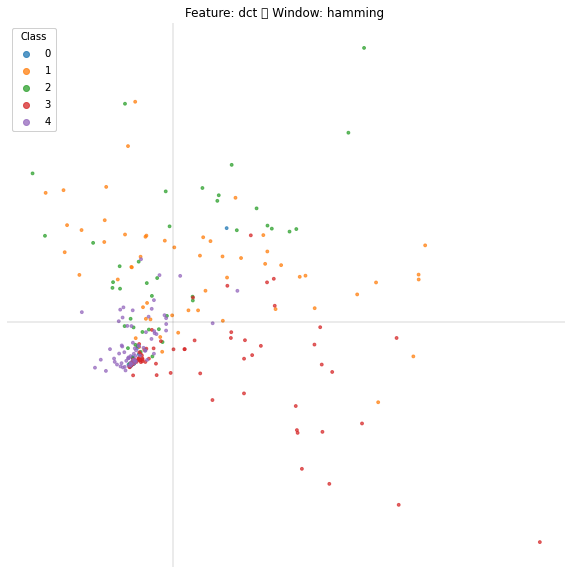

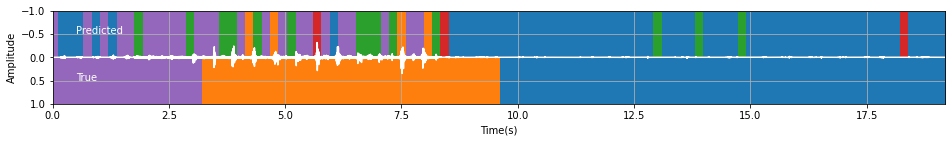

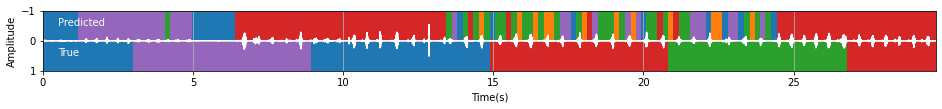

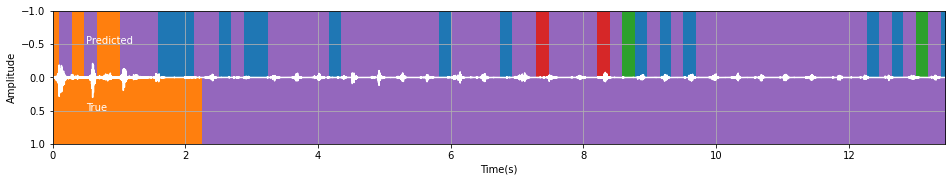

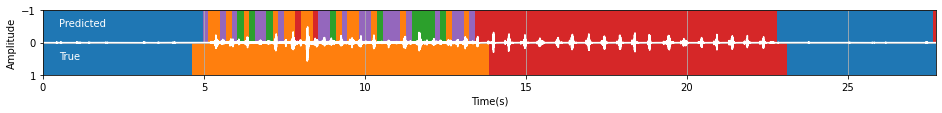

...

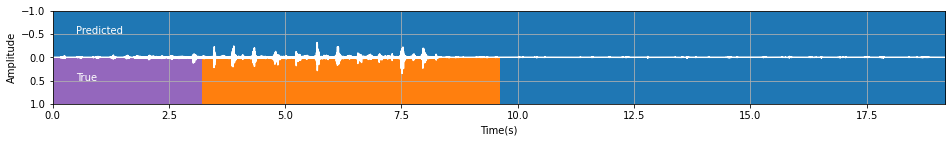

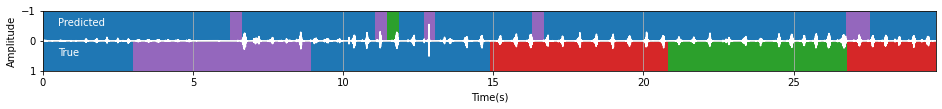

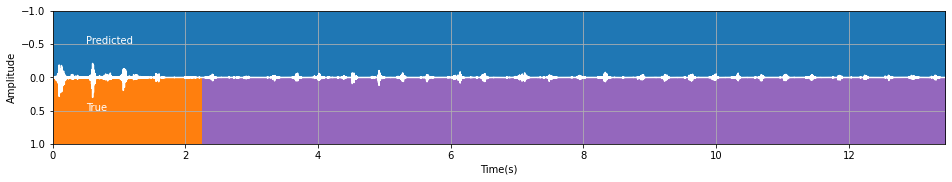

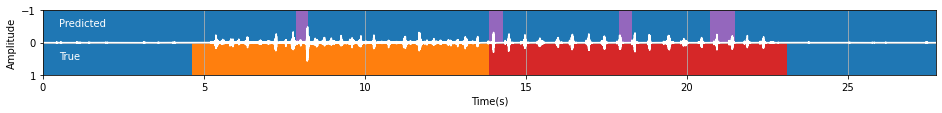

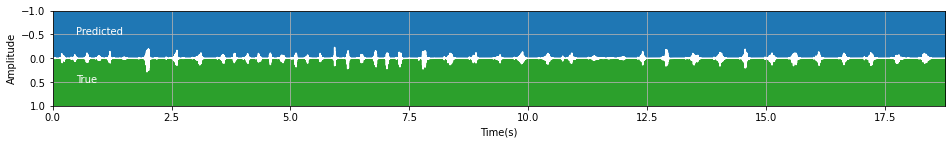

In [21]:
#creating a dictionary that stores features and windows values
iso_score_features = {}

#Features
features= ['dct', 'fft', 'fft_phase', 'dct_phase', 'cepstrum', 'raw']
#Windows
windows= ['hamming', 'hann', 'boxcar', 'blackmanharris']

for i in features:
    for j in windows:
        
        #Random window size
        window_size = np.random.randint(36, 6000)
        #Random step size
        step_size = np.random.randint(36,window_size)
        
        #Creating different parameters with random window size for every combination of feature and window
        parameters = {
            'size': window_size,
            'step': step_size,
            'decimate': 1,
            'feature_range': (0.0, 1.0),
            'window_fn': j,
            'feature_fn': i
        }
        print(f"Feature: {i} \t Window: {j}")
        
        #Loading the data into a set of features and labels
        X, y = audio_task.load_data(parameters)
        print("X shape: ", X.shape, "y shape: ", y.shape, "\n\n")
        
        #PLotting the visualization
        plot_iso(i,j)
        
        #Classifying the feature vector space and creating a graph between true and predicted value
        score=features_iso(X, y, parameters)
        iso_score_features[f"Feature -> {i} : Window -> {j} : Window_size -> {window_size} : Step_size -> {step_size}"] = score

In [22]:
#Sorting the scores from lowest to highest 
iso_scores = {}

keys_iso_sorted = sorted(iso_score_features, key=iso_score_features.get)

for i in keys_iso_sorted:
    iso_scores[i] = iso_score_features[i]
    
for i in iso_scores.keys():
    print((i, iso_scores[i]))

('Feature -> raw : Window -> blackmanharris : Window_size -> 4891 : Step_size -> 1566', 24.29523601681232)
('Feature -> raw : Window -> boxcar : Window_size -> 2272 : Step_size -> 469', 36.511769427163415)
('Feature -> raw : Window -> hann : Window_size -> 1387 : Step_size -> 1117', 40.22379645565518)
('Feature -> raw : Window -> hamming : Window_size -> 1314 : Step_size -> 1275', 41.941913407914136)
('Feature -> dct_phase : Window -> hamming : Window_size -> 4440 : Step_size -> 2448', 43.3817368354774)
('Feature -> fft_phase : Window -> blackmanharris : Window_size -> 4065 : Step_size -> 3740', 45.01835308579909)
('Feature -> dct_phase : Window -> blackmanharris : Window_size -> 4805 : Step_size -> 1973', 47.82293816659846)
('Feature -> dct_phase : Window -> hann : Window_size -> 1003 : Step_size -> 763', 53.244396191933866)
('Feature -> fft_phase : Window -> boxcar : Window_size -> 1288 : Step_size -> 570', 54.19004870037082)
('Feature -> fft_phase : Window -> hamming : Window_size -

In [23]:
#The best score that we get by using Isomap is 76.80.
#Feature : cepstrum
#Window : boxcar
#Window size : 5993
#Step size : 270

### TSNE

In [24]:
from sklearn.manifold import TSNE

def plot_tsne(i,j):
    # example showing PCA of features
    fig, ax = plt.subplots(figsize=(10, 10))
    
    # create a tsne object
    tsne = TSNE(n_components=2)

    
    # transform every fifth vector (to save computation time)
    # some techniques need this; others will be fast enough
    subsample = 5
    tsne_X = tsne.fit_transform(X[::subsample, :])
    
    # show a scatter plot of the first two dimensions
    scatter = ax.scatter(
        tsne_X[:, 0],
        tsne_X[:, 1],
        c=y[::subsample],
        cmap="tab10",
        vmin=0,
        vmax=10,
        alpha=0.7,
        s=8,
    )
    ##### Make the figure look a bit cleaner
    # Produce a legend for the ranking (colors). Even though there are 40 different
    # rankings, we only want to show 5 of them in the legend.
    legend1 = ax.legend(*scatter.legend_elements(num=4), loc="upper left", title="Class")
    ax.add_artist(legend1)
    ax.set_title(f"Feature: {i} \t Window: {j} ")
    ax.axhline(0, color="k", alpha=0.1)
    ax.axvline(0, color="k", alpha=0.1)
    ax.axis("off")

In [25]:
#fit a classifier
def features_tsne(X, y, parameters):
    classifier = audio_task.knn_fit(X, y)
 
    #Prediction using visualization for the training data
    for i in range(5):
        audio_task.plot_test(classifier, parameters, f"data/challenge_test_{i}")
        
    score=test_accuracy_tsne(classifier, parameters)
    return score

#Finding the accuracy of the test set
def test_accuracy_tsne(classifier, parameters):
    score = audio_task.run_secret_test(classifier, parameters)
    return score

Feature: dct - Window: hamming
Loading into 124 windows of length 1393
Loading into 294 windows of length 1393
Loading into 252 windows of length 1393
Loading into 357 windows of length 1393
Loading into 346 windows of length 1393
Using dct transform and a hamming window.
X shape:  (1373, 1393) y shape:  (1373,) 


Testing with data/challenge_test_0
Loading into 109 windows of length 1393
Predicting...
Prediction accuracy 0.563
Confusion matrix
[[326   0  27 128  10]
 [ 41  99  54  55  79]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 18   0   0  18 128]]

Testing with data/challenge_test_1
Loading into 169 windows of length 1393
Predicting...
Prediction accuracy 0.238
Confusion matrix
[[ 23   0  86 246 103]
 [  0   0   0   0   0]
 [ 36  35  46 133  55]
 [ 45 111  67 215  18]
 [ 45   0  19 162  78]]

Testing with data/challenge_test_2
Loading into 76 windows of length 1393
Predicting...
Prediction accuracy 0.678
Confusion matrix
[[  0   0   0   0   0]
 [  9  33   0  18  55]
 [  0   

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 10 windows of length 1393
Predicting...
Loading into 99 windows of length 1393
Predicting...
Loading into 70 windows of length 1393
Predicting...
Loading into 210 windows of length 1393
Predicting...
*** Total score: 67.46 ***
Feature: dct - Window: hann
Loading into 49 windows of length 5356
Loading into 118 windows of length 5356
Loading into 101 windows of length 5356
Loading into 144 windows of length 5356
Loading into 139 windows of length 5356


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Using dct transform and a hann window.
X shape:  (551, 5356) y shape:  (551,) 


Testing with data/challenge_test_0
Loading into 42 windows of length 5356
Predicting...
Prediction accuracy 0.695
Confusion matrix
[[491   0   0   0   0]
 [ 48  72  64  24 120]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 36   0   8   0 120]]

Testing with data/challenge_test_1
Loading into 67 windows of length 5356
Predicting...
Prediction accuracy 0.227
Confusion matrix
[[ 35  35  23 224 141]
 [  0   0   0   0   0]
 [  0  30  69  90 116]
 [  0 166  92 152  46]
 [ 69   0   0 145  90]]

Testing with data/challenge_test_2
Loading into 29 windows of length 5356
Predicting...
Prediction accuracy 0.804
Confusion matrix
[[  0   0   0]
 [ 29  37  49]
 [ 57   0 517]]

Testing with data/challenge_test_3
Loading into 62 windows of length 5356
Predicting...
Prediction accuracy 0.721
Confusion matrix
[[458   0   0  16   0]
 [ 55  93 139  46 140]
 [  0   0   0   0   0]
 [  0   0   0 473   0]
 [  0   0   0   0   0]

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 39 windows of length 5356
Predicting...
Loading into 26 windows of length 5356
Predicting...
Loading into 84 windows of length 5356
Predicting...
*** Total score: 57.91 ***
Feature: dct - Window: boxcar
Loading into 59 windows of length 4273
Loading into 141 windows of length 4273
Loading into 121 windows of length 4273
Loading into 172 windows of length 4273


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 167 windows of length 4273
Using dct transform and a boxcar window.
X shape:  (660, 4273) y shape:  (660,) 


Testing with data/challenge_test_0
Loading into 51 windows of length 4273
Predicting...
Prediction accuracy 0.639
Confusion matrix
[[491   0   0   0   0]
 [170  39  40  39  40]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 66   0   0   0  98]]

Testing with data/challenge_test_1
Loading into 81 windows of length 4273
Predicting...
Prediction accuracy 0.187
Confusion matrix
[[ 48  38  10 219 143]
 [  0   0   0   0   0]
 [  0  10  38 124 133]
 [  0 162  28 152 114]
 [ 95   0   0 162  47]]

Testing with data/challenge_test_2
Loading into 35 windows of length 4273
Predicting...
Prediction accuracy 0.737
Confusion matrix
[[  0   0   0]
 [ 43  11  61]
 [ 77   0 497]]

Testing with data/challenge_test_3
Loading into 75 windows of length 4273
Predicting...
Prediction accuracy 0.724
Confusion matrix
[[458   0   0  16   0]
 [118  97  57  48 153]
 [  0   0   0   0   0]
 [ 

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 3 windows of length 4273
Predicting...
Loading into 47 windows of length 4273
Predicting...
Loading into 32 windows of length 4273
Predicting...
Loading into 100 windows of length 4273
Predicting...
*** Total score: 60.17 ***
Feature: dct - Window: blackmanharris
Loading into 85 windows of length 1271
Loading into 199 windows of length 1271
Loading into 171 windows of length 1271
Loading into 243 windows of length 1271
Loading into 235 windows of length 1271
Using dct transform and a blackmanharris window.
X shape:  (933, 1271) y shape:  (933,) 




C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Testing with data/challenge_test_0
Loading into 74 windows of length 1271
Predicting...
Prediction accuracy 0.262
Confusion matrix
[[134   0  81 235  41]
 [ 54  68  94  80  32]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 13   0  54  41  56]]

Testing with data/challenge_test_1
Loading into 115 windows of length 1271
Predicting...
Prediction accuracy 0.244
Confusion matrix
[[  0   0 133 214 111]
 [  0   0   0   0   0]
 [ 14  63  66 162   0]
 [ 26  84  26 252  68]
 [ 69   0  39 142  54]]

Testing with data/challenge_test_2
Loading into 52 windows of length 1271
Predicting...
Prediction accuracy 0.628
Confusion matrix
[[  0   0   0   0   0]
 [ 13  20   0  55  27]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 40   0  14 107 413]]

Testing with data/challenge_test_3
Loading into 107 windows of length 1271
Predicting...
Prediction accuracy 0.418
Confusion matrix
[[145   0  70 257   2]
 [ 13 109  68 127 156]
 [  0   0   0   0   0]
 [  0  28  92 340  13]
 [  0   0   0   0   0]]

Testin

C:\Users\vsneg\Downloads\Audio Classification\audio_task.py:162: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16, 4))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anacond

Loading into 59 windows of length 1271
Predicting...
Loading into 35 windows of length 1271
Predicting...
Loading into 168 windows of length 1271
Predicting...
Loading into 7 windows of length 1271
Predicting...
Loading into 68 windows of length 1271
Predicting...
Loading into 47 windows of length 1271
Predicting...
Loading into 143 windows of length 1271
Predicting...
*** Total score: 64.98 ***
Feature: fft - Window: hamming
Loading into 166 windows of length 788
Loading into 391 windows of length 788
Loading into 336 windows of length 788
Loading into 475 windows of length 788


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classificat

Loading into 461 windows of length 788
Using fft transform and a hamming window.
X shape:  (1829, 788) y shape:  (1829,) 


Testing with data/challenge_test_0
Loading into 145 windows of length 788
Predicting...
Prediction accuracy 0.298
Confusion matrix
[[137   0 113 174  67]
 [ 14  77 141  33  63]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0   7  54  24  79]]

Testing with data/challenge_test_1
Loading into 225 windows of length 788
Predicting...
Prediction accuracy 0.255
Confusion matrix
[[  6  13  75 264 100]
 [  0   0   0   0   0]
 [ 34  40  76 122  33]
 [ 21  63 141 189  42]
 [ 21   0  26 140 117]]

Testing with data/challenge_test_2
Loading into 101 windows of length 788
Predicting...
Prediction accuracy 0.549
Confusion matrix
[[  0   0   0   0   0]
 [  0  24  28  13  50]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 35   7  76 102 354]]

Testing with data/challenge_test_3
Loading into 210 windows of length 788
Predicting...
Prediction accuracy 0.484
Confusion matrix
[

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 14 windows of length 788
Predicting...
Loading into 133 windows of length 788
Predicting...
Loading into 93 windows of length 788
Predicting...
Loading into 279 windows of length 788
Predicting...
*** Total score: 69.91 ***
Feature: fft - Window: hann
Loading into 33 windows of length 3016
Loading into 77 windows of length 3016
Loading into 66 windows of length 3016
Loading into 94 windows of length 3016
Loading into 91 windows of length 3016
Using fft transform and a hann window.
X shape:  (361, 3016) y shape:  (361,) 




C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Testing with data/challenge_test_0
Loading into 28 windows of length 3016
Predicting...
Prediction accuracy 0.631
Confusion matrix
[[491   0   0   0]
 [ 37  37 145 109]
 [  0   0   0   0]
 [ 36  36   0  92]]

Testing with data/challenge_test_1
Loading into 44 windows of length 3016
Predicting...
Prediction accuracy 0.221
Confusion matrix
[[ 54  36  35 234  99]
 [  0   0   0   0   0]
 [  0  86  35  78 106]
 [  0  91 107 134 124]
 [ 71   0   0 120 113]]

Testing with data/challenge_test_2
Loading into 20 windows of length 3016
Predicting...
Prediction accuracy 0.832
Confusion matrix
[[  0   0   0]
 [  0  36  79]
 [ 37   0 537]]

Testing with data/challenge_test_3
Loading into 41 windows of length 3016
Predicting...
Prediction accuracy 0.813
Confusion matrix
[[468   0   0   6   0]
 [ 30 249  71  17 106]
 [  0   0   0   0   0]
 [  0   0   0 437  36]
 [  0   0   0   0   0]]

Testing with data/challenge_test_4
Loading into 28 windows of length 3016
Predicting...
Prediction accuracy 0.315
Con

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 23 windows of length 3016
Predicting...
Loading into 13 windows of length 3016
Predicting...
Loading into 65 windows of length 3016
Predicting...
Loading into 2 windows of length 3016
Predicting...
Loading into 26 windows of length 3016
Predicting...
Loading into 18 windows of length 3016
Predicting...
Loading into 55 windows of length 3016
Predicting...
*** Total score: 62.83 ***
Feature: fft - Window: boxcar
Loading into 433 windows of length 315
Loading into 1017 windows of length 315
Loading into 874 windows of length 315
Loading into 1236 windows of length 315
Loading into 1199 windows of length 315
Using fft transform and a boxcar window.
X shape:  (4759, 315) y shape:  (4759,) 


Testing with data/challenge_test_0
Loading into 379 windows of length 315
Predicting...
Prediction accuracy 0.418
Confusion matrix
[[227   0  79 120  65]
 [ 54  91  76  36  71]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  6   8  46  11  93]]

Testing with data/challenge_test_1
Loading 

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 179 windows of length 315
Predicting...
Loading into 858 windows of length 315
Predicting...
Loading into 38 windows of length 315
Predicting...
Loading into 346 windows of length 315
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 244 windows of length 315
Predicting...
Loading into 728 windows of length 315
Predicting...
*** Total score: 71.70 ***
Feature: fft - Window: blackmanharris
Loading into 55 windows of length 2258
Loading into 130 windows of length 2258
Loading into 112 windows of length 2258


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 158 windows of length 2258
Loading into 153 windows of length 2258
Using fft transform and a blackmanharris window.
X shape:  (608, 2258) y shape:  (608,) 


Testing with data/challenge_test_0
Loading into 48 windows of length 2258
Predicting...
Prediction accuracy 0.663
Confusion matrix
[[440   0  10  20  21]
 [ 63  97  84  21  63]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 21  28   0   0 115]]

Testing with data/challenge_test_1
Loading into 75 windows of length 2258
Predicting...
Prediction accuracy 0.225
Confusion matrix
[[ 52   0  92 212 102]
 [  0   0   0   0   0]
 [ 83  42  35 105  40]
 [ 62  84  77 173  60]
 [ 82   0   2 138  82]]

Testing with data/challenge_test_2
Loading into 33 windows of length 2258
Predicting...
Prediction accuracy 0.546
Confusion matrix
[[  0   0   0   0   0]
 [ 39  43   0   0  33]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [155   0  22  64 333]]

Testing with data/challenge_test_3
Loading into 70 windows of length 2258
Predicting.

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 429 windows of length 1619
Loading into 608 windows of length 1619
Loading into 589 windows of length 1619
Using fft_phase transform and a hamming window.
X shape:  (2336, 1619) y shape:  (2336,) 


Testing with data/challenge_test_0
Loading into 184 windows of length 1619
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0 101 390   0]
 [  0   0  31 297   0]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0   0  21 143   0]]

Testing with data/challenge_test_1
Loading into 287 windows of length 1619
Predicting...
Prediction accuracy 0.275
Confusion matrix
[[  0  94 364   0]
 [  0  47 258   0]
 [  0  84 372   0]
 [  0  53 251   0]]

Testing with data/challenge_test_2
Loading into 128 windows of length 1619
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   6 109   0]
 [  0   0   0   0]
 [  0   0   0   0]
 [  0 103 471   0]]

Testing with data/challenge_test_3
Loading into 268 windows of length 1619
Predicting...
Prediction accuracy 0.261
Conf

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 146 windows of length 1619
Predicting...
Loading into 86 windows of length 1619
Predicting...
Loading into 421 windows of length 1619
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 16 windows of length 1619
Predicting...
Loading into 168 windows of length 1619
Predicting...
Loading into 118 windows of length 1619
Predicting...
Loading into 357 windows of length 1619
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

*** Total score: 53.66 ***
Feature: fft_phase - Window: hann
Loading into 48 windows of length 2004
Loading into 113 windows of length 2004
Loading into 97 windows of length 2004
Loading into 138 windows of length 2004
Loading into 133 windows of length 2004
Using fft_phase transform and a hann window.
X shape:  (529, 2004) y shape:  (529,) 


Testing with data/challenge_test_0
Loading into 42 windows of length 2004
Predicting...
Prediction accuracy 0.326
Confusion matrix
[[ 72 144  48  72 155]
 [ 48 168   0  48  64]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 12  24  24  24  80]]

Testing with data/challenge_test_1
Loading into 65 windows of length 2004
Predicting...
Prediction accuracy 0.154
Confusion matrix
[[  0 143 151 118  46]
 [  0   0   0   0   0]
 [  0  74  23 160  48]
 [  0 174   0 186  96]
 [  0  94  88  96  26]]

Testing with data/challenge_test_2
Loading into 29 windows of length 2004
Predicting...
Prediction accuracy 0.090
Confusion matrix
[[ 25  24  28  38]
 [  0   

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 3131 windows of length 4093
Loading into 2682 windows of length 4093
Loading into 3819 windows of length 4093
Loading into 3701 windows of length 4093
Using fft_phase transform and a boxcar window.
X shape:  (14633, 4093) y shape:  (14633,) 


Testing with data/challenge_test_0
Loading into 1129 windows of length 4093
Predicting...
Prediction accuracy 0.038
Confusion matrix
[[  0   5  45 342  99]
 [  0   1  28 235  64]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0   5  18 105  36]]

Testing with data/challenge_test_1
Loading into 1784 windows of length 4093
Predicting...
Prediction accuracy 0.264
Confusion matrix
[[  0  10  42 308  98]
 [  0   0   0   0   0]
 [  0   6  25 211  63]
 [  0   8  44 320  84]
 [  0   1  26 220  57]]

Testing with data/challenge_test_2
Loading into 774 windows of length 4093
Predicting...
Prediction accuracy 0.151
Confusion matrix
[[  3   8  82  22]
 [  0   0   0   0]
 [  0   0   0   0]
 [  6  49 418 101]]

Testing with data/challenge_test_

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 888 windows of length 4093
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 503 windows of length 4093
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 2632 windows of length 4093
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 62 windows of length 4093
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 1028 windows of length 4093
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 706 windows of length 4093
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 2224 windows of length 4093
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 57.28 ***
Feature: fft_phase - Window: blackmanharris
Loading into 40 windows of length 5164
Loading into 96 windows of length 5164
Loading into 82 windows of length 5164
Loading into 117 windows of length 5164
Loading into 113 windows of length 5164
Using fft_phase transform and a blackmanharris window.
X shape:  (448, 5164) y shape:  (448,) 


Testing with data/challenge_test_0
Loading into 35 windows of length 5164
Predicting...
Prediction accuracy 0.289
Confusion matrix
[[ 72 115  58  87 159]
 [  0 197   0  58  73]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0  92  28  29  15]]

Testing with data/challenge_test_1
Loading into 55 windows of length 5164
Predicting...
Prediction accuracy 0.240
Confusion matrix
[[ 85 108  56 126  83]
 [  0   0   0   0   0]
 [ 28  60 105  84  28]
 [  0 165  92 143  56]
 [ 28  48  84 112  32]]

Testing with data/challenge_test_2
Loading into 24 windows of length 5164
Predicting...
Prediction accuracy 0.167
Confusion matrix
[[  0   

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 15 windows of length 5164
Predicting...
Loading into 81 windows of length 5164
Predicting...
Loading into 2 windows of length 5164
Predicting...
Loading into 31 windows of length 5164
Predicting...
Loading into 22 windows of length 5164
Predicting...
Loading into 68 windows of length 5164


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Predicting...
*** Total score: 48.14 ***
Feature: dct_phase - Window: hamming
Loading into 1497 windows of length 77
Loading into 3511 windows of length 77
Loading into 3017 windows of length 77
Loading into 4268 windows of length 77
Loading into 4138 windows of length 77
Using dct_phase transform and a hamming window.
X shape:  (16431, 77) y shape:  (16431,) 


Testing with data/challenge_test_0
Loading into 1309 windows of length 77
Predicting...
Prediction accuracy 0.220
Confusion matrix
[[ 39 142  93 126  91]
 [ 20 150  48  62  48]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  8  70  26  33  27]]

Testing with data/challenge_test_1
Loading into 2029 windows of length 77
Predicting...
Prediction accuracy 0.165
Confusion matrix
[[ 35 142  80 114  87]
 [  0   0   0   0   0]
 [ 18 108  56  65  58]
 [ 24 170  78 110  74]
 [ 29  97  46  81  51]]

Testing with data/challenge_test_2
Loading into 918 windows of length 77
Predicting...
Prediction accuracy 0.239
Confusion matrix
[[  0   0

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1043 windows of length 77
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 621 windows of length 77
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 2963 windows of length 77
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 135 windows of length 77
Predicting...
Loading into 1198 windows of length 77
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 844 windows of length 77
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 2513 windows of length 77
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 65.33 ***
Feature: dct_phase - Window: hann
Loading into 655 windows of length 3510
Loading into 1570 windows of length 3510
Loading into 1345 windows of length 3510
Loading into 1914 windows of length 3510
Loading into 1855 windows of length 3510
Using dct_phase transform and a hann window.
X shape:  (7339, 3510) y shape:  (7339,) 


Testing with data/challenge_test_0
Loading into 569 windows of length 3510
Predicting...
Prediction accuracy 0.139
Confusion matrix
[[ 21 117  78 166 109]
 [ 10  74  49 140  55]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  8  23  40  51  42]]

Testing with data/challenge_test_1
Loading into 897 windows of length 3510
Predicting...
Prediction accuracy 0.183
Confusion matrix
[[  0  65 122 197  74]
 [  0   0   0   0   0]
 [  6  50  39 173  37]
 [ 17  74  96 188  81]
 [  6  30  63 154  51]]

Testing with data/challenge_test_2
Loading into 391 windows of length 3510
Predicting...
Prediction accuracy 0.210
Confusion matrix
[[  0   0   0   

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 449 windows of length 3510
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 256 windows of length 3510
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1321 windows of length 3510
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 36 windows of length 3510
Predicting...
Loading into 519 windows of length 3510
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 358 windows of length 3510
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1117 windows of length 3510
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 61.98 ***
Feature: dct_phase - Window: boxcar
Loading into 51 windows of length 2575
Loading into 120 windows of length 2575
Loading into 103 windows of length 2575
Loading into 146 windows of length 2575
Loading into 142 windows of length 2575
Using dct_phase transform and a boxcar window.
X shape:  (562, 2575) y shape:  (562,) 


Testing with data/challenge_test_0
Loading into 44 windows of length 2575
Predicting...
Prediction accuracy 0.202
Confusion matrix
[[ 23 115 136 114 103]
 [  0  92  46  91  99]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0   0  45  35  84]]

Testing with data/challenge_test_1
Loading into 69 windows of length 2575
Predicting...
Prediction accuracy 0.205
Confusion matrix
[[  0 180 135  99  44]
 [  0   0   0   0   0]
 [  0  44  91 148  22]
 [ 22  78 113 198  45]
 [ 22  44  46 169  23]]

Testing with data/challenge_test_2
Loading into 31 windows of length 2575
Predicting...
Prediction accuracy 0.218
Confusion matrix
[[  0   0   0   0   0]

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 59 windows of length 4760
Loading into 57 windows of length 4760
Using dct_phase transform and a blackmanharris window.
X shape:  (227, 4760) y shape:  (227,) 


Testing with data/challenge_test_0
Loading into 18 windows of length 4760
Predicting...
Prediction accuracy 0.372
Confusion matrix
[[115  58  58  58 202]
 [  0 174   0 115  39]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0   0  29  58  77]]

Testing with data/challenge_test_1
Loading into 28 windows of length 4760
Predicting...
Prediction accuracy 0.111
Confusion matrix
[[ 56  98 112  80 112]
 [  0   0   0   0   0]
 [  0 192  56  57   0]
 [  0 146   0  57 253]
 [ 56 102   0 146   0]]

Testing with data/challenge_test_2
Loading into 12 windows of length 4760
Predicting...
Prediction accuracy 0.348
Confusion matrix
[[ 21   0   0  94]
 [  0   0   0   0]
 [  0   0   0   0]
 [105 125 125 219]]

Testing with data/challenge_test_3
Loading into 26 windows of length 4760
Predicting...
Prediction accuracy 0.134
Confus

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 14 windows of length 4760
Predicting...
Loading into 8 windows of length 4760
Predicting...
Loading into 41 windows of length 4760
Predicting...
Loading into 1 windows of length 4760
Predicting...
Loading into 16 windows of length 4760
Predicting...
Loading into 11 windows of length 4760
Predicting...
Loading into 35 windows of length 4760
Predicting...
*** Total score: 45.22 ***
Feature: cepstrum - Window: hamming
Loading into 25 windows of length 4690
Loading into 60 windows of length 4690
Loading into 52 windows of length 4690
Loading into 73 windows of length 4690
Loading into 71 windows of length 4690
Using cepstrum transform and a hamming window.
X shape:  (281, 4690) y shape:  (281,) 


Testing with data/challenge_test_0
Loading into 22 windows of length 4690
Predicting...
Prediction accuracy 0.880
Confusion matrix
[[491   0   0]
 [ 47 281   0]
 [ 24  47  93]]

Testing with data/challenge_test_1
Loading into 34 windows of length 4690
Predicting...
Prediction accurac

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 56 windows of length 2898
Loading into 133 windows of length 2898
Loading into 114 windows of length 2898
Loading into 162 windows of length 2898
Loading into 157 windows of length 2898
Using cepstrum transform and a hann window.
X shape:  (622, 2898) y shape:  (622,) 


Testing with data/challenge_test_0
Loading into 49 windows of length 2898
Predicting...
Prediction accuracy 0.783
Confusion matrix
[[451   0   0  40   0]
 [ 51 205  30   0  42]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 20  20  10   0 114]]

Testing with data/challenge_test_1
Loading into 76 windows of length 2898
Predicting...
Prediction accuracy 0.153
Confusion matrix
[[ 51  41  40 184 142]
 [  0   0   0   0   0]
 [  0 103  21  81 100]
 [  0 254  62  60  80]
 [ 61  20   0 122 101]]

Testing with data/challenge_test_2
Loading into 34 windows of length 2898
Predicting...
Prediction accuracy 0.698
Confusion matrix
[[  0   0   0   0   0]
 [  0  53   0  20  42]
 [  0   0   0   0   0]
 [  0   0   0   0  

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 95 windows of length 2898
Predicting...
*** Total score: 69.36 ***
Feature: cepstrum - Window: boxcar
Loading into 44 windows of length 2431
Loading into 104 windows of length 2431
Loading into 89 windows of length 2431
Loading into 127 windows of length 2431
Loading into 123 windows of length 2431
Using cepstrum transform and a boxcar window.
X shape:  (487, 2431) y shape:  (487,) 


Testing with data/challenge_test_0
Loading into 38 windows of length 2431
Predicting...
Prediction accuracy 0.820
Confusion matrix
[[464   0  27   0   0]
 [ 27 248  26  27   0]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 26  44   0   0  94]]

Testing with data/challenge_test_1
Loading into 60 windows of length 2431
Predicting...
Prediction accuracy 0.261
Confusion matrix
[[ 39  26  52 180 161]
 [  0   0   0   0   0]
 [  0 134  68  52  51]
 [  0 201 113 142   0]
 [ 77   0   0  78 149]]

Testing with data/challenge_test_2
Loading into 27 windows of length 2431
Predicting...
Prediction accu

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 18 windows of length 2431
Predicting...
Loading into 88 windows of length 2431
Predicting...
Loading into 3 windows of length 2431
Predicting...
Loading into 35 windows of length 2431
Predicting...
Loading into 24 windows of length 2431
Predicting...
Loading into 74 windows of length 2431
Predicting...
*** Total score: 71.54 ***
Feature: cepstrum - Window: blackmanharris
Loading into 126 windows of length 1192
Loading into 298 windows of length 1192
Loading into 256 windows of length 1192
Loading into 363 windows of length 1192
Loading into 352 windows of length 1192
Using cepstrum transform and a blackmanharris window.
X shape:  (1395, 1192) y shape:  (1395,) 


Testing with data/challenge_test_0
Loading into 110 windows of length 1192
Predicting...
Prediction accuracy 0.487
Confusion matrix
[[198   0  67  27 199]
 [ 27 216  19  18  48]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  9  45   9  36  65]]

Testing with data/challenge_test_1
Loading into 172 windows of len

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 251 windows of length 1192
Predicting...
Loading into 10 windows of length 1192
Predicting...
Loading into 101 windows of length 1192
Predicting...
Loading into 71 windows of length 1192
Predicting...
Loading into 213 windows of length 1192
Predicting...
*** Total score: 65.12 ***
Feature: raw - Window: hamming


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 27 windows of length 5922
Loading into 65 windows of length 5922
Loading into 56 windows of length 5922
Loading into 80 windows of length 5922
Loading into 77 windows of length 5922
Using raw transform and a hamming window.
X shape:  (305, 5922) y shape:  (305,) 


Testing with data/challenge_test_0
Loading into 23 windows of length 5922
Predicting...
Prediction accuracy 0.499
Confusion matrix
[[491   0   0]
 [328   0   0]
 [164   0   0]]

Testing with data/challenge_test_1
Loading into 37 windows of length 5922
Predicting...
Prediction accuracy 0.301
Confusion matrix
[[458   0   0   0]
 [305   0   0   0]
 [456   0   0   0]
 [304   0   0   0]]

Testing with data/challenge_test_2
Loading into 16 windows of length 5922
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0   0]
 [115   0   0]
 [574   0   0]]

Testing with data/challenge_test_3
Loading into 35 windows of length 5922
Predicting...
Prediction accuracy 0.334
Confusion matrix
[[474   0   0   0]
 [473 

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 18 windows of length 5922
Predicting...
Loading into 10 windows of length 5922
Predicting...
Loading into 55 windows of length 5922
Predicting...
Loading into 1 windows of length 5922
Predicting...
Loading into 21 windows of length 5922
Predicting...
Loading into 15 windows of length 5922
Predicting...
Loading into 46 windows of length 5922
Predicting...
*** Total score: 15.00 ***
Feature: raw - Window: hann
Loading into 558 windows of length 1773
Loading into 1323 windows of length 1773
Loading into 1135 windows of length 1773
Loading into 1610 windows of length 1773
Loading into 1561 windows of length 1773
Using raw transform and a hann window.
X shape:  (6187, 1773) y shape:  (6187,) 


Testing with data/challenge_test_0
Loading into 487 windows of length 1773
Predicting...
Prediction accuracy 0.060
Confusion matrix
[[ 59   0 416  16   0]
 [ 48   0  78 105  97]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [103   0  32  29   0]]

Testing with data/challenge_test_1
Load

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 386 windows of length 1773
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 225 windows of length 1773
Predicting...
Loading into 1115 windows of length 1773
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 41 windows of length 1773
Predicting...
Loading into 444 windows of length 1773
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 310 windows of length 1773
Predicting...
Loading into 944 windows of length 1773
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 53.60 ***
Feature: raw - Window: boxcar
Loading into 38 windows of length 3578
Loading into 91 windows of length 3578
Loading into 78 windows of length 3578
Loading into 110 windows of length 3578
Loading into 107 windows of length 3578
Using raw transform and a boxcar window.
X shape:  (424, 3578) y shape:  (424,) 


Testing with data/challenge_test_0
Loading into 33 windows of length 3578
Predicting...
Prediction accuracy 0.499
Confusion matrix
[[491   0   0]
 [328   0   0]
 [164   0   0]]

Testing with data/challenge_test_1
Loading into 52 windows of length 3578
Predicting...
Prediction accuracy 0.301
Confusion matrix
[[458   0   0   0]
 [305   0   0   0]
 [456   0   0   0]
 [304   0   0   0]]

Testing with data/challenge_test_2
Loading into 23 windows of length 3578
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0   0]
 [115   0   0]
 [574   0   0]]

Testing with data/challenge_test_3
Loading into 48 windows of length 3578
Predicting...
Prediction

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Testing with data/challenge_test_0
Loading into 18 windows of length 4886
Predicting...
Prediction accuracy 0.499
Confusion matrix
[[491   0   0]
 [328   0   0]
 [164   0   0]]

Testing with data/challenge_test_1
Loading into 28 windows of length 4886
Predicting...
Prediction accuracy 0.338
Confusion matrix
[[458   0   0   0]
 [305   0   0   0]
 [343   0  57  56]
 [304   0   0   0]]

Testing with data/challenge_test_2
Loading into 12 windows of length 4886
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0   0]
 [115   0   0]
 [574   0   0]]

Testing with data/challenge_test_3
Loading into 26 windows of length 4886
Predicting...
Prediction accuracy 0.334
Confusion matrix
[[474   0   0   0]
 [473   0   0   0]
 [416   0   0  57]
 [  0   0   0   0]]

Testing with data/challenge_test_4
Loading into 18 windows of length 4886
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0]
 [961   0]]

Loading into 47 windows of length 4886
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 14 windows of length 4886
Predicting...
Loading into 8 windows of length 4886
Predicting...
Loading into 42 windows of length 4886
Predicting...
Loading into 1 windows of length 4886
Predicting...
Loading into 16 windows of length 4886
Predicting...
Loading into 11 windows of length 4886
Predicting...
Loading into 35 windows of length 4886
Predicting...
*** Total score: 14.17 ***


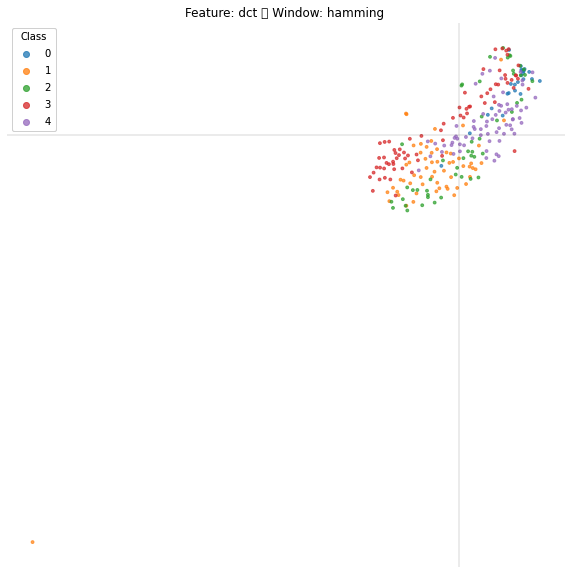

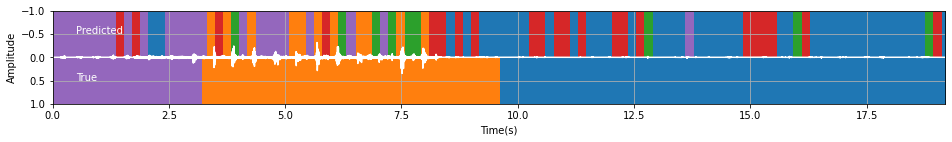

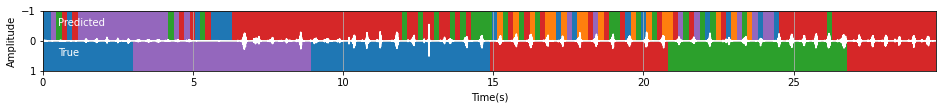

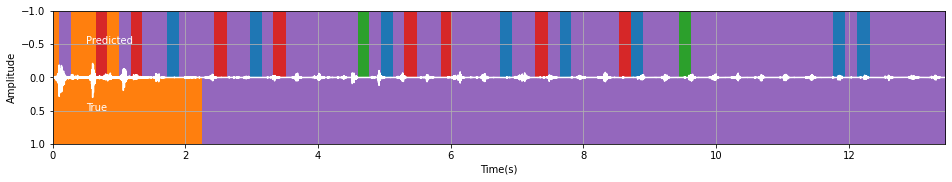

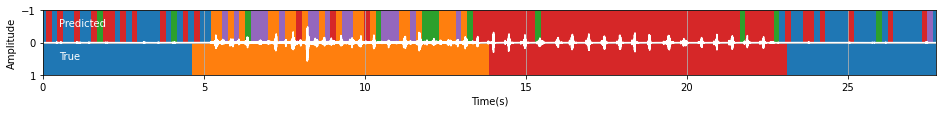

...

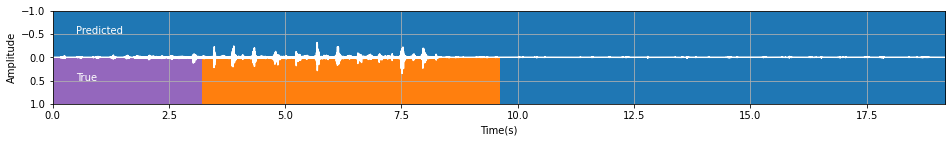

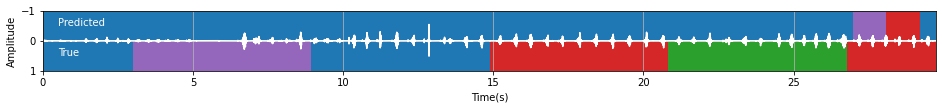

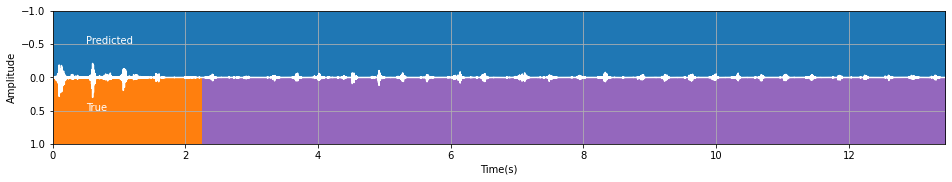

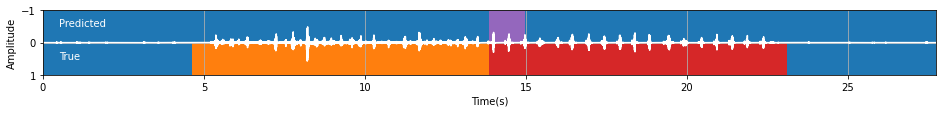

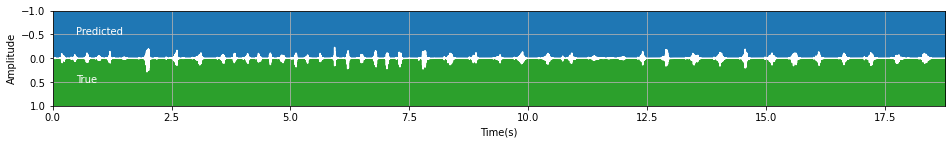

In [26]:
#Dictionary to keep the record of scores for every corresponding value of feature and window
tsne_score_features = {}

#Features 
features= ['dct', 'fft', 'fft_phase', 'dct_phase', 'cepstrum', 'raw']
#Windows
windows= ['hamming', 'hann', 'boxcar', 'blackmanharris']

for i in features:
    for j in windows:
        
        #Random window size
        window_size = np.random.randint(36, 6000)
        #Random step size
        step_size = np.random.randint(36,window_size)
        
        #Creating different parameters with random window size for every combination of feature and window
        parameters = {
            'size': window_size,
            'step': step_size,
            'decimate': 1,
            'feature_range': (0.0, 1.0),
            'window_fn': j,
            'feature_fn': i
        }
        
        #Loading the data into a set of features and labels
        print(f"Feature: {i} - Window: {j}")
        X, y = audio_task.load_data(parameters)
        print("X shape: ", X.shape, "y shape: ", y.shape, "\n\n")
        
        #PLotting the visualization
        plot_tsne(i, j)
        
        #Classifying the feature vector space and creating a graph between true and predicted value
        score=features_tsne(X, y, parameters)
        tsne_score_features[f"Feature -> {i} : Window -> {j} : Window_size -> {window_size} : Step_size -> {step_size}"] = score

In [27]:
#Sorting the scores from lowest to highest 

tsne_scores = {}

keys_tsne_sorted = sorted(tsne_score_features, key=tsne_score_features.get)

for i in keys_tsne_sorted:
    tsne_scores[i] = tsne_score_features[i]
    
for i in tsne_scores.keys():
    print((i, tsne_scores[i]))

('Feature -> raw : Window -> blackmanharris : Window_size -> 4886 : Step_size -> 4194', 14.165165091011216)
('Feature -> raw : Window -> hamming : Window_size -> 5922 : Step_size -> 3163', 15.004830098957454)
('Feature -> raw : Window -> boxcar : Window_size -> 3578 : Step_size -> 2301', 17.117687596156134)
('Feature -> fft_phase : Window -> hann : Window_size -> 2004 : Step_size -> 1853', 44.54933857488293)
('Feature -> dct_phase : Window -> blackmanharris : Window_size -> 4760 : Step_size -> 4281', 45.224324336572856)
('Feature -> fft_phase : Window -> blackmanharris : Window_size -> 5164 : Step_size -> 2153', 48.14026568330307)
('Feature -> dct_phase : Window -> boxcar : Window_size -> 2575 : Step_size -> 1742', 52.78794059929486)
('Feature -> raw : Window -> hann : Window_size -> 1773 : Step_size -> 158', 53.60405417443236)
('Feature -> fft_phase : Window -> hamming : Window_size -> 1619 : Step_size -> 419', 53.66150368076876)
('Feature -> fft_phase : Window -> boxcar : Window_size

In [28]:
#The best score that we get by using TSNE is 71.69.
#Feature : fft
#Window : boxcar
#Window size : 315
#Step size : 207

In [29]:
import umap

def plot_umap(i,j):
    # example showing PCA of features
    fig, ax = plt.subplots(figsize=(10, 10))

    # create a UMAP object
    ump = umap.UMAP(n_components=2)

    # transform every fifth vector (to save computation time)
    # some techniques need this; others will be fast enough
    subsample = 5
    ump_X=ump.fit_transform(X[::subsample, :])

    scatter = ax.scatter(
        ump_X[:, 0],
        ump_X[:, 1],
        c=y[::subsample],
        cmap="tab10",
        vmin=0,
        vmax=10,
        alpha=0.7,
        s=8,
    )
    ##### Make the figure look a bit cleaner
    # Produce a legend for the ranking (colors). Even though there are 40 different
    # rankings, we only want to show 5 of them in the legend.
    legend1 = ax.legend(*scatter.legend_elements(num=4), loc="upper left", title="Class")
    ax.add_artist(legend1)
    ax.set_title(f"Feature: {i} \t Window: {j} ")
    ax.axhline(0, color="k", alpha=0.1)
    ax.axvline(0, color="k", alpha=0.1)
    ax.axis("off")

In [30]:
#fit a classifier
def features_umap(X, y, parameters):
    classifier = audio_task.knn_fit(X, y)
    
    #Prediction using visualization for the training data
    for i in range(5):
        audio_task.plot_test(classifier, parameters, f"data/challenge_test_{i}")
        
    score = test_accuracy_ump(classifier, parameters)
    return score

#Finding the accuracy of the test set
def test_accuracy_ump(classifier, parameters):
    score = audio_task.run_secret_test(classifier, parameters)
    return score

Feature: dct 	 Window: hamming
Loading into 49 windows of length 2974
Loading into 116 windows of length 2974
Loading into 100 windows of length 2974
Loading into 141 windows of length 2974
Loading into 137 windows of length 2974
Using dct transform and a hamming window.
X shape:  (543, 2974) y shape:  (543,) 


Testing with data/challenge_test_0
Loading into 43 windows of length 2974
Predicting...
Prediction accuracy 0.702
Confusion matrix
[[491   0   0   0]
 [ 59  70 129  70]
 [  0   0   0   0]
 [ 24   0  11 129]]

Testing with data/challenge_test_1
Loading into 67 windows of length 2974
Predicting...
Prediction accuracy 0.198
Confusion matrix
[[ 58  23   0 224 153]
 [  0   0   0   0   0]
 [  0  30  24 113 138]
 [  0 108  92 152 104]
 [ 92   0   0 145  67]]

Testing with data/challenge_test_2
Loading into 29 windows of length 2974
Predicting...
Prediction accuracy 0.762
Confusion matrix
[[  0   0   0   0]
 [ 24   0  24  67]
 [  0   0   0   0]
 [ 49   0   0 525]]

Testing with data/ch

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

*** Total score: 61.64 ***
Feature: dct 	 Window: hann
Loading into 321 windows of length 1737
Loading into 760 windows of length 1737
Loading into 653 windows of length 1737
Loading into 926 windows of length 1737
Loading into 897 windows of length 1737
Using dct transform and a hann window.
X shape:  (3557, 1737) y shape:  (3557,) 


Testing with data/challenge_test_0
Loading into 280 windows of length 1737
Predicting...
Prediction accuracy 0.449
Confusion matrix
[[290   0 106  85  10]
 [ 63  60 125  13  67]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 24   0  41   8  91]]

Testing with data/challenge_test_1
Loading into 437 windows of length 1737
Predicting...
Prediction accuracy 0.255
Confusion matrix
[[ 36  10  63 260  89]
 [  0   0   0   0   0]
 [ 11  36  65 151  42]
 [ 18  75 140 200  23]
 [ 55   0  14 147  88]]

Testing with data/challenge_test_2
Loading into 195 windows of length 1737
Predicting...
Prediction accuracy 0.646
Confusion matrix
[[  0   0   0   0   0]
 [ 19  24

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 222 windows of length 1737
Predicting...
Loading into 130 windows of length 1737
Predicting...
Loading into 641 windows of length 1737
Predicting...
Loading into 24 windows of length 1737
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 256 windows of length 1737
Predicting...
Loading into 178 windows of length 1737
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 543 windows of length 1737
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 72.77 ***
Feature: dct 	 Window: boxcar
Loading into 33 windows of length 3858
Loading into 78 windows of length 3858
Loading into 67 windows of length 3858
Loading into 95 windows of length 3858
Loading into 92 windows of length 3858
Using dct transform and a boxcar window.
X shape:  (365, 3858) y shape:  (365,) 


Testing with data/challenge_test_0
Loading into 28 windows of length 3858
Predicting...
Prediction accuracy 0.647
Confusion matrix
[[491   0   0   0]
 [ 73  36  74 145]
 [  0   0   0   0]
 [ 55   0   0 109]]

Testing with data/challenge_test_1
Loading into 44 windows of length 3858
Predicting...
Prediction accuracy 0.243
Confusion matrix
[[ 54   0  36 234 134]
 [  0   0   0   0   0]
 [  0   0  86  78 141]
 [  0  35 234 152  35]
 [106   0   0 120  78]]

Testing with data/challenge_test_2
Loading into 20 windows of length 3858
Predicting...
Prediction accuracy 0.737
Confusion matrix
[[  0   0   0]
 [ 24  19  72]
 [ 85   0 489]]

Testing with data/challenge_te

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 18 windows of length 3858
Predicting...
Loading into 55 windows of length 3858
Predicting...
*** Total score: 55.21 ***
Feature: dct 	 Window: blackmanharris
Loading into 162 windows of length 4176
Loading into 389 windows of length 4176
Loading into 334 windows of length 4176
Loading into 475 windows of length 4176
Loading into 460 windows of length 4176
Using dct transform and a blackmanharris window.
X shape:  (1820, 4176) y shape:  (1820,) 


Testing with data/challenge_test_0
Loading into 141 windows of length 4176
Predicting...
Prediction accuracy 0.670
Confusion matrix
[[484   0   7   0   0]
 [ 61  63  85  21  98]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 45   7   0   0 112]]

Testing with data/challenge_test_1
Loading into 222 windows of length 4176
Predicting...


C:\Users\vsneg\Downloads\Audio Classification\audio_task.py:162: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16, 4))


Prediction accuracy 0.188
Confusion matrix
[[ 38   7  28 242 143]
 [  0   0   0   0   0]
 [ 21  34  19 113 118]
 [  7  76 160 152  61]
 [ 83   0   0 143  78]]

Testing with data/challenge_test_2
Loading into 96 windows of length 4176
Predicting...
Prediction accuracy 0.797
Confusion matrix
[[  0   0   0   0   0]
 [ 29  33   0   0  53]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 43   0   7   8 516]]

Testing with data/challenge_test_3
Loading into 207 windows of length 4176
Predicting...
Prediction accuracy 0.797
Confusion matrix
[[474   0   0   0   0]
 [ 22 186  55  38 172]
 [  0   0   0   0   0]
 [  1   0   0 472   0]
 [  0   0   0   0   0]]

Testing with data/challenge_test_4
Loading into 137 windows of length 4176
Predicting...
Prediction accuracy 0.234
Confusion matrix
[[  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 30 112 225  35 559]
 [  0   0   0   0   0]
 [  0   0   0   0   0]]

Loading into 367 windows of length 4176
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 111 windows of length 4176
Predicting...
Loading into 63 windows of length 4176
Predicting...
Loading into 327 windows of length 4176
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 8 windows of length 4176
Predicting...
Loading into 128 windows of length 4176
Predicting...
Loading into 88 windows of length 4176
Predicting...
Loading into 277 windows of length 4176
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 68.91 ***
Feature: fft 	 Window: hamming
Loading into 341 windows of length 4474
Loading into 822 windows of length 4474
Loading into 704 windows of length 4474
Loading into 1003 windows of length 4474
Loading into 972 windows of length 4474
Using fft transform and a hamming window.
X shape:  (3842, 4474) y shape:  (3842,) 


Testing with data/challenge_test_0
Loading into 296 windows of length 4474
Predicting...
Prediction accuracy 0.656
Confusion matrix
[[474   0   0  17   0]
 [132  61 118  10   7]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 50   0   4   0 110]]

Testing with data/challenge_test_1
Loading into 468 windows of length 4474
Predicting...
Prediction accuracy 0.209
Confusion matrix
[[ 41  23  43 226 125]
 [  0   0   0   0   0]
 [ 58  51  36 114  46]
 [  3 115 176 152  10]
 [ 56   0   0 158  90]]

Testing with data/challenge_test_2
Loading into 202 windows of length 4474
Predicting...
Prediction accuracy 0.843
Confusion matrix
[[  0   0   0   0]
 [  3 

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 232 windows of length 4474
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 131 windows of length 4474
Predicting...
Loading into 691 windows of length 4474
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 15 windows of length 4474
Predicting...
Loading into 269 windows of length 4474
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 185 windows of length 4474
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 584 windows of length 4474
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 72.19 ***
Feature: fft 	 Window: hann
Loading into 50 windows of length 5144
Loading into 120 windows of length 5144
Loading into 103 windows of length 5144
Loading into 147 windows of length 5144
Loading into 142 windows of length 5144
Using fft transform and a hann window.
X shape:  (562, 5144) y shape:  (562,) 


Testing with data/challenge_test_0
Loading into 43 windows of length 5144
Predicting...
Prediction accuracy 0.810
Confusion matrix
[[491   0   0   0]
 [ 59 188  58  23]
 [  0   0   0   0]
 [ 36   0  11 117]]

Testing with data/challenge_test_1
Loading into 68 windows of length 5144
Predicting...
Prediction accuracy 0.209
Confusion matrix
[[ 35  23   0 260 140]
 [  0   0   0   0   0]
 [  0  82  46  87  90]
 [  0 258  46 152   0]
 [ 68   0   0 150  86]]

Testing with data/challenge_test_2
Loading into 30 windows of length 5144
Predicting...
Prediction accuracy 0.827
Confusion matrix
[[  0   0   0]
 [  8  36  71]
 [ 40   0 534]]

Testing with data/challenge_te

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Predicting...
Loading into 2 windows of length 5144
Predicting...
Loading into 39 windows of length 5144
Predicting...
Loading into 27 windows of length 5144
Predicting...
Loading into 85 windows of length 5144
Predicting...
*** Total score: 69.09 ***
Feature: fft 	 Window: boxcar
Loading into 32 windows of length 5837
Loading into 77 windows of length 5837


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 66 windows of length 5837
Loading into 94 windows of length 5837
Loading into 91 windows of length 5837
Using fft transform and a boxcar window.
X shape:  (360, 5837) y shape:  (360,) 


Testing with data/challenge_test_0
Loading into 28 windows of length 5837
Predicting...
Prediction accuracy 0.759
Confusion matrix
[[491   0   0   0   0]
 [ 37 146  73  36  36]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 19   0  36   0 109]]

Testing with data/challenge_test_1
Loading into 44 windows of length 5837
Predicting...
Prediction accuracy 0.219
Confusion matrix
[[ 53  36   0 234 135]
 [  0   0   0   0   0]
 [ 35  35  86 114  35]
 [  0 212  92 152   0]
 [106   0   0 156  42]]

Testing with data/challenge_test_2
Loading into 19 windows of length 5837
Predicting...
Prediction accuracy 0.862
Confusion matrix
[[ 20  95]
 [  0 574]]

Testing with data/challenge_test_3
Loading into 41 windows of length 5837
Predicting...
Prediction accuracy 0.833
Confusion matrix
[[426   0   6  42]

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 1 windows of length 5837
Predicting...
Loading into 25 windows of length 5837
Predicting...
Loading into 17 windows of length 5837
Predicting...
Loading into 55 windows of length 5837
Predicting...
*** Total score: 71.98 ***
Feature: fft 	 Window: blackmanharris
Loading into 143 windows of length 4186
Loading into 345 windows of length 4186
Loading into 295 windows of length 4186
Loading into 420 windows of length 4186


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 407 windows of length 4186
Using fft transform and a blackmanharris window.
X shape:  (1610, 4186) y shape:  (1610,) 


Testing with data/challenge_test_0
Loading into 125 windows of length 4186
Predicting...
Prediction accuracy 0.661
Confusion matrix
[[491   0   0   0   0]
 [ 74  56 174   8  16]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 29   0  32   0 103]]

Testing with data/challenge_test_1
Loading into 197 windows of length 4186
Predicting...
Prediction accuracy 0.215
Confusion matrix
[[ 43  15  39 239 122]
 [  0   0   0   0   0]
 [  7  50  40 116  92]
 [  0 114 117 152  73]
 [ 62   0   0 150  92]]

Testing with data/challenge_test_2
Loading into 85 windows of length 4186
Predicting...
Prediction accuracy 0.816
Confusion matrix
[[  0   0   0   0]
 [ 17  38   8  52]
 [  0   0   0   0]
 [ 50   0   0 524]]

Testing with data/challenge_test_3
Loading into 183 windows of length 4186
Predicting...
Prediction accuracy 0.794
Confusion matrix
[[474   0   0   0   0]
 [ 56

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 98 windows of length 4186
Predicting...
Loading into 56 windows of length 4186
Predicting...
Loading into 290 windows of length 4186
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 7 windows of length 4186
Predicting...
Loading into 113 windows of length 4186
Predicting...
Loading into 78 windows of length 4186
Predicting...
Loading into 245 windows of length 4186
Predicting...
*** Total score: 69.31 ***
Feature: fft_phase 	 Window: hamming
Loading into 110 windows of length 3088
Loading into 263 windows of length 3088
Loading into 225 windows of length 3088


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 320 windows of length 3088
Loading into 311 windows of length 3088
Using fft_phase transform and a hamming window.
X shape:  (1229, 3088) y shape:  (1229,) 


Testing with data/challenge_test_0
Loading into 96 windows of length 3088
Predicting...
Prediction accuracy 0.213
Confusion matrix
[[ 43 168  62 132  86]
 [ 72 114  11  68  63]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 21   0  30  61  52]]

Testing with data/challenge_test_1
Loading into 151 windows of length 3088
Predicting...
Prediction accuracy 0.171
Confusion matrix
[[ 21 117  50 168 102]
 [  0   0   0   0   0]
 [ 66  30  30 134  45]
 [ 46  50 137 168  55]
 [ 50  98  50  65  41]]

Testing with data/challenge_test_2
Loading into 66 windows of length 3088
Predicting...
Prediction accuracy 0.312
Confusion matrix
[[  0   0   0   0   0]
 [  0  56  11  27  21]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 22 160  54 179 159]]

Testing with data/challenge_test_3
Loading into 140 windows of length 3088
Predicti

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 7 windows of length 3088
Predicting...
Loading into 87 windows of length 3088
Predicting...
Loading into 61 windows of length 3088
Predicting...
Loading into 187 windows of length 3088
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

*** Total score: 54.72 ***
Feature: fft_phase 	 Window: hann
Loading into 130 windows of length 1383
Loading into 308 windows of length 1383
Loading into 264 windows of length 1383
Loading into 375 windows of length 1383
Loading into 363 windows of length 1383
Using fft_phase transform and a hann window.
X shape:  (1440, 1383) y shape:  (1440,) 


Testing with data/challenge_test_0
Loading into 114 windows of length 1383
Predicting...
Prediction accuracy 0.228
Confusion matrix
[[ 42 157  61 132  99]
 [ 51 122  35  68  52]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 26  23   9  46  60]]

Testing with data/challenge_test_1
Loading into 177 windows of length 1383
Predicting...
Prediction accuracy 0.204
Confusion matrix
[[ 34 110  85 164  65]
 [  0   0   0   0   0]
 [ 17 104  47  59  78]
 [ 36 111  82 161  66]
 [ 18 103  36  78  69]]

Testing with data/challenge_test_2
Loading into 79 windows of length 1383
Predicting...
Prediction accuracy 0.266
Confusion matrix
[[  0   0   0   0   0

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 90 windows of length 1383
Predicting...
Loading into 53 windows of length 1383
Predicting...
Loading into 260 windows of length 1383
Predicting...
Loading into 10 windows of length 1383
Predicting...
Loading into 104 windows of length 1383
Predicting...
Loading into 73 windows of length 1383
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 220 windows of length 1383
Predicting...
*** Total score: 57.55 ***
Feature: fft_phase 	 Window: boxcar
Loading into 68 windows of length 1746
Loading into 160 windows of length 1746
Loading into 137 windows of length 1746
Loading into 194 windows of length 1746
Loading into 188 windows of length 1746
Using fft_phase transform and a boxcar window.
X shape:  (747, 1746) y shape:  (747,) 


Testing with data/challenge_test_0
Loading into 59 windows of length 1746
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0 491   0]
 [  0   0 328   0]
 [  0   0   0   0]
 [  0   0 164   0]]

Testing with data/challenge_test_1
Loading into 92 windows of length 1746
Predicting...
Prediction accuracy 0.297
Confusion matrix
[[  0   0 458   0]
 [  0   0 275  30]
 [  0   0 453   3]
 [  0   0 304   0]]

Testing with data/challenge_test_2
Loading into 41 windows of length 1746
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0 115   0]
 [  0   0   0]
 [  0 574   0]]


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 35 windows of length 3800
Loading into 83 windows of length 3800
Loading into 71 windows of length 3800
Loading into 101 windows of length 3800
Loading into 98 windows of length 3800
Using fft_phase transform and a blackmanharris window.
X shape:  (388, 3800) y shape:  (388,) 


Testing with data/challenge_test_0
Loading into 30 windows of length 3800
Predicting...
Prediction accuracy 0.051
Confusion matrix
[[ 17 237  67 102  68]
 [ 23  33  68 136  68]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 45  68  34  17   0]]

Testing with data/challenge_test_1
Loading into 48 windows of length 3800
Predicting...
Prediction accuracy 0.234
Confusion matrix
[[ 32  78 136 116  96]
 [  0   0   0   0   0]
 [  0  59  33 129  84]
 [ 16 168   0 194  78]
 [  0  84  59  64  97]]

Testing with data/challenge_test_2
Loading into 21 windows of length 3800
Predicting...
Prediction accuracy 0.290
Confusion matrix
[[  0   0   0   0   0]
 [  0  62   0   0  53]
 [  0   0   0   0   0]
 [  0   0  

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 57 windows of length 5794
Loading into 81 windows of length 5794
Loading into 79 windows of length 5794
Using dct_phase transform and a hamming window.
X shape:  (311, 5794) y shape:  (311,) 


Testing with data/challenge_test_0
Loading into 24 windows of length 5794
Predicting...
Prediction accuracy 0.066
Confusion matrix
[[  0 128  64 129 170]
 [ 42  43  43 114  86]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0  85  43  14  22]]

Testing with data/challenge_test_1
Loading into 38 windows of length 5794
Predicting...
Prediction accuracy 0.203
Confusion matrix
[[  0 121  82 132 123]
 [  0   0   0   0   0]
 [  0 149   0   0 156]
 [ 41 139  41 227   8]
 [  0  24   0 198  82]]

Testing with data/challenge_test_2
Loading into 16 windows of length 5794
Predicting...
Prediction accuracy 0.334
Confusion matrix
[[ 92   0  23   0]
 [  0   0   0   0]
 [  0   0   0   0]
 [138 183 115 138]]

Testing with data/challenge_test_3
Loading into 35 windows of length 5794
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 15 windows of length 5794
Predicting...
Loading into 47 windows of length 5794
Predicting...
*** Total score: 43.09 ***
Feature: dct_phase 	 Window: hann
Loading into 2354 windows of length 425
Loading into 5534 windows of length 425


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classificat

Loading into 4754 windows of length 425
Loading into 6729 windows of length 425
Loading into 6525 windows of length 425
Using dct_phase transform and a hann window.
X shape:  (25896, 425) y shape:  (25896,) 


Testing with data/challenge_test_0
Loading into 2058 windows of length 425
Predicting...
Prediction accuracy 0.212
Confusion matrix
[[ 46 118  89 127 111]
 [ 10 116  73  61  68]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  7  57  28  26  46]]

Testing with data/challenge_test_1
Loading into 3194 windows of length 425
Predicting...
Prediction accuracy 0.171
Confusion matrix
[[ 21  97  91 116 133]
 [  0   0   0   0   0]
 [ 15  83  58  65  84]
 [ 32 121  85 114 104]
 [ 18  81  48  90  67]]

Testing with data/challenge_test_2
Loading into 1440 windows of length 425
Predicting...
Prediction accuracy 0.253
Confusion matrix
[[  0   0   0   0   0]
 [ 10  35  25  24  21]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 41 144 118 132 139]]

Testing with data/challenge_test_3
Loading 

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1638 windows of length 425
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 970 windows of length 425
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 4668 windows of length 425
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 204 windows of length 425
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1881 windows of length 425
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1323 windows of length 425
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 3959 windows of length 425
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 67.05 ***
Feature: dct_phase 	 Window: boxcar
Loading into 26 windows of length 5494
Loading into 62 windows of length 5494
Loading into 53 windows of length 5494
Loading into 76 windows of length 5494
Loading into 74 windows of length 5494
Using dct_phase transform and a boxcar window.
X shape:  (291, 5494) y shape:  (291,) 


Testing with data/challenge_test_0
Loading into 23 windows of length 5494
Predicting...
Prediction accuracy 0.153
Confusion matrix
[[ 45 245  67 134   0]
 [ 45  37 113  44  89]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0   7  45  44  68]]

Testing with data/challenge_test_1
Loading into 36 windows of length 5494
Predicting...
Prediction accuracy 0.114
Confusion matrix
[[ 44 109 131  43 131]
 [  0   0   0   0   0]
 [  0 174   0 131   0]
 [ 87 173  88  86  22]
 [  0  87 130  43  44]]

Testing with data/challenge_test_2
Loading into 15 windows of length 5494
Predicting...
Prediction accuracy 0.202
Confusion matrix
[[  0   0   0   0   0]
 [ 

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 115 windows of length 3533
Loading into 111 windows of length 3533
Using dct_phase transform and a blackmanharris window.
X shape:  (441, 3533) y shape:  (441,) 


Testing with data/challenge_test_0
Loading into 34 windows of length 3533
Predicting...
Prediction accuracy 0.301
Confusion matrix
[[ 88 119  90  90 104]
 [  0 178  30  60  60]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0  60  15  59  30]]

Testing with data/challenge_test_1
Loading into 54 windows of length 3533
Predicting...
Prediction accuracy 0.211
Confusion matrix
[[ 29 143 102 126  58]
 [  0   0   0   0   0]
 [  0  58  40 149  58]
 [  0 116 145 195   0]
 [ 29  57  58 103  57]]

Testing with data/challenge_test_2
Loading into 24 windows of length 3533
Predicting...
Prediction accuracy 0.218
Confusion matrix
[[  0   0   0   0   0]
 [  0   0  10  30  75]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 30 135  80 179 150]]

Testing with data/challenge_test_3
Loading into 50 windows of length 3533
Predi

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

*** Total score: 45.07 ***
Feature: cepstrum 	 Window: hamming
Loading into 509 windows of length 396
Loading into 1195 windows of length 396
Loading into 1027 windows of length 396
Loading into 1453 windows of length 396
Loading into 1409 windows of length 396
Using cepstrum transform and a hamming window.
X shape:  (5593, 396) y shape:  (5593,) 


Testing with data/challenge_test_0
Loading into 445 windows of length 396
Predicting...
Prediction accuracy 0.461
Confusion matrix
[[194   0  68  57 172]
 [ 35 216  34  16  27]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 31  72  18   0  43]]

Testing with data/challenge_test_1
Loading into 690 windows of length 396
Predicting...
Prediction accuracy 0.244
Confusion matrix
[[ 72  53  72 185  76]
 [  0   0   0   0   0]
 [ 24  71  76  85  49]
 [ 41  71 107 131 106]
 [ 63  33  27  89  92]]

Testing with data/challenge_test_2
Loading into 311 windows of length 396
Predicting...
Prediction accuracy 0.453
Confusion matrix
[[  0   0   0   0   0

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 354 windows of length 396
Predicting...
Loading into 210 windows of length 396
Predicting...
Loading into 1008 windows of length 396
Predicting...
Loading into 45 windows of length 396
Predicting...
Loading into 407 windows of length 396
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 286 windows of length 396
Predicting...
Loading into 855 windows of length 396
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 72.08 ***
Feature: cepstrum 	 Window: hann
Loading into 28 windows of length 5379
Loading into 68 windows of length 5379
Loading into 58 windows of length 5379
Loading into 83 windows of length 5379
Loading into 81 windows of length 5379
Using cepstrum transform and a hann window.
X shape:  (318, 5379) y shape:  (318,) 


Testing with data/challenge_test_0
Loading into 25 windows of length 5379
Predicting...
Prediction accuracy 0.790
Confusion matrix
[[491   0   0   0]
 [ 62 163 103   0]
 [  0   0   0   0]
 [ 21   0  20 123]]

Testing with data/challenge_test_1
Loading into 39 windows of length 5379
Predicting...
Prediction accuracy 0.230
Confusion matrix
[[ 21   0  60 205 172]
 [  0   0   0   0   0]
 [  0 144  81  40  40]
 [  0 216 140 100   0]
 [ 40  40   0  76 148]]

Testing with data/challenge_test_2
Loading into 17 windows of length 5379
Predicting...
Prediction accuracy 0.813
Confusion matrix
[[  0   0   0]
 [  7  22  86]
 [ 36   0 538]]

Testing with data/challe

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 15 windows of length 5379
Predicting...
Loading into 48 windows of length 5379
Predicting...
*** Total score: 69.03 ***
Feature: cepstrum 	 Window: boxcar
Loading into 69 windows of length 3485
Loading into 164 windows of length 3485
Loading into 140 windows of length 3485
Loading into 200 windows of length 3485


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 193 windows of length 3485
Using cepstrum transform and a boxcar window.
X shape:  (766, 3485) y shape:  (766,) 


Testing with data/challenge_test_0
Loading into 60 windows of length 3485
Predicting...
Prediction accuracy 0.867
Confusion matrix
[[491   0   0   0]
 [ 50 244  17  17]
 [  0   0   0   0]
 [ 25  22   0 117]]

Testing with data/challenge_test_1
Loading into 94 windows of length 3485
Predicting...
Prediction accuracy 0.208
Confusion matrix
[[ 25  50  16 190 177]
 [  0   0   0   0   0]
 [  0 106  52  82  65]
 [  0 174 143 139   0]
 [ 49   0   0 154 101]]

Testing with data/challenge_test_2
Loading into 41 windows of length 3485
Predicting...
Prediction accuracy 0.848
Confusion matrix
[[  0   0   0   0   0]
 [  0  52   9   0  54]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 17   0   0  25 532]]

Testing with data/challenge_test_3
Loading into 87 windows of length 3485
Predicting...
Prediction accuracy 0.936
Confusion matrix
[[460   0   0  14   0]
 [  3 445  17

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 4 windows of length 3485
Predicting...
Loading into 54 windows of length 3485
Predicting...
Loading into 38 windows of length 3485
Predicting...
Loading into 117 windows of length 3485
Predicting...
*** Total score: 75.65 ***
Feature: cepstrum 	 Window: blackmanharris
Loading into 86 windows of length 4686
Loading into 208 windows of length 4686


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 178 windows of length 4686
Loading into 253 windows of length 4686
Loading into 246 windows of length 4686
Using cepstrum transform and a blackmanharris window.
X shape:  (971, 4686) y shape:  (971,) 


Testing with data/challenge_test_0
Loading into 75 windows of length 4686
Predicting...
Prediction accuracy 0.854
Confusion matrix
[[491   0   0   0]
 [ 60 241  14  13]
 [  0   0   0   0]
 [ 20  37   0 107]]

Testing with data/challenge_test_1
Loading into 118 windows of length 4686
Predicting...
Prediction accuracy 0.242
Confusion matrix
[[ 26  52  26 208 146]
 [  0   0   0   0   0]
 [ 26  71 104  52  52]
 [  0 176 117 124  39]
 [ 65   0   0 125 114]]

Testing with data/challenge_test_2
Loading into 51 windows of length 4686
Predicting...
Prediction accuracy 0.865
Confusion matrix
[[  0   0   0   0   0]
 [ 14  35  14   0  52]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0   0   0  13 561]]

Testing with data/challenge_test_3
Loading into 110 windows of length 4686
Pre

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 4 windows of length 4686
Predicting...
Loading into 68 windows of length 4686
Predicting...
Loading into 47 windows of length 4686
Predicting...
Loading into 148 windows of length 4686
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

*** Total score: 73.26 ***
Feature: raw 	 Window: hamming
Loading into 100 windows of length 1282
Loading into 236 windows of length 1282
Loading into 202 windows of length 1282
Loading into 287 windows of length 1282
Loading into 278 windows of length 1282
Using raw transform and a hamming window.
X shape:  (1103, 1282) y shape:  (1103,) 




C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Testing with data/challenge_test_0
Loading into 87 windows of length 1282
Predicting...
Prediction accuracy 0.075
Confusion matrix
[[ 74   0 242 175   0]
 [ 90   0  50 154  34]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [102   0  21  41   0]]

Testing with data/challenge_test_1
Loading into 136 windows of length 1282
Predicting...
Prediction accuracy 0.289
Confusion matrix
[[102   0  40 213 103]
 [  0   0   0   0   0]
 [ 46   0  67 125  67]
 [ 45  12  44 226 129]
 [101   0  79  79  45]]

Testing with data/challenge_test_2
Loading into 61 windows of length 1282
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0   0   0   0]
 [ 42   0   5  57  11]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [275   0  74 225   0]]

Testing with data/challenge_test_3
Loading into 127 windows of length 1282
Predicting...
Prediction accuracy 0.333
Confusion matrix
[[208   0 108 158   0]
 [173   0  58 170  72]
 [  0   0   0   0   0]
 [ 11  11  44 265 142]
 [  0   0   0   0   0]]

Testin

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Using raw transform and a hann window.
X shape:  (669, 4769) y shape:  (669,) 


Testing with data/challenge_test_0
Loading into 52 windows of length 4769
Predicting...
Prediction accuracy 0.499
Confusion matrix
[[491   0   0]
 [328   0   0]
 [164   0   0]]

Testing with data/challenge_test_1
Loading into 82 windows of length 4769
Predicting...
Prediction accuracy 0.301
Confusion matrix
[[439   0   0  19]
 [305   0   0   0]
 [456   0   0   0]
 [285   0   0  19]]

Testing with data/challenge_test_2
Loading into 35 windows of length 4769
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0   0]
 [115   0   0]
 [574   0   0]]

Testing with data/challenge_test_3
Loading into 76 windows of length 4769
Predicting...
Prediction accuracy 0.334
Confusion matrix
[[474   0   0   0]
 [454   0   0  19]
 [416   0   0  57]
 [  0   0   0   0]]

Testing with data/challenge_test_4
Loading into 50 windows of length 4769
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0]
 [9

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

*** Total score: 23.75 ***
Feature: raw 	 Window: boxcar
Loading into 147 windows of length 3231
Loading into 350 windows of length 3231
Loading into 300 windows of length 3231
Loading into 427 windows of length 3231
Loading into 414 windows of length 3231
Using raw transform and a boxcar window.
X shape:  (1638, 3231) y shape:  (1638,) 


Testing with data/challenge_test_0
Loading into 128 windows of length 3231
Predicting...
Prediction accuracy 0.499
Confusion matrix
[[491   0   0   0]
 [320   0   8   0]
 [  0   0   0   0]
 [164   0   0   0]]

Testing with data/challenge_test_1
Loading into 200 windows of length 3231
Predicting...
Prediction accuracy 0.306
Confusion matrix
[[420   0  38   0]
 [300   0   0   5]
 [439   0   0  17]
 [258   0   0  46]]

Testing with data/challenge_test_2
Loading into 88 windows of length 3231
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0   0]
 [115   0   0]
 [574   0   0]]

Testing with data/challenge_test_3
Loading into 187 windows 

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 101 windows of length 3231
Predicting...
Loading into 58 windows of length 3231
Predicting...
Loading into 295 windows of length 3231
Predicting...
Loading into 9 windows of length 3231
Predicting...
Loading into 116 windows of length 3231
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 80 windows of length 3231
Predicting...
Loading into 249 windows of length 3231
Predicting...
*** Total score: 31.18 ***
Feature: raw 	 Window: blackmanharris
Loading into 30 windows of length 3307
Loading into 71 windows of length 3307
Loading into 61 windows of length 3307
Loading into 87 windows of length 3307
Loading into 84 windows of length 3307
Using raw transform and a blackmanharris window.
X shape:  (333, 3307) y shape:  (333,) 


Testing with data/challenge_test_0
Loading into 26 windows of length 3307
Predicting...
Prediction accuracy 0.499
Confusion matrix
[[491   0   0]
 [328   0   0]
 [164   0   0]]

Testing with data/challenge_test_1
Loading into 41 windows of length 3307
Predicting...
Prediction accuracy 0.288
Confusion matrix
[[381   0   0  77]
 [286   0   0  19]
 [418   0  19  19]
 [266   0   0  38]]

Testing with data/challenge_test_2
Loading into 18 windows of length 3307
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0   0]
 [115   0

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

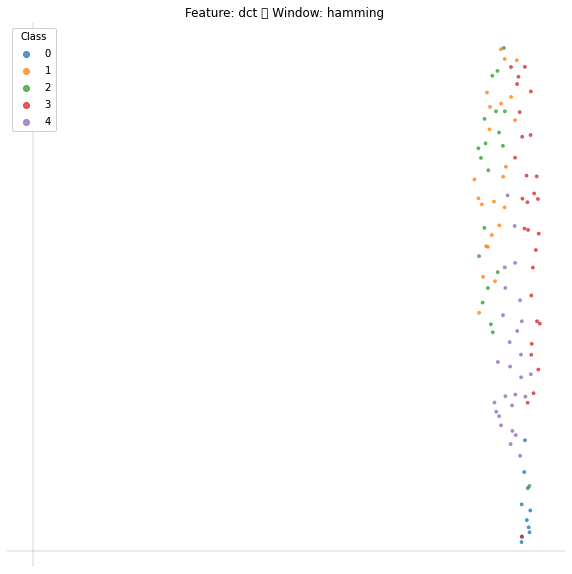

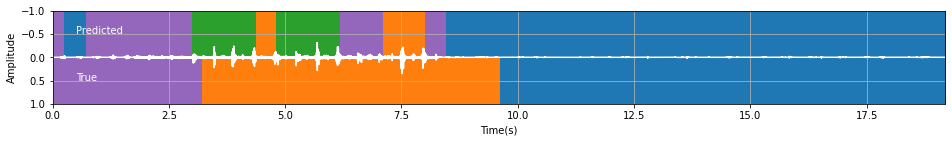

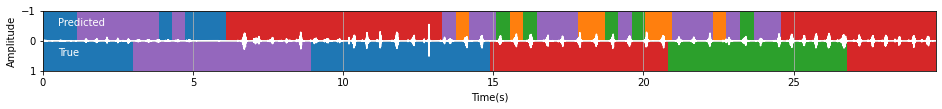

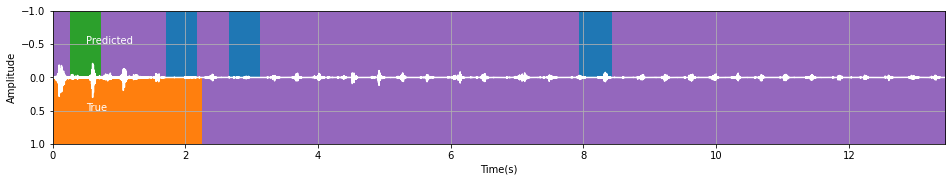

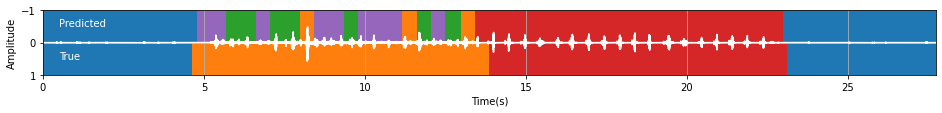

...

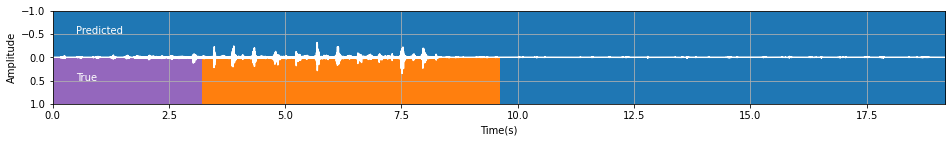

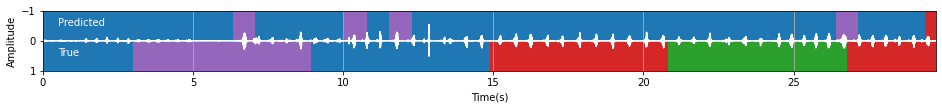

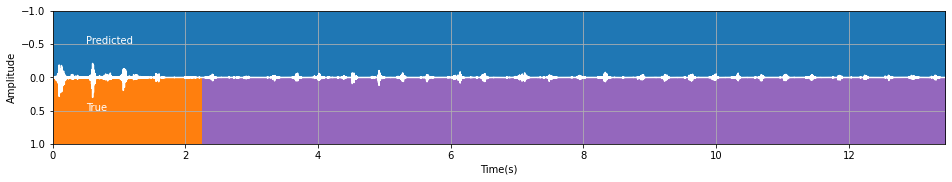

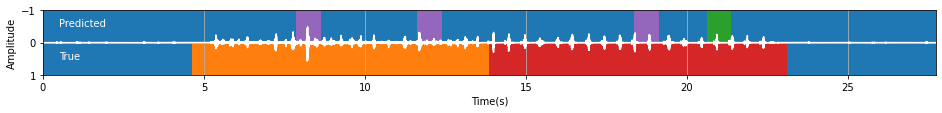

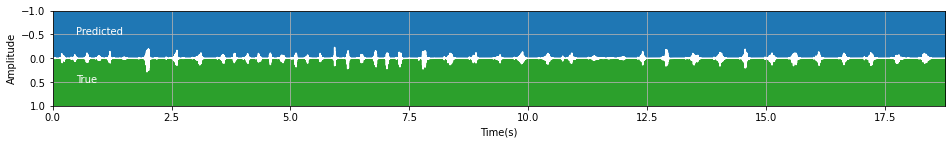

In [31]:
#Dictionary to keep the record of scores for every corresponding value of feature and window
ump_score_features = {}

#Features
features= ['dct', 'fft', 'fft_phase', 'dct_phase', 'cepstrum', 'raw']
#Windows
windows= ['hamming', 'hann', 'boxcar', 'blackmanharris']

for i in features:
    for j in windows:
        
        #Random window size
        window_size = np.random.randint(36, 6000)
        #Random step size
        step_size = np.random.randint(36,window_size)
        
        #Creating different parameters with random window size for evert=y combination of feature and window
        parameters = {
            'size': window_size,
            'step': step_size,
            'decimate': 1,
            'feature_range': (0.0, 1.0),
            'window_fn': j,
            'feature_fn': i
        }
        print(f"Feature: {i} \t Window: {j}")
        
        #Loading the data into a set of features and labels
        X, y = audio_task.load_data(parameters)
        print("X shape: ", X.shape, "y shape: ", y.shape, "\n\n")
        
        #PLotting the visualization
        plot_umap(i, j)
        
        #Classifying the feature vector space and creating a graph between true and predicted value
        score=features_umap(X, y, parameters)
        ump_score_features[f"Feature -> {i} : Window -> {j} : Window_size -> {window_size} : Step_size -> {step_size}"] = score

In [32]:
#Sorting the scores from lowest to highest 
ump_scores = {}

keys_ump_sorted = sorted(ump_score_features, key=ump_score_features.get)

for i in keys_ump_sorted:
    ump_scores[i] = ump_score_features[i]
    
for i in ump_scores.keys():
    print((i, ump_scores[i]))

('Feature -> raw : Window -> blackmanharris : Window_size -> 3307 : Step_size -> 2928', 17.753871083641748)
('Feature -> raw : Window -> hann : Window_size -> 4769 : Step_size -> 1443', 23.749152132617382)
('Feature -> raw : Window -> boxcar : Window_size -> 3231 : Step_size -> 593', 31.182677582931035)
('Feature -> dct_phase : Window -> boxcar : Window_size -> 5494 : Step_size -> 3321', 40.91347349342344)
('Feature -> dct_phase : Window -> hamming : Window_size -> 5794 : Step_size -> 3107', 43.093192010969744)
('Feature -> dct_phase : Window -> blackmanharris : Window_size -> 3533 : Step_size -> 2210', 45.07468578673327)
('Feature -> fft_phase : Window -> boxcar : Window_size -> 1746 : Step_size -> 1313', 45.63593424094437)
('Feature -> raw : Window -> hamming : Window_size -> 1282 : Step_size -> 890', 46.81570370867085)
('Feature -> fft_phase : Window -> blackmanharris : Window_size -> 3800 : Step_size -> 2503', 47.20298179803751)
('Feature -> fft_phase : Window -> hamming : Window_s

In [33]:
#The best score that we get by using Umap is 75.64.
#Feature : cepstrum
#Window : boxcar
#Window size : 3485
#Step size : 1269

In [34]:
#In every iteration we get different scores but umap has performed well in every iteration as the score was more than 80 in some of the iterations.

#In search of better score, we are using subsample as 10 this time. We are using this only for umap as it is giving the better results.

In [35]:
def plot_ump_new(i,j):
    # example showing PCA of features
    fig, ax = plt.subplots(figsize=(10, 10))
    
    # create a UMAP object
    ump = umap.UMAP(n_components=2)

    # transform every fifth vector (to save computation time)
    # some techniques need this; others will be fast enough
    subsample = 10
    ump_X=ump.fit_transform(X[::subsample, :])
    
    # show a scatter plot of the first two dimensions
    scatter = ax.scatter(
        ump_X[:, 0],
        ump_X[:, 1],
        c=y[::subsample],
        cmap="tab10",
        vmin=0,
        vmax=10,
        alpha=0.7,
        s=8,
    )
    ##### Make the figure look a bit cleaner
    # Produce a legend for the ranking (colors). Even though there are 40 different
    # rankings, we only want to show 5 of them in the legend.
    legend1 = ax.legend(*scatter.legend_elements(num=4), loc="upper left", title="Class")
    ax.add_artist(legend1)
    ax.set_title(f"Feature: {i} \t Window: {j} ")
    ax.axhline(0, color="k", alpha=0.1)
    ax.axvline(0, color="k", alpha=0.1)
    ax.axis("off")

In [36]:
#fit a classifier
def features_ump_new(X, y, parameters):
    classifier = audio_task.knn_fit(X, y)
 
    #Prediction using visualization for the training data
    for i in range(5):
        audio_task.plot_test(classifier, parameters, f"data/challenge_test_{i}")
        
    score=test_accuracy_ump_new(classifier, parameters)
    return score

#Finding the accuracy of the test set
def test_accuracy_ump_new(classifier, parameters):
    score = audio_task.run_secret_test(classifier, parameters)
    return score

Feature: dct - Window: hamming
Loading into 108 windows of length 2005
Loading into 257 windows of length 2005
Loading into 220 windows of length 2005
Loading into 313 windows of length 2005
Loading into 303 windows of length 2005
Using dct transform and a hamming window.
X shape:  (1201, 2005) y shape:  (1201,) 


Testing with data/challenge_test_0
Loading into 95 windows of length 2005
Predicting...
Prediction accuracy 0.683
Confusion matrix
[[491   0   0   0   0]
 [ 58  80  96  21  73]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 42   1  21   0 100]]

Testing with data/challenge_test_1
Loading into 148 windows of length 2005
Predicting...
Prediction accuracy 0.217
Confusion matrix
[[ 57  10  32 242 117]
 [  0   0   0   0   0]
 [ 22  46  21 155  61]
 [ 31  96 115 152  62]
 [ 73   0   0 130 101]]

Testing with data/challenge_test_2
Loading into 66 windows of length 2005
Predicting...
Prediction accuracy 0.762
Confusion matrix
[[  0   0   0   0]
 [ 32  27   0  56]
 [  0   0   0   0

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 75 windows of length 2005
Predicting...
Loading into 44 windows of length 2005
Predicting...
Loading into 216 windows of length 2005
Predicting...
Loading into 8 windows of length 2005
Predicting...
Loading into 86 windows of length 2005
Predicting...
Loading into 60 windows of length 2005
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 183 windows of length 2005
Predicting...
*** Total score: 66.80 ***
Feature: dct - Window: hann
Loading into 28 windows of length 3339
Loading into 67 windows of length 3339
Loading into 57 windows of length 3339
Loading into 81 windows of length 3339
Loading into 79 windows of length 3339
Using dct transform and a hann window.
X shape:  (312, 3339) y shape:  (312,) 


Testing with data/challenge_test_0
Loading into 24 windows of length 3339
Predicting...
Prediction accuracy 0.761
Confusion matrix
[[491   0   0   0]
 [ 43 171  71  43]
 [  0   0   0   0]
 [ 64   0  14  86]]

Testing with data/challenge_test_1
Loading into 38 windows of length 3339
Predicting...
Prediction accuracy 0.179
Confusion matrix
[[ 62  41   0 264  91]
 [  0   0   0   0   0]
 [ 42  41  25  74 123]
 [ 41 123  58 152  82]
 [123   0   0 148  33]]

Testing with data/challenge_test_2
Loading into 17 windows of length 3339
Predicting...
Prediction accuracy 0.781
Confusion matrix
[[  0   0   0   0]
 [ 50  4

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 19 windows of length 3339
Predicting...
Loading into 11 windows of length 3339
Predicting...
Loading into 56 windows of length 3339
Predicting...
Loading into 2 windows of length 3339
Predicting...
Loading into 22 windows of length 3339
Predicting...
Loading into 16 windows of length 3339
Predicting...
Loading into 48 windows of length 3339
Predicting...
*** Total score: 64.29 ***
Feature: dct - Window: boxcar
Loading into 32 windows of length 4042
Loading into 76 windows of length 4042
Loading into 65 windows of length 4042
Loading into 92 windows of length 4042
Loading into 89 windows of length 4042
Using dct transform and a boxcar window.
X shape:  (354, 4042) y shape:  (354,) 


Testing with data/challenge_test_0
Loading into 28 windows of length 4042
Predicting...
Prediction accuracy 0.685
Confusion matrix
[[491   0   0]
 [255  73   0]
 [ 55   0 109]]

Testing with data/challenge_test_1
Loading into 43 windows of length 4042
Predicting...
Prediction accuracy 0.240
Con

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

*** Total score: 59.23 ***
Feature: dct - Window: blackmanharris
Loading into 798 windows of length 3763
Loading into 1916 windows of length 3763
Loading into 1642 windows of length 3763
Loading into 2337 windows of length 3763
Loading into 2265 windows of length 3763
Using dct transform and a blackmanharris window.
X shape:  (8958, 3763) y shape:  (8958,) 


Testing with data/challenge_test_0
Loading into 693 windows of length 3763
Predicting...
Prediction accuracy 0.547
Confusion matrix
[[410   0  70   7   4]
 [ 86  44 102  20  76]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 48   1  30   1  84]]

Testing with data/challenge_test_1
Loading into 1093 windows of length 3763
Predicting...


C:\Users\vsneg\Downloads\Audio Classification\audio_task.py:162: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16, 4))


Prediction accuracy 0.218
Confusion matrix
[[ 43  19  45 230 121]
 [  0   0   0   0   0]
 [ 30  34  61 120  60]
 [  1  86 171 152  46]
 [ 68   0  16 144  76]]

Testing with data/challenge_test_2
Loading into 476 windows of length 3763
Predicting...
Prediction accuracy 0.718
Confusion matrix
[[  0   0   0   0   0]
 [ 23  32   1   3  56]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 43   0  43  25 463]]

Testing with data/challenge_test_3
Loading into 1017 windows of length 3763
Predicting...
Prediction accuracy 0.697
Confusion matrix
[[380   0  94   0   0]
 [ 36 157  81  37 162]
 [  0   0   0   0   0]
 [ 18   0   2 453   0]
 [  0   0   0   0   0]]

Testing with data/challenge_test_4
Loading into 677 windows of length 3763
Predicting...
Prediction accuracy 0.291
Confusion matrix
[[  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 55 103 280  36 487]
 [  0   0   0   0   0]
 [  0   0   0   0   0]]

Loading into 1808 windows of length 3763
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 546 windows of length 3763
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 311 windows of length 3763
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1612 windows of length 3763
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 41 windows of length 3763
Predicting...
Loading into 631 windows of length 3763
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 435 windows of length 3763
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1362 windows of length 3763
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 68.64 ***
Feature: fft - Window: hamming
Loading into 1833 windows of length 66
Loading into 4299 windows of length 66
Loading into 3694 windows of length 66
Loading into 5226 windows of length 66
Loading into 5067 windows of length 66
Using fft transform and a hamming window.
X shape:  (20119, 66) y shape:  (20119,) 


Testing with data/challenge_test_0
Loading into 1603 windows of length 66
Predicting...
Prediction accuracy 0.404
Confusion matrix
[[161   2  76 118 134]
 [ 28 183  34  43  40]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 18  44  19  30  53]]

Testing with data/challenge_test_1
Loading into 2485 windows of length 66
Predicting...
Prediction accuracy 0.215
Confusion matrix
[[ 40  43  78 182 115]
 [  0   0   0   0   0]
 [ 19  54  51 128  53]
 [ 25  71 109 146 105]
 [ 47  12  52 103  90]]

Testing with data/challenge_test_2
Loading into 1124 windows of length 66
Predicting...
Prediction accuracy 0.531
Confusion matrix
[[  0   0   0   0   0]
 [ 13  53  

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1278 windows of length 66
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 760 windows of length 66
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 3628 windows of length 66
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 166 windows of length 66
Predicting...
Loading into 1467 windows of length 66
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 1033 windows of length 66
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 3078 windows of length 66
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 76.08 ***
Feature: fft - Window: hann
Loading into 69 windows of length 4444
Loading into 166 windows of length 4444
Loading into 143 windows of length 4444
Loading into 203 windows of length 4444
Loading into 197 windows of length 4444
Using fft transform and a hann window.
X shape:  (778, 4444) y shape:  (778,) 


Testing with data/challenge_test_0
Loading into 60 windows of length 4444
Predicting...
Prediction accuracy 0.737
Confusion matrix
[[491   0   0   0]
 [ 95 116 100  17]
 [  0   0   0   0]
 [ 30   0  17 117]]

Testing with data/challenge_test_1
Loading into 95 windows of length 4444
Predicting...
Prediction accuracy 0.192
Confusion matrix
[[ 41  25  16 264 112]
 [  0   0   0   0   0]
 [  0  77  17 115  96]
 [  0 190 114 152   0]
 [ 65   0   0 157  82]]

Testing with data/challenge_test_2
Loading into 41 windows of length 4444
Predicting...
Prediction accuracy 0.872
Confusion matrix
[[  0   0   0]
 [ 17  44  54]
 [ 17   0 557]]

Testing with data/challenge_te

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 3 windows of length 4444
Predicting...
Loading into 55 windows of length 4444
Predicting...
Loading into 38 windows of length 4444
Predicting...
Loading into 118 windows of length 4444
Predicting...
*** Total score: 65.79 ***
Feature: fft - Window: boxcar
Loading into 33 windows of length 3403
Loading into 80 windows of length 3403
Loading into 68 windows of length 3403


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 97 windows of length 3403
Loading into 94 windows of length 3403
Using fft transform and a boxcar window.
X shape:  (372, 3403) y shape:  (372,) 


Testing with data/challenge_test_0
Loading into 29 windows of length 3403
Predicting...
Prediction accuracy 0.749
Confusion matrix
[[491   0   0   0]
 [ 53 105 135  35]
 [  0   0   0   0]
 [ 18   0   6 140]]

Testing with data/challenge_test_1
Loading into 46 windows of length 3403
Predicting...
Prediction accuracy 0.199
Confusion matrix
[[ 17  34  34 237 136]
 [  0   0   0   0   0]
 [  0  68   0 136 101]
 [  0 134 136 152  34]
 [ 68   0   0 102 134]]

Testing with data/challenge_test_2
Loading into 20 windows of length 3403
Predicting...
Prediction accuracy 0.832
Confusion matrix
[[  0   0   0   0]
 [  0  36  19  60]
 [  0   0   0   0]
 [ 37   0   0 537]]

Testing with data/challenge_test_3
Loading into 42 windows of length 3403
Predicting...
Prediction accuracy 0.902
Confusion matrix
[[462   0   0  12]
 [ 23 346 104   0]
 [  

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 313 windows of length 3985
Loading into 268 windows of length 3985
Loading into 381 windows of length 3985
Loading into 370 windows of length 3985
Using fft transform and a blackmanharris window.
X shape:  (1462, 3985) y shape:  (1462,) 


Testing with data/challenge_test_0
Loading into 113 windows of length 3985
Predicting...
Prediction accuracy 0.651
Confusion matrix
[[491   0   0   0]
 [ 57  44 182  45]
 [  0   0   0   0]
 [ 22   0  37 105]]

Testing with data/challenge_test_1
Loading into 178 windows of length 3985
Predicting...
Prediction accuracy 0.222
Confusion matrix
[[ 39  17  26 236 140]
 [  0   0   0   0   0]
 [  0  57  54 110  84]
 [  0  71 129 152 104]
 [ 59   0   9 143  93]]

Testing with data/challenge_test_2
Loading into 78 windows of length 3985
Predicting...
Prediction accuracy 0.807
Confusion matrix
[[  0   0   0   0]
 [ 17  27  14  57]
 [  0   0   0   0]
 [ 36   0   9 529]]

Testing with data/challenge_test_3
Loading into 166 windows of length 3985
Pred

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Predicting...
Loading into 7 windows of length 3985
Predicting...
Loading into 103 windows of length 3985
Predicting...
Loading into 71 windows of length 3985
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 222 windows of length 3985
Predicting...
*** Total score: 71.67 ***
Feature: fft_phase - Window: hamming
Loading into 79 windows of length 1204
Loading into 187 windows of length 1204
Loading into 160 windows of length 1204
Loading into 227 windows of length 1204
Loading into 220 windows of length 1204


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Using fft_phase transform and a hamming window.
X shape:  (873, 1204) y shape:  (873,) 


Testing with data/challenge_test_0
Loading into 69 windows of length 1204
Predicting...
Prediction accuracy 0.125
Confusion matrix
[[  0 115  85 147 144]
 [ 48  43  14 106 117]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 12  14  29  29  80]]

Testing with data/challenge_test_1
Loading into 108 windows of length 1204
Predicting...
Prediction accuracy 0.175
Confusion matrix
[[ 15  85  57 168 133]
 [  0   0   0   0   0]
 [  0  14  56  99 136]
 [  0  86  58 101 211]
 [  0  28  71 111  94]]

Testing with data/challenge_test_2
Loading into 48 windows of length 1204
Predicting...
Prediction accuracy 0.341
Confusion matrix
[[  0   0   0   0   0]
 [  0  14   0  63  38]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 43  44 107 159 221]]

Testing with data/challenge_test_3
Loading into 100 windows of length 1204
Predicting...
Prediction accuracy 0.168
Confusion matrix
[[ 14 130  43  71 216]
 [ 14 127 

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 33 windows of length 1204
Predicting...
Loading into 158 windows of length 1204
Predicting...
Loading into 7 windows of length 1204
Predicting...
Loading into 63 windows of length 1204
Predicting...
Loading into 45 windows of length 1204
Predicting...
Loading into 134 windows of length 1204
Predicting...
*** Total score: 53.09 ***
Feature: fft_phase - Window: hann
Loading into 80 windows of length 1629
Loading into 188 windows of length 1629
Loading into 161 windows of length 1629
Loading into 229 windows of length 1629
Loading into 222 windows of length 1629
Using fft_phase transform and a hann window.
X shape:  (880, 1629) y shape:  (880,) 


Testing with data/challenge_test_0
Loading into 70 windows of length 1629
Predicting...
Prediction accuracy 0.203
Confusion matrix
[[ 42 150  57 128 114]
 [ 14 115  86  57  56]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0  14  57  50  43]]

Testing with data/challenge_test_1
Loading into 108 windows of length 1629
Predicting.

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 44 windows of length 1629
Predicting...
Loading into 134 windows of length 1629
Predicting...
*** Total score: 51.25 ***
Feature: fft_phase - Window: boxcar
Loading into 154 windows of length 3990
Loading into 370 windows of length 3990
Loading into 317 windows of length 3990
Loading into 451 windows of length 3990
Loading into 437 windows of length 3990
Using fft_phase transform and a boxcar window.
X shape:  (1729, 3990) y shape:  (1729,) 


Testing with data/challenge_test_0
Loading into 134 windows of length 3990
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0 491   0]
 [  0   0 328   0]
 [  0   0   0   0]
 [  0   0 164   0]]

Testing with data/challenge_test_1
Loading into 211 windows of length 3990
Predicting...
Prediction accuracy 0.295
Confusion matrix
[[  0   0 458   0]
 [  0   0 305   0]
 [  0   7 449   0]
 [  0   0 304   0]]

Testing with data/challenge_test_2
Loading into 92 windows of length 3990
Predicting...
Prediction accuracy 0.000
Confu

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 60 windows of length 3990
Predicting...
Loading into 311 windows of length 3990
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 8 windows of length 3990
Predicting...
Loading into 122 windows of length 3990
Predicting...
Loading into 84 windows of length 3990
Predicting...
Loading into 263 windows of length 3990


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Predicting...
*** Total score: 50.60 ***
Feature: fft_phase - Window: blackmanharris
Loading into 31 windows of length 5583
Loading into 75 windows of length 5583
Loading into 64 windows of length 5583
Loading into 91 windows of length 5583
Loading into 88 windows of length 5583
Using fft_phase transform and a blackmanharris window.
X shape:  (349, 5583) y shape:  (349,) 


Testing with data/challenge_test_0
Loading into 27 windows of length 5583
Predicting...
Prediction accuracy 0.198
Confusion matrix
[[ 75  76  38 264  38]
 [  0 120 113  19  76]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0 107   0  57   0]]

Testing with data/challenge_test_1
Loading into 43 windows of length 5583
Predicting...
Prediction accuracy 0.255
Confusion matrix
[[ 36 135  73  37 177]
 [  0   0   0   0   0]
 [  0  40 145  48  72]
 [ 36 141  36 169  74]
 [ 37 119  37  72  39]]

Testing with data/challenge_test_2
Loading into 18 windows of length 5583
Predicting...
Prediction accuracy 0.109
Confusion mat

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 63 windows of length 5583
Predicting...
Loading into 1 windows of length 5583
Predicting...
Loading into 24 windows of length 5583
Predicting...
Loading into 17 windows of length 5583
Predicting...
Loading into 53 windows of length 5583
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

*** Total score: 43.71 ***
Feature: dct_phase - Window: hamming
Loading into 20 windows of length 5693
Loading into 48 windows of length 5693
Loading into 41 windows of length 5693
Loading into 59 windows of length 5693
Loading into 57 windows of length 5693
Using dct_phase transform and a hamming window.
X shape:  (225, 5693) y shape:  (225,) 


Testing with data/challenge_test_0
Loading into 18 windows of length 5693
Predicting...
Prediction accuracy 0.342
Confusion matrix
[[ 57 116 115  58 145]
 [  0 115   0  58 155]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0   0   0   0 164]]

Testing with data/challenge_test_1
Loading into 28 windows of length 5693
Predicting...
Prediction accuracy 0.156
Confusion matrix
[[  0 199 191  68   0]
 [  0   0   0   0   0]
 [ 57  91  56  45  56]
 [  0 162  56 181  57]
 [  0 113  90 101   0]]

Testing with data/challenge_test_2
Loading into 12 windows of length 5693
Predicting...
Prediction accuracy 0.258
Confusion matrix
[[ 21   0  32  62]
 [  0

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 405 windows of length 2662
Loading into 392 windows of length 2662
Using dct_phase transform and a hann window.
X shape:  (1554, 2662) y shape:  (1554,) 


Testing with data/challenge_test_0
Loading into 122 windows of length 2662
Predicting...
Prediction accuracy 0.209
Confusion matrix
[[ 16 113  34 113 215]
 [  0 106  41  72 109]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  8  24  25  24  83]]

Testing with data/challenge_test_1
Loading into 191 windows of length 2662
Predicting...
Prediction accuracy 0.234
Confusion matrix
[[  8  93  76 140 141]
 [  0   0   0   0   0]
 [  0  88  56  89  72]
 [  0  32  92 208 124]
 [  8  48  64 100  84]]

Testing with data/challenge_test_2
Loading into 84 windows of length 2662
Predicting...
Prediction accuracy 0.258
Confusion matrix
[[  0   0   0   0   0]
 [  8  24  30  28  25]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0 172  81 167 154]]

Testing with data/challenge_test_3
Loading into 177 windows of length 2662
Predicting

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 96 windows of length 2662
Predicting...
Loading into 56 windows of length 2662
Predicting...
Loading into 280 windows of length 2662
Predicting...
Loading into 9 windows of length 2662
Predicting...
Loading into 111 windows of length 2662
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 77 windows of length 2662
Predicting...
Loading into 237 windows of length 2662
Predicting...
*** Total score: 59.67 ***
Feature: dct_phase - Window: boxcar
Loading into 35 windows of length 5260
Loading into 84 windows of length 5260
Loading into 72 windows of length 5260
Loading into 103 windows of length 5260
Loading into 100 windows of length 5260
Using dct_phase transform and a boxcar window.
X shape:  (394, 5260) y shape:  (394,) 


Testing with data/challenge_test_0
Loading into 30 windows of length 5260
Predicting...
Prediction accuracy 0.173
Confusion matrix
[[  0  67 221 102 101]
 [ 34 136  34  23 101]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0  34  17  79  34]]

Testing with data/challenge_test_1
Loading into 48 windows of length 5260
Predicting...
Prediction accuracy 0.179
Confusion matrix
[[  0 161  85 212   0]
 [  0   0   0   0   0]
 [  0  58  32 182  33]
 [  0 119 195 142   0]
 [  0  64  77  65  98]]

Testing with data/challenge_test_2
Loading into 

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 19 windows of length 5260
Predicting...
Loading into 60 windows of length 5260
Predicting...
*** Total score: 49.06 ***
Feature: dct_phase - Window: blackmanharris
Loading into 203 windows of length 779
Loading into 476 windows of length 779
Loading into 409 windows of length 779
Loading into 579 windows of length 779
Loading into 562 windows of length 779
Using dct_phase transform and a blackmanharris window.
X shape:  (2229, 779) y shape:  (2229,) 


Testing with data/challenge_test_0
Loading into 177 windows of length 779
Predicting...
Prediction accuracy 0.186
Confusion matrix
[[ 32 167  77 107 108]
 [ 16 120  49  69  74]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  0  94  16  23  31]]

Testing with data/challenge_test_1
Loading into 275 windows of length 779
Predicting...
Prediction accuracy 0.169
Confusion matrix
[[ 21 110  66  97 164]
 [  0   0   0   0   0]
 [ 16 100  44  56  89]
 [ 17 148 112  98  81]
 [ 10  88  33  79  94]]

Testing with data/challenge_test_2

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 402 windows of length 779
Predicting...
Loading into 17 windows of length 779
Predicting...
Loading into 162 windows of length 779
Predicting...
Loading into 114 windows of length 779
Predicting...
Loading into 341 windows of length 779
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

*** Total score: 58.05 ***
Feature: cepstrum - Window: hamming
Loading into 139 windows of length 1337
Loading into 329 windows of length 1337
Loading into 283 windows of length 1337
Loading into 400 windows of length 1337
Loading into 388 windows of length 1337
Using cepstrum transform and a hamming window.
X shape:  (1539, 1337) y shape:  (1539,) 


Testing with data/challenge_test_0
Loading into 122 windows of length 1337
Predicting...
Prediction accuracy 0.645
Confusion matrix
[[322   0  48  64  57]
 [ 16 196  16  16  84]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [  8  24   8   8 116]]

Testing with data/challenge_test_1
Loading into 190 windows of length 1337
Predicting...
Prediction accuracy 0.223
Confusion matrix
[[ 81  32  32 201 112]
 [  0   0   0   0   0]
 [ 56  53  51  72  73]
 [ 32  95 103 113 113]
 [ 48   8  24 130  94]]

Testing with data/challenge_test_2
Loading into 85 windows of length 1337
Predicting...
Prediction accuracy 0.631
Confusion matrix
[[  0   0   0   0

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 97 windows of length 1337
Predicting...
Loading into 57 windows of length 1337
Predicting...
Loading into 278 windows of length 1337
Predicting...
Loading into 11 windows of length 1337
Predicting...
Loading into 111 windows of length 1337
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 78 windows of length 1337
Predicting...
Loading into 235 windows of length 1337
Predicting...
*** Total score: 69.21 ***
Feature: cepstrum - Window: hann
Loading into 30 windows of length 4500
Loading into 72 windows of length 4500
Loading into 62 windows of length 4500
Loading into 88 windows of length 4500
Loading into 85 windows of length 4500
Using cepstrum transform and a hann window.
X shape:  (337, 4500) y shape:  (337,) 


Testing with data/challenge_test_0
Loading into 26 windows of length 4500
Predicting...
Prediction accuracy 0.833
Confusion matrix
[[491   0   0   0]
 [ 40 210  78   0]
 [  0   0   0   0]
 [ 20  26   0 118]]

Testing with data/challenge_test_1
Loading into 41 windows of length 4500
Predicting...
Prediction accuracy 0.263
Confusion matrix
[[ 20   0  57 191 190]
 [  0   0   0   0   0]
 [  0  38 133  95  39]
 [  0 247 114  95   0]
 [ 76   0  38  38 152]]

Testing with data/challenge_test_2
Loading into 18 windows of length 4500
Predicting...
Predict

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 12 windows of length 4500
Predicting...
Loading into 61 windows of length 4500
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 2 windows of length 4500
Predicting...
Loading into 24 windows of length 4500
Predicting...
Loading into 17 windows of length 4500
Predicting...
Loading into 51 windows of length 4500
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 66.86 ***
Feature: cepstrum - Window: boxcar
Loading into 275 windows of length 2717
Loading into 657 windows of length 2717
Loading into 563 windows of length 2717
Loading into 800 windows of length 2717
Loading into 775 windows of length 2717
Using cepstrum transform and a boxcar window.
X shape:  (3070, 2717) y shape:  (3070,) 


Testing with data/challenge_test_0
Loading into 240 windows of length 2717
Predicting...
Prediction accuracy 0.775
Confusion matrix
[[487   0   0   4   0]
 [ 54 169  73   0  32]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [ 20  20  18   0 106]]

Testing with data/challenge_test_1
Loading into 376 windows of length 2717
Predicting...
Prediction accuracy 0.230
Confusion matrix
[[ 39  28  29 207 155]
 [  0   0   0   0   0]
 [  0  78  53 110  64]
 [  0 211  89 148   8]
 [ 65   0   0 129 110]]

Testing with data/challenge_test_2
Loading into 166 windows of length 2717
Predicting...
Prediction accuracy 0.885
Confusion matrix
[[  0   0   0   0]

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 110 windows of length 2717
Predicting...
Loading into 553 windows of length 2717
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 18 windows of length 2717
Predicting...
Loading into 219 windows of length 2717
Predicting...
Loading into 152 windows of length 2717
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 468 windows of length 2717
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


*** Total score: 80.80 ***
Feature: cepstrum - Window: blackmanharris
Loading into 52 windows of length 2977
Loading into 124 windows of length 2977
Loading into 107 windows of length 2977
Loading into 152 windows of length 2977
Loading into 147 windows of length 2977
Using cepstrum transform and a blackmanharris window.
X shape:  (582, 2977) y shape:  (582,) 


Testing with data/challenge_test_0
Loading into 46 windows of length 2977
Predicting...
Prediction accuracy 0.843
Confusion matrix
[[469   0  22   0]
 [ 66 218   0  44]
 [  0   0   0   0]
 [ 22   0   0 142]]

Testing with data/challenge_test_1
Loading into 71 windows of length 2977
Predicting...
Prediction accuracy 0.286
Confusion matrix
[[ 55  33  42  87 241]
 [  0   0   0   0   0]
 [ 22 109 119  22  33]
 [  0 151  97  43 165]
 [ 65   0   0  21 218]]

Testing with data/challenge_test_2
Loading into 32 windows of length 2977
Predicting...
Prediction accuracy 0.734
Confusion matrix
[[  0   0   0   0]
 [  0  66  22  27]
 [  0   0

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 4 windows of length 2977
Predicting...
Loading into 42 windows of length 2977
Predicting...
Loading into 29 windows of length 2977
Predicting...
Loading into 89 windows of length 2977
Predicting...
*** Total score: 63.84 ***
Feature: raw - Window: hamming
Loading into 32 windows of length 2903
Loading into 77 windows of length 2903
Loading into 66 windows of length 2903
Loading into 93 windows of length 2903
Loading into 90 windows of length 2903
Using raw transform and a hamming window.
X shape:  (358, 2903) y shape:  (358,) 




C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Testing with data/challenge_test_0
Loading into 28 windows of length 2903
Predicting...
Prediction accuracy 0.499
Confusion matrix
[[491   0   0]
 [328   0   0]
 [164   0   0]]

Testing with data/challenge_test_1
Loading into 44 windows of length 2903
Predicting...
Prediction accuracy 0.301
Confusion matrix
[[458   0   0   0]
 [305   0   0   0]
 [421   0   0  35]
 [304   0   0   0]]

Testing with data/challenge_test_2
Loading into 20 windows of length 2903
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0   0]
 [115   0   0]
 [574   0   0]]

Testing with data/challenge_test_3
Loading into 41 windows of length 2903
Predicting...
Prediction accuracy 0.334
Confusion matrix
[[474   0   0   0]
 [438   0   0  35]
 [403   0   0  70]
 [  0   0   0   0]]

Testing with data/challenge_test_4
Loading into 28 windows of length 2903
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0   0]
 [926   0  35]
 [  0   0   0]]

Loading into 72 windows of length 2903
Predictin

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 13 windows of length 2903
Predicting...
Loading into 65 windows of length 2903
Predicting...
Loading into 2 windows of length 2903
Predicting...
Loading into 26 windows of length 2903
Predicting...
Loading into 18 windows of length 2903
Predicting...
Loading into 55 windows of length 2903
Predicting...
*** Total score: 18.31 ***
Feature: raw - Window: hann
Loading into 18 windows of length 5954
Loading into 43 windows of length 5954
Loading into 36 windows of length 5954
Loading into 52 windows of length 5954
Loading into 50 windows of length 5954
Using raw transform and a hann window.
X shape:  (199, 5954) y shape:  (199,) 


Testing with data/challenge_test_0
Loading into 15 windows of length 5954
Predicting...
Prediction accuracy 0.499
Confusion matrix
[[491   0   0]
 [328   0   0]
 [164   0   0]]

Testing with data/challenge_test_1
Loading into 24 windows of length 5954
Predicting...
Prediction accuracy 0.301
Confusion matrix
[[458   0   0   0]
 [305   0   0   0]
 [456

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 12 windows of length 5954
Predicting...
Loading into 7 windows of length 5954
Predicting...
Loading into 36 windows of length 5954
Predicting...
Loading into 1 windows of length 5954
Predicting...
Loading into 14 windows of length 5954
Predicting...
Loading into 10 windows of length 5954
Predicting...
Loading into 30 windows of length 5954
Predicting...
*** Total score: 12.99 ***
Feature: raw - Window: boxcar
Loading into 465 windows of length 1205
Loading into 1097 windows of length 1205
Loading into 942 windows of length 1205
Loading into 1335 windows of length 1205
Loading into 1294 windows of length 1205
Using raw transform and a boxcar window.
X shape:  (5133, 1205) y shape:  (5133,) 


Testing with data/challenge_test_0
Loading into 406 windows of length 1205
Predicting...
Prediction accuracy 0.098
Confusion matrix
[[ 94   0 384  13   0]
 [ 44   0  83 103  98]
 [  0   0   0   0   0]
 [  0   0   0   0   0]
 [116   0  21  25   2]]

Testing with data/challenge_test_1
Lo

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1

Loading into 322 windows of length 1205
Predicting...
Loading into 189 windows of length 1205
Predicting...
Loading into 925 windows of length 1205
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 37 windows of length 1205
Predicting...
Loading into 371 windows of length 1205
Predicting...
Loading into 259 windows of length 1205
Predicting...


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 784 windows of length 1205
Predicting...
*** Total score: 50.71 ***
Feature: raw - Window: blackmanharris


C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Loading into 24 windows of length 5368
Loading into 57 windows of length 5368
Loading into 49 windows of length 5368
Loading into 70 windows of length 5368
Loading into 68 windows of length 5368
Using raw transform and a blackmanharris window.
X shape:  (268, 5368) y shape:  (268,) 


Testing with data/challenge_test_0
Loading into 21 windows of length 5368
Predicting...
Prediction accuracy 0.499
Confusion matrix
[[491   0   0]
 [328   0   0]
 [164   0   0]]

Testing with data/challenge_test_1
Loading into 33 windows of length 5368
Predicting...
Prediction accuracy 0.332
Confusion matrix
[[458   0   0   0]
 [305   0   0   0]
 [432   0   0  24]
 [257   0   0  47]]

Testing with data/challenge_test_2
Loading into 14 windows of length 5368
Predicting...
Prediction accuracy 0.000
Confusion matrix
[[  0   0   0]
 [115   0   0]
 [574   0   0]]

Testing with data/challenge_test_3
Loading into 30 windows of length 5368
Predicting...
Prediction accuracy 0.334
Confusion matrix
[[474   0   0]
 [4

C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\vsneg\anaconda3\lib\site-packages\sklearn\metrics\_cla

Loading into 16 windows of length 5368
Predicting...
Loading into 9 windows of length 5368
Predicting...
Loading into 48 windows of length 5368
Predicting...
Loading into 1 windows of length 5368
Predicting...
Loading into 19 windows of length 5368
Predicting...
Loading into 13 windows of length 5368
Predicting...
Loading into 41 windows of length 5368
Predicting...
*** Total score: 14.34 ***


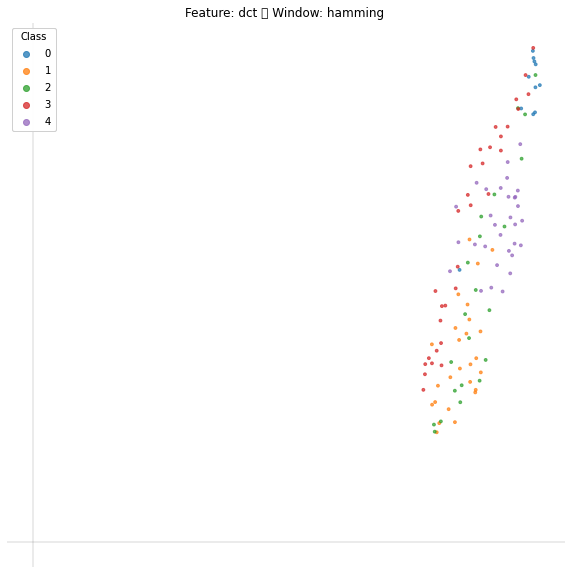

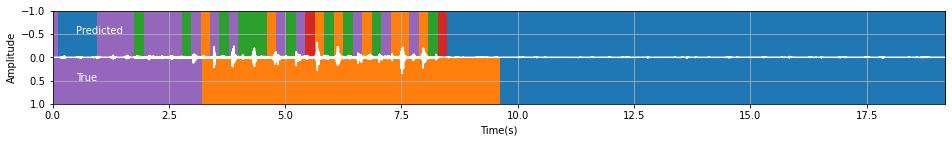

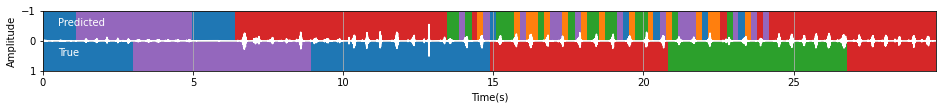

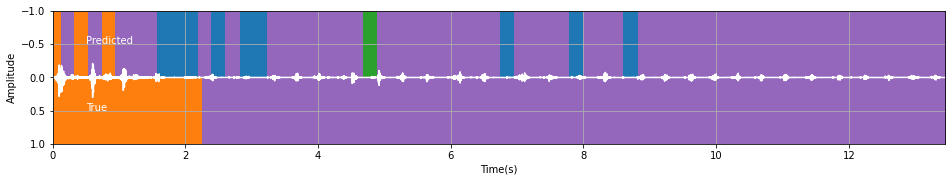

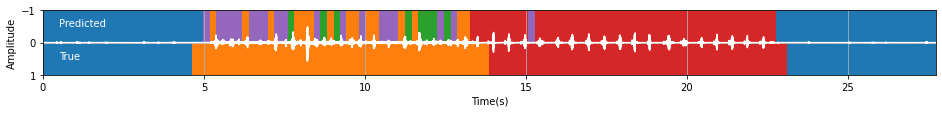

...

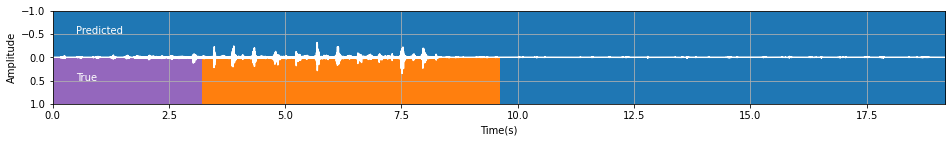

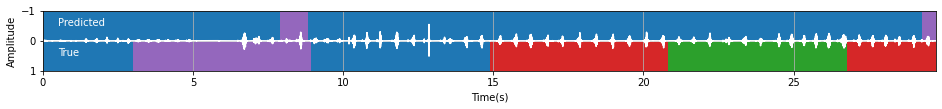

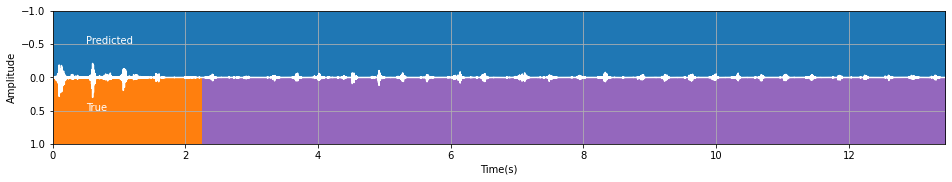

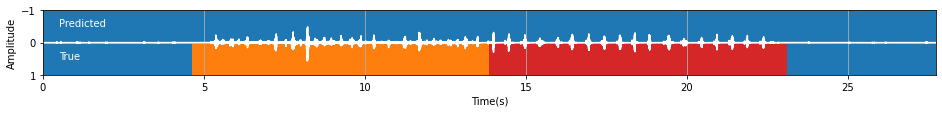

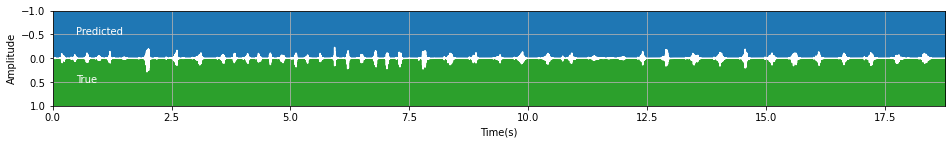

In [37]:
#Dictionary to keep the record of scores for every corresponding value of feature and window
ump_score_features_new = {}

#Features 
features= ['dct', 'fft', 'fft_phase', 'dct_phase', 'cepstrum', 'raw']
#Windows
windows= ['hamming', 'hann', 'boxcar', 'blackmanharris']

for i in features:
    for j in windows:
        
        #Random window size
        window_size = np.random.randint(36, 6000)
        #Random step size
        step_size = np.random.randint(36,window_size)
        
        #Creating different parameters with random window size for every combination of feature and window
        parameters = {
            'size': window_size,
            'step': step_size,
            'decimate': 1,
            'feature_range': (0.0, 1.0),
            'window_fn': j,
            'feature_fn': i
        }
        
        #Loading the data into a set of features and labels
        print(f"Feature: {i} - Window: {j}")
        X, y = audio_task.load_data(parameters)
        print("X shape: ", X.shape, "y shape: ", y.shape, "\n\n")
        
        #PLotting the visualization
        plot_ump_new(i, j)
        
        #Classifying the feature vector space and creating a graph between true and predicted value
        score=features_ump_new(X, y, parameters)
        ump_score_features_new[f"Feature -> {i} : Window -> {j} : Window_size -> {window_size} : Step_size -> {step_size}"] = score

In [38]:
#Sorting the scores from lowest to highest 

ump_scores_new = {}

keys_ump_sorted_new = sorted(ump_score_features_new, key=ump_score_features_new.get)

for i in keys_ump_sorted_new:
    ump_scores_new[i] = ump_score_features_new[i]
    
for i in ump_scores_new.keys():
    print((i, ump_scores_new[i]))

('Feature -> raw : Window -> hann : Window_size -> 5954 : Step_size -> 4866', 12.992479277870892)
('Feature -> raw : Window -> blackmanharris : Window_size -> 5368 : Step_size -> 3618', 14.338219564258704)
('Feature -> raw : Window -> hamming : Window_size -> 2903 : Step_size -> 2732', 18.30769315346908)
('Feature -> dct_phase : Window -> hamming : Window_size -> 5693 : Step_size -> 4283', 37.195951485610344)
('Feature -> fft_phase : Window -> blackmanharris : Window_size -> 5583 : Step_size -> 2766', 43.713755990608234)
('Feature -> dct_phase : Window -> boxcar : Window_size -> 5260 : Step_size -> 2447', 49.05708942806998)
('Feature -> fft_phase : Window -> boxcar : Window_size -> 3990 : Step_size -> 560', 50.596559358124104)
('Feature -> raw : Window -> boxcar : Window_size -> 1205 : Step_size -> 191', 50.708393528224306)
('Feature -> fft_phase : Window -> hann : Window_size -> 1629 : Step_size -> 1115', 51.245186586232705)
('Feature -> fft_phase : Window -> hamming : Window_size -> 

In [39]:
#The best score that we get by using Umap is 80.79.
#Feature : cepstrum
#Window : boxcar
#Window size : 2717
#Step size : 317

In [40]:
#With many iterations, we can observe that the score does not depend on the subsample value that much.

#What we find is that in most iterations the score value depends upon the window size and step size.
#For a high score value, the windows size should be high and the step size should be low.